#Parte 1

## Instalando/Importando as Bibliotecas

In [1]:
!pip install seaborn

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

## Carregamento do conjunto de dados:

In [3]:
url = "https://raw.githubusercontent.com/GuiRibCarra/Ciencia_de_Dados_Pokemon/main/attacks.csv"
df = pd.read_csv(url)
url2 = "https://raw.githubusercontent.com/GuiRibCarra/Ciencia_de_Dados_Pokemon/main/combats_final.csv"
df2 = pd.read_csv(url2, sep = ";")
url3 = "https://raw.githubusercontent.com/GuiRibCarra/Ciencia_de_Dados_Pokemon/main/pokemon.csv"
df3 = pd.read_csv(url3)

## Visualizações

Analise das dataframes para verificação de anomalias nos dados e retirar dados estatisticos

### Primeira linha dos dataframes##

No primeiro arquivo da base de dados, que é a base de dados dos attacks possui tais atributos abaixo, sendo que os atributos que podem ser analizados melhor são:

* Poder
* Categoria
* Tipo
* Chance de Acerto

In [4]:
print(df.head())

   ID   Nome Golpe  Poder Categoria      Tipo  Chance de Acerto
0   1        pound     40    Fisico    Normal               100
1   2  karate-chop     50    Fisico  Fighting               100
2   3  double-slap     15    Fisico    Normal                85
3   4  comet-punch     18    Fisico    Normal                85
4   5   mega-punch     80    Fisico    Normal                85


No segundo arquivo da base de dados, que é a base de dados dos combates possui tais atributos abaixo, sendo que essa sera a base de dados que sera realizado o teste e depois a predição de qual pokemon ganhou atraves do Id do pokemon e dos attacks dele:

In [5]:
print(df2.head())

   ID  First_pokemon  First_attack  Second_attack  Third_attack  Fouth_attack  \
0   0            266            88            173           259           514   
1   1            702            14            345           444           224   
2   2            191           164            113           416           416   
3   3            237           213            156            36           341   
4   4            151           182            362           504           390   

   Second_pokemon  First_attack.1  Second_attack.1  Third_attack.1  \
0             298             447              345              63   
1             701             404              164              63   
2             668             451              211             485   
3             683             401              182             610   
4             231             341              343             230   

   Fouth_attack.1  Winner  
0              91     298  
1             370     701  
2       

No terceiro arquivo da base de dados, que é a base de dados dos pokemons possui tais atributos abaixo, sendo que os atributos que podem ser analizados melhor são:

* Type 1 (primeiro tipo do pokemon)
* Type 2 (segundo tipo do pokemon, podendo ser nulo ou não)
* HP
* Attack
* Defense
* Sp. Atk
* Sp. Def
* Speed
* Generation
* Legendary

In [6]:
print(df3.head())

   #           Name Type 1  Type 2  HP  Attack  Defense  Sp. Atk  Sp. Def  \
0  1      Bulbasaur  Grass  Poison  45      49       49       65       65   
1  2        Ivysaur  Grass  Poison  60      62       63       80       80   
2  3       Venusaur  Grass  Poison  80      82       83      100      100   
3  4  Mega Venusaur  Grass  Poison  80     100      123      122      120   
4  5     Charmander   Fire     NaN  39      52       43       60       50   

   Speed  Generation  Legendary  
0     45           1      False  
1     60           1      False  
2     80           1      False  
3     80           1      False  
4     65           1      False  


### Informações do Dataframe

In [7]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 621 entries, 0 to 620
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ID                621 non-null    int64 
 1   Nome Golpe        621 non-null    object
 2   Poder             621 non-null    int64 
 3   Categoria         621 non-null    object
 4   Tipo              621 non-null    object
 5   Chance de Acerto  621 non-null    int64 
dtypes: int64(3), object(3)
memory usage: 29.2+ KB
None


In [8]:
print(df2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               50000 non-null  int64
 1   First_pokemon    50000 non-null  int64
 2   First_attack     50000 non-null  int64
 3   Second_attack    50000 non-null  int64
 4   Third_attack     50000 non-null  int64
 5   Fouth_attack     50000 non-null  int64
 6   Second_pokemon   50000 non-null  int64
 7   First_attack.1   50000 non-null  int64
 8   Second_attack.1  50000 non-null  int64
 9   Third_attack.1   50000 non-null  int64
 10  Fouth_attack.1   50000 non-null  int64
 11  Winner           50000 non-null  int64
dtypes: int64(12)
memory usage: 4.6 MB
None


In [9]:
print(df3.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   #           800 non-null    int64 
 1   Name        800 non-null    object
 2   Type 1      800 non-null    object
 3   Type 2      414 non-null    object
 4   HP          800 non-null    int64 
 5   Attack      800 non-null    int64 
 6   Defense     800 non-null    int64 
 7   Sp. Atk     800 non-null    int64 
 8   Sp. Def     800 non-null    int64 
 9   Speed       800 non-null    int64 
 10  Generation  800 non-null    int64 
 11  Legendary   800 non-null    bool  
dtypes: bool(1), int64(8), object(3)
memory usage: 69.7+ KB
None


### Estatísticas Descritivas

In [10]:
print(df.describe())

               ID       Poder  Chance de Acerto
count  621.000000  621.000000        621.000000
mean   311.000000   47.045089         95.789050
std    179.411538   48.760387          9.838483
min      1.000000    0.000000         30.000000
25%    156.000000    0.000000        100.000000
50%    311.000000   40.000000        100.000000
75%    466.000000   80.000000        100.000000
max    621.000000  300.000000        100.000000


In [11]:
print(df2.describe())

                 ID  First_pokemon  First_attack  Second_attack  Third_attack  \
count  50000.000000   50000.000000  50000.000000   50000.000000  50000.000000   
mean   24999.500000     400.495640    253.505880     254.031880    252.725200   
std    14433.901067     229.549429    155.682823     155.710317    155.184728   
min        0.000000       1.000000      1.000000       1.000000      1.000000   
25%    12499.750000     203.000000    120.000000     126.000000    120.000000   
50%    24999.500000     399.000000    231.000000     231.000000    231.000000   
75%    37499.250000     597.250000    371.000000     371.000000    370.000000   
max    49999.000000     800.000000    621.000000     621.000000    621.000000   

       Fouth_attack  Second_pokemon  First_attack.1  Second_attack.1  \
count  50000.000000    50000.000000    50000.000000     50000.000000   
mean     253.151540      403.159660      253.416940       252.288100   
std      155.708311      230.083644      155.841115   

In [12]:
print(df3.describe())

              #          HP      Attack     Defense     Sp. Atk     Sp. Def  \
count  800.0000  800.000000  800.000000  800.000000  800.000000  800.000000   
mean   400.5000   69.258750   79.001250   73.842500   72.820000   71.902500   
std    231.0844   25.534669   32.457366   31.183501   32.722294   27.828916   
min      1.0000    1.000000    5.000000    5.000000   10.000000   20.000000   
25%    200.7500   50.000000   55.000000   50.000000   49.750000   50.000000   
50%    400.5000   65.000000   75.000000   70.000000   65.000000   70.000000   
75%    600.2500   80.000000  100.000000   90.000000   95.000000   90.000000   
max    800.0000  255.000000  190.000000  230.000000  194.000000  230.000000   

            Speed  Generation  
count  800.000000   800.00000  
mean    68.277500     3.32375  
std     29.060474     1.66129  
min      5.000000     1.00000  
25%     45.000000     2.00000  
50%     65.000000     3.00000  
75%     90.000000     5.00000  
max    180.000000     6.00000  


### Verificando Valores Nulos

In [13]:
print(df.isnull().sum())

ID                  0
Nome Golpe          0
Poder               0
Categoria           0
Tipo                0
Chance de Acerto    0
dtype: int64


In [14]:
print(df2.isnull().sum())

ID                 0
First_pokemon      0
First_attack       0
Second_attack      0
Third_attack       0
Fouth_attack       0
Second_pokemon     0
First_attack.1     0
Second_attack.1    0
Third_attack.1     0
Fouth_attack.1     0
Winner             0
dtype: int64


In [15]:
print(df3.isnull().sum())

#               0
Name            0
Type 1          0
Type 2        386
HP              0
Attack          0
Defense         0
Sp. Atk         0
Sp. Def         0
Speed           0
Generation      0
Legendary       0
dtype: int64


o unico dataframe que possui valore nulos é o dos pokemons, porém não é considerado anomalia pelo fato de que existe pokemons com apenas 1 tipo, ou seja, não possui o Type 2.

### Analise de Porcentagem de Nulos

In [16]:
df_analise_nulos = pd.DataFrame({'Colunas': df.columns,
                       'Tipos': df.dtypes,
                       'Percentual Nulos': df.isna().sum()/df.shape[0]})
df_analise_nulos

,Colunas,Tipos,Percentual Nulos
ID,ID,int64,0.0
Nome Golpe,Nome Golpe,object,0.0
Poder,Poder,int64,0.0
Categoria,Categoria,object,0.0
Tipo,Tipo,object,0.0
Chance de Acerto,Chance de Acerto,int64,0.0


In [17]:
df2_analise_nulos = pd.DataFrame({'Colunas': df2.columns,
                       'Tipos': df2.dtypes,
                       'Percentual Nulos': df2.isna().sum()/df2.shape[0]})
df2_analise_nulos

,Colunas,Tipos,Percentual Nulos
ID,ID,int64,0.0
First_pokemon,First_pokemon,int64,0.0
First_attack,First_attack,int64,0.0
Second_attack,Second_attack,int64,0.0
Third_attack,Third_attack,int64,0.0
Fouth_attack,Fouth_attack,int64,0.0
Second_pokemon,Second_pokemon,int64,0.0
First_attack.1,First_attack.1,int64,0.0
Second_attack.1,Second_attack.1,int64,0.0
Third_attack.1,Third_attack.1,int64,0.0


In [18]:
df3_analise_nulos = pd.DataFrame({'Colunas': df3.columns,
                       'Tipos': df3.dtypes,
                       'Percentual Nulos': df3.isna().sum()/df3.shape[0]})
df3_analise_nulos

,Colunas,Tipos,Percentual Nulos
#,#,int64,0.0000
Name,Name,object,0.0000
Type 1,Type 1,object,0.0000
Type 2,Type 2,object,0.4825
HP,HP,int64,0.0000
Attack,Attack,int64,0.0000
Defense,Defense,int64,0.0000
Sp. Atk,Sp. Atk,int64,0.0000
Sp. Def,Sp. Def,int64,0.0000
Speed,Speed,int64,0.0000


##Analise Exploratória Pokemons

### Distribuição dos Base Stats

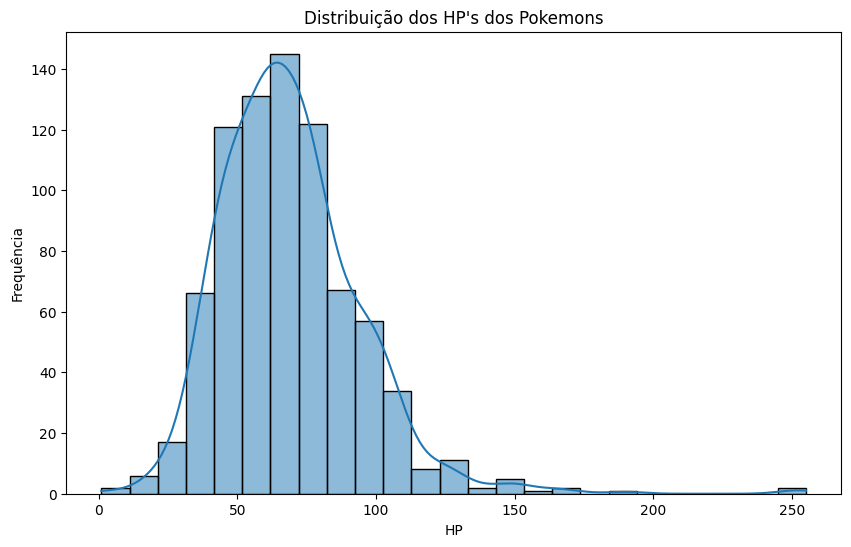

In [19]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df3, x='HP', bins=25, kde=True) #Criação de Histograma
plt.title("Distribuição dos HP's dos Pokemons")  #Alteração do titulo
plt.xlabel("HP")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

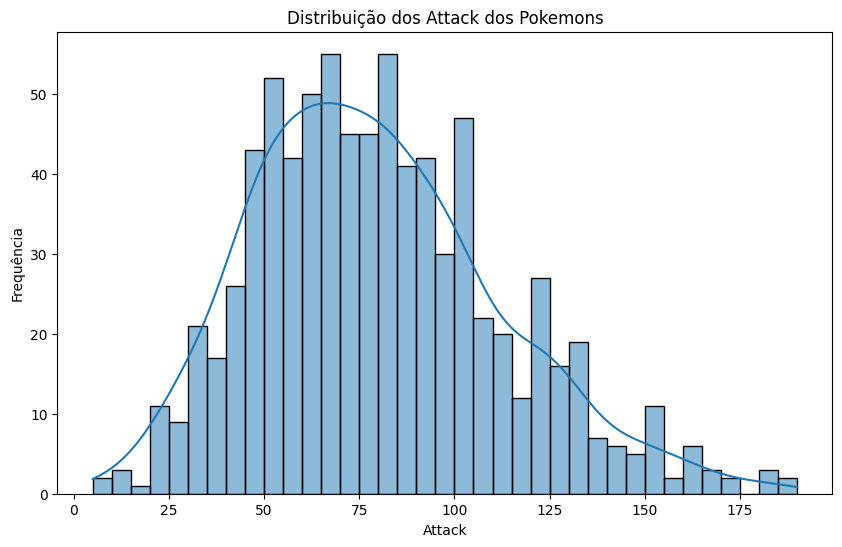

In [20]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df3, x='Attack', bins=37, kde=True) #Criação de Histograma
plt.title("Distribuição dos Attack dos Pokemons")  #Alteração do titulo
plt.xlabel("Attack")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

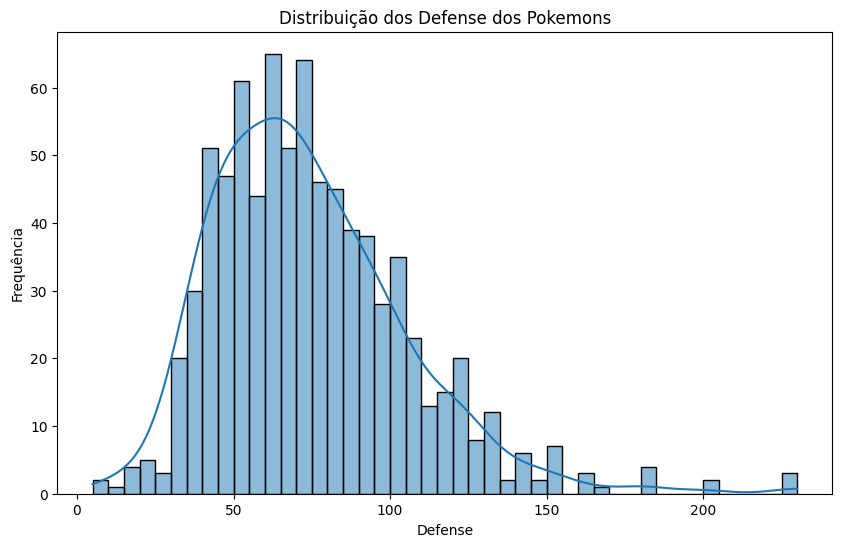

In [21]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df3, x='Defense', bins=45, kde=True) #Criação de Histograma
plt.title("Distribuição dos Defense dos Pokemons")  #Alteração do titulo
plt.xlabel("Defense")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

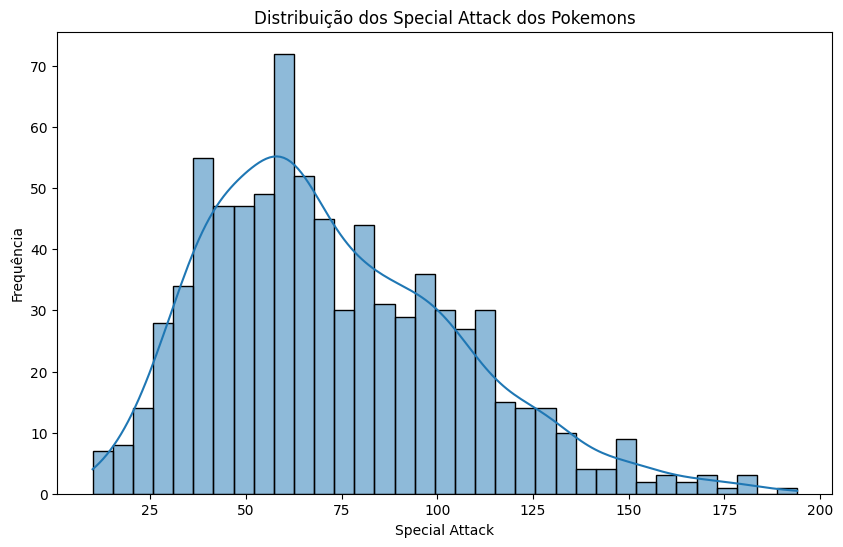

In [22]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df3, x='Sp. Atk', bins=35, kde=True) #Criação de Histograma
plt.title("Distribuição dos Special Attack dos Pokemons")  #Alteração do titulo
plt.xlabel("Special Attack")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

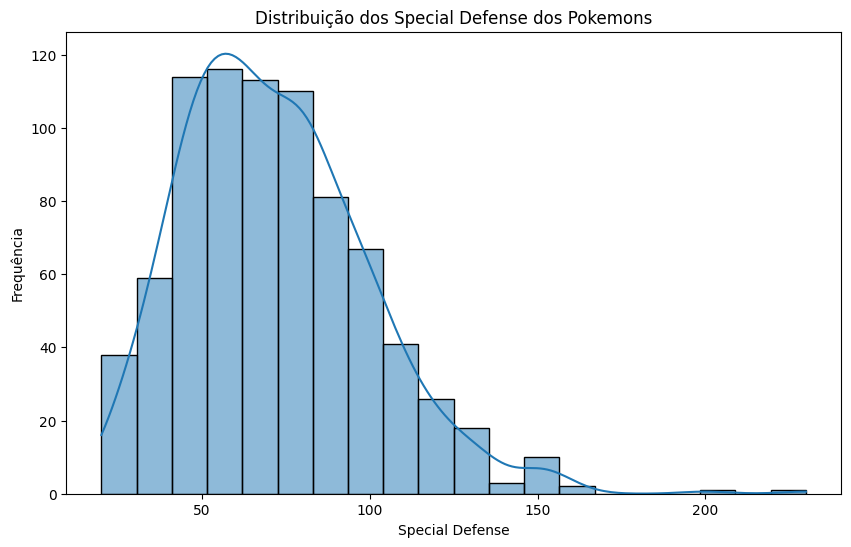

In [23]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df3, x='Sp. Def', bins=20, kde=True) #Criação de Histograma
plt.title("Distribuição dos Special Defense dos Pokemons")  #Alteração do titulo
plt.xlabel("Special Defense")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

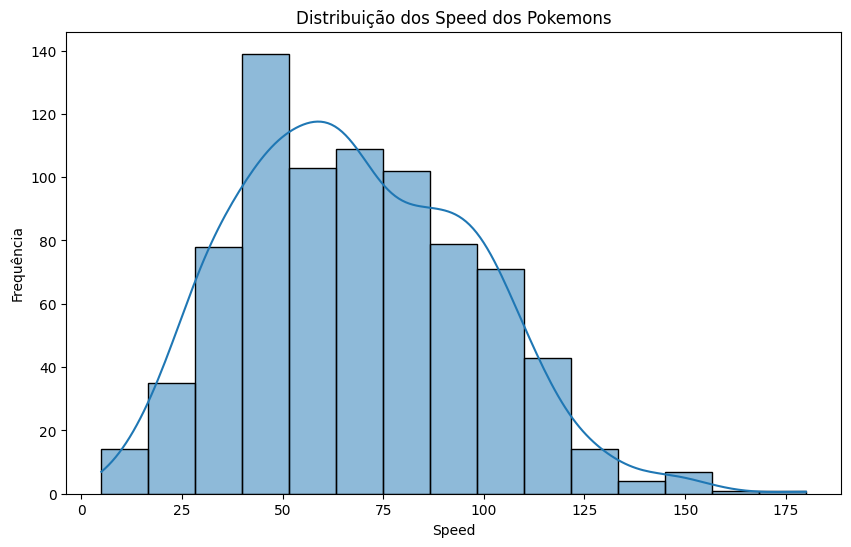

In [24]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df3, x='Speed', bins=15, kde=True) #Criação de Histograma
plt.title("Distribuição dos Speed dos Pokemons")  #Alteração do titulo
plt.xlabel("Speed")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

### Distribuição dos Pokemons nas Gerações

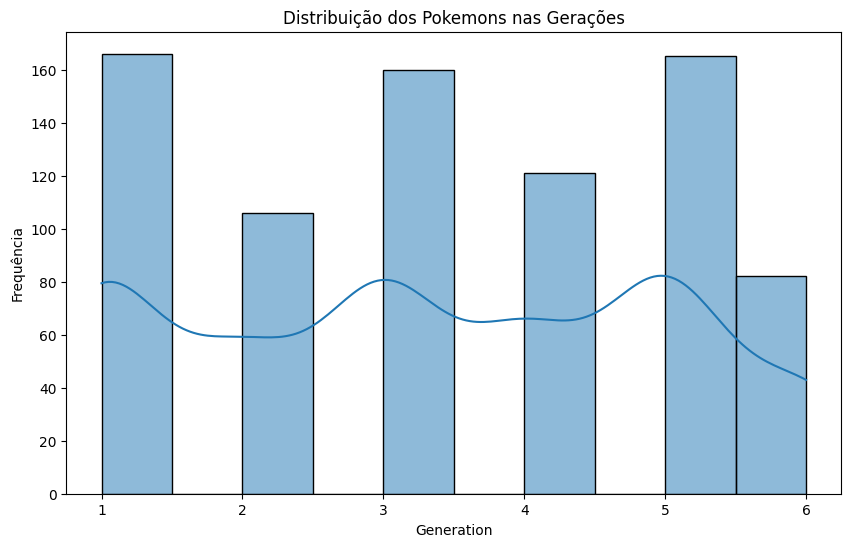

In [25]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df3, x='Generation', bins=10, kde=True) #Criação de Histograma
plt.title("Distribuição dos Pokemons nas Gerações")  #Alteração do titulo
plt.xlabel("Generation")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

Pokemons Lendarios

<Axes: xlabel='Generation', ylabel='Count'>

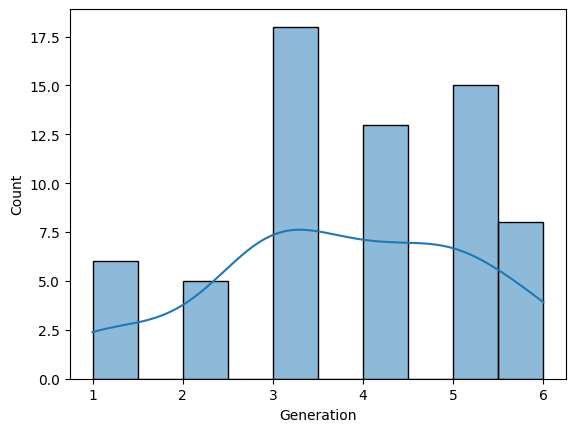

In [26]:
sns.histplot(data=df3[df3['Legendary']==True], x="Generation", bins=10, kde=True)

###Contagem dos Tipos

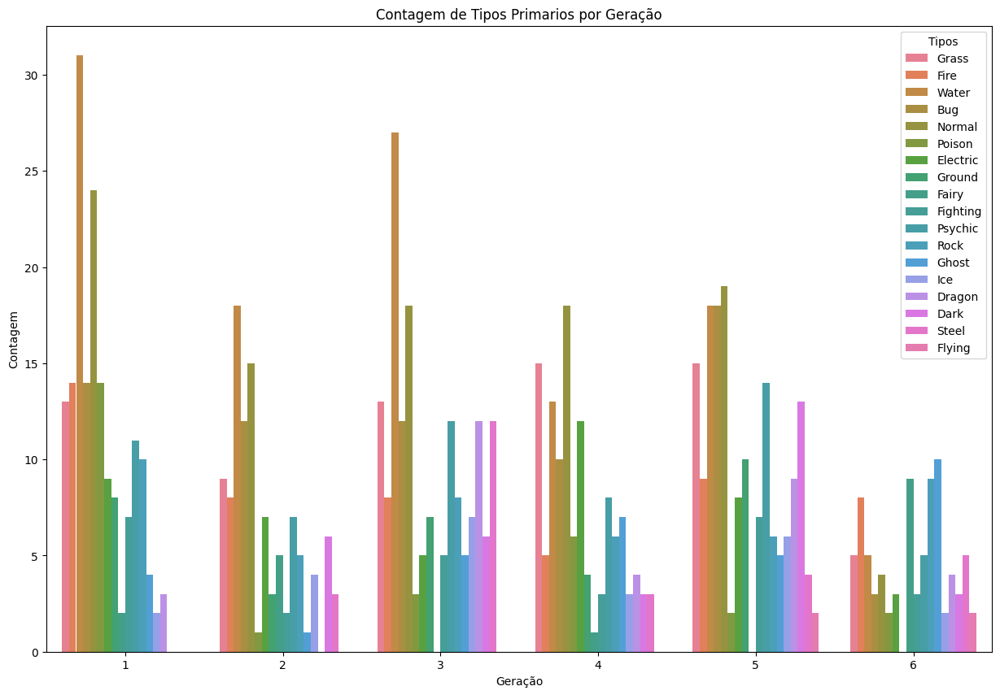

In [27]:
plt.figure(figsize=(15, 10)) #criação do tamanho da figura
sns.countplot(data=df3, x="Generation", hue="Type 1") #Criação de Histograma
plt.title("Contagem de Tipos Primarios por Geração")    #Alteração do titulo
plt.xlabel("Geração")                          #Alteração do indicador do eixo X
plt.ylabel("Contagem")                             #Alteração do indicador do eixo Y
plt.legend(title="Tipos")                           #Adicionar titulo à legenda
plt.show()                                         #Mostrar a imagem

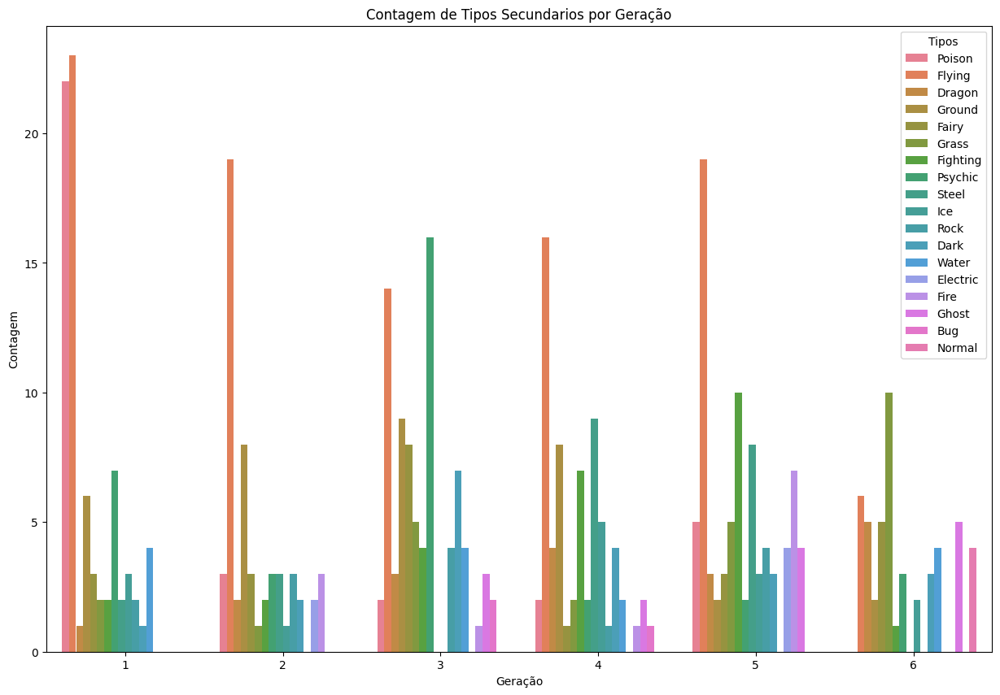

In [28]:
plt.figure(figsize=(15, 10)) #criação do tamanho da figura
sns.countplot(data=df3, x="Generation", hue="Type 2") #Criação de Histograma
plt.title("Contagem de Tipos Secundarios por Geração")    #Alteração do titulo
plt.xlabel("Geração")                          #Alteração do indicador do eixo X
plt.ylabel("Contagem")                             #Alteração do indicador do eixo Y
plt.legend(title="Tipos")                           #Adicionar titulo à legenda
plt.show()                                         #Mostrar a imagem

### Relação Base Stats

####HP


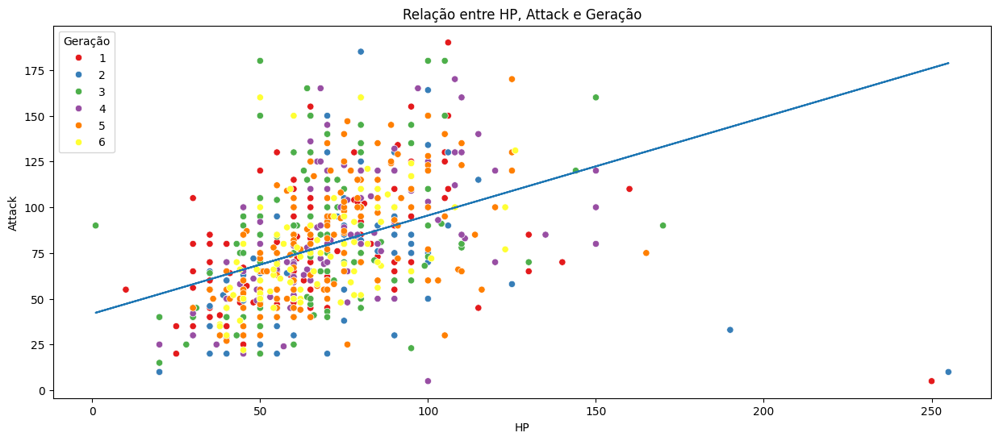

In [29]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="HP", y="Attack", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Attack e Geração") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Attack")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['HP']
y = df3['Attack']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

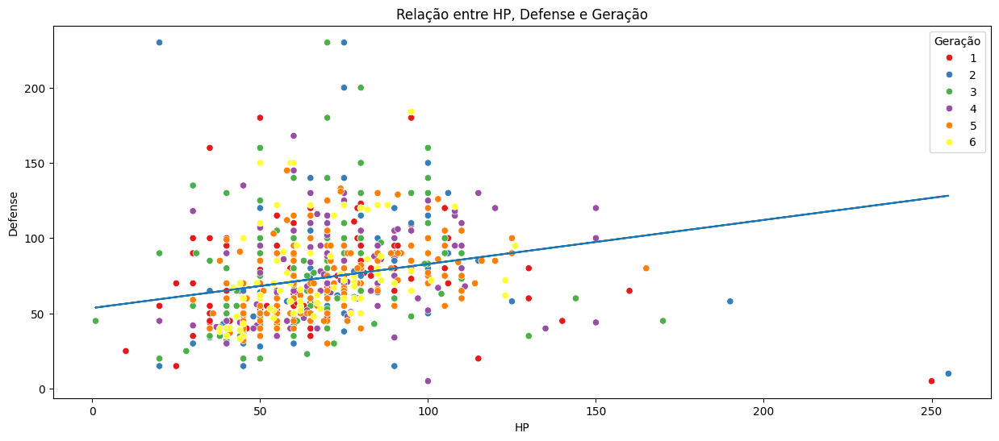

In [30]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="HP", y="Defense", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Defense e Geração") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Defense")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['HP']
y = df3['Defense']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

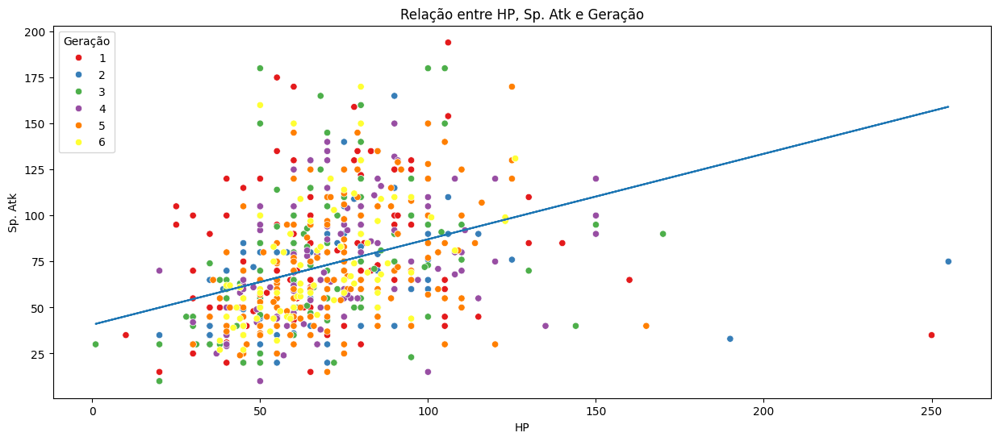

In [31]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="HP", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Sp. Atk e Geração") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['HP']
y = df3['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

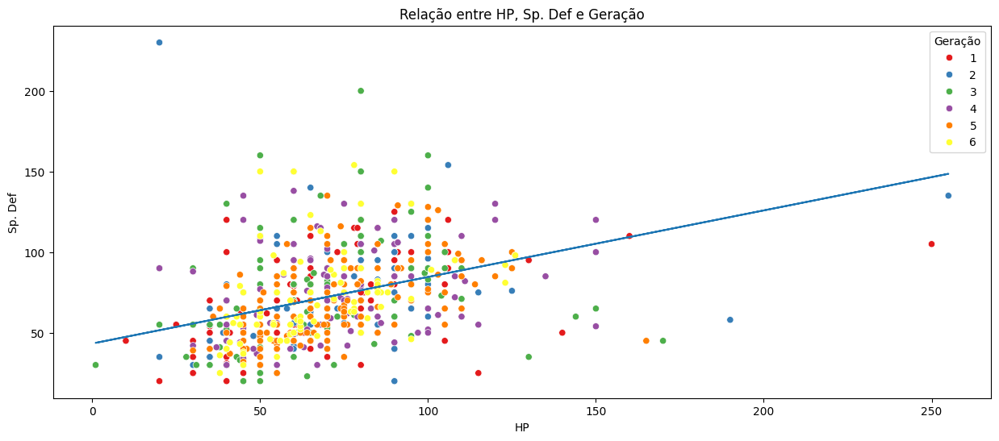

In [32]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="HP", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Sp. Def e Geração") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['HP']
y = df3['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

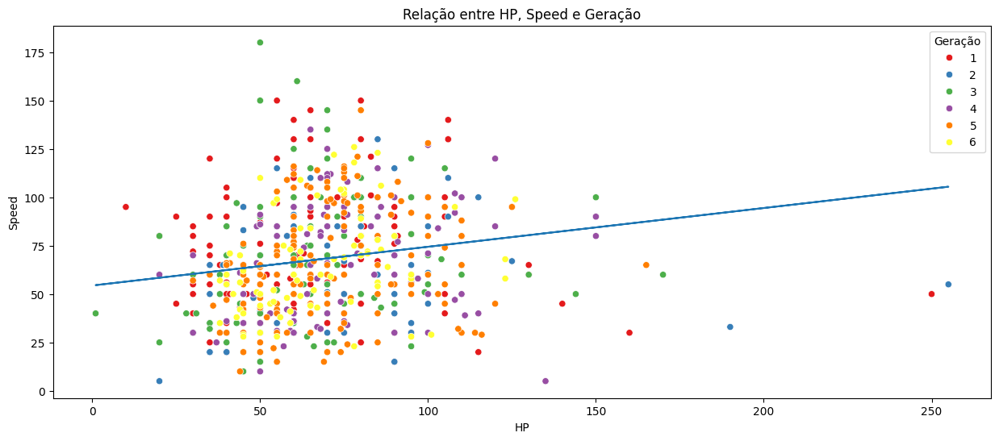

In [33]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Geração") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['HP']
y = df3['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

####Attack


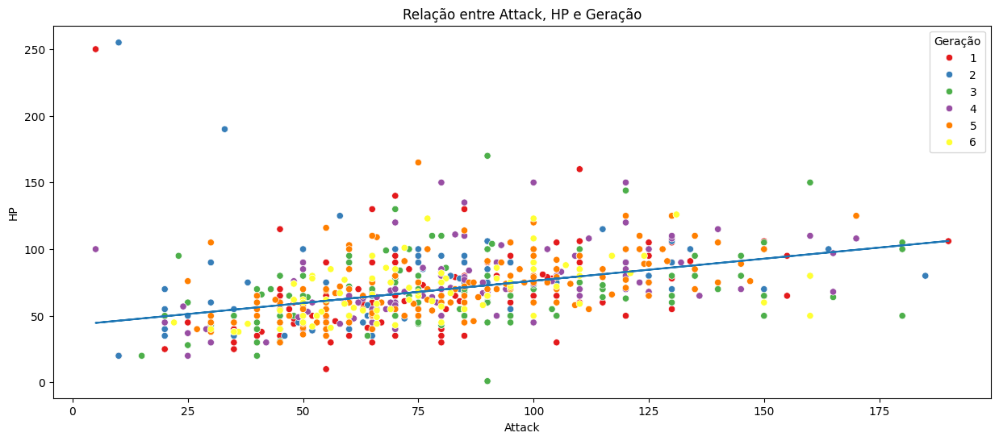

In [34]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Attack", y="HP", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, HP e Geração") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("HP")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Attack']
y = df3['HP']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

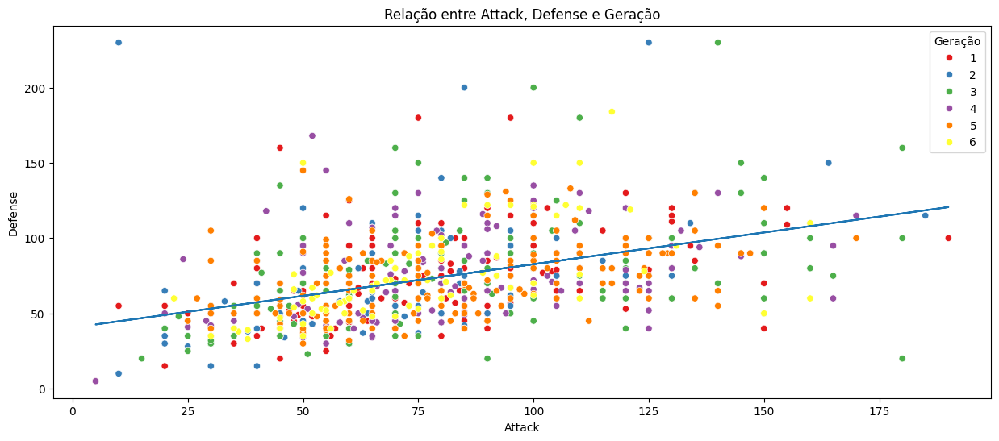

In [35]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Attack", y="Defense", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Defense e Geração") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Defense")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Attack']
y = df3['Defense']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

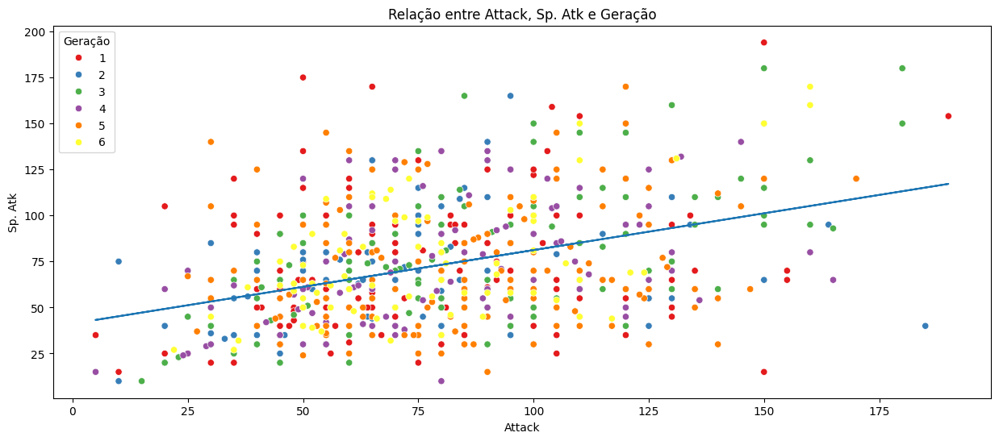

In [36]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Geração") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Attack']
y = df3['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))
plt.show()                                               #Mostrar a imagem

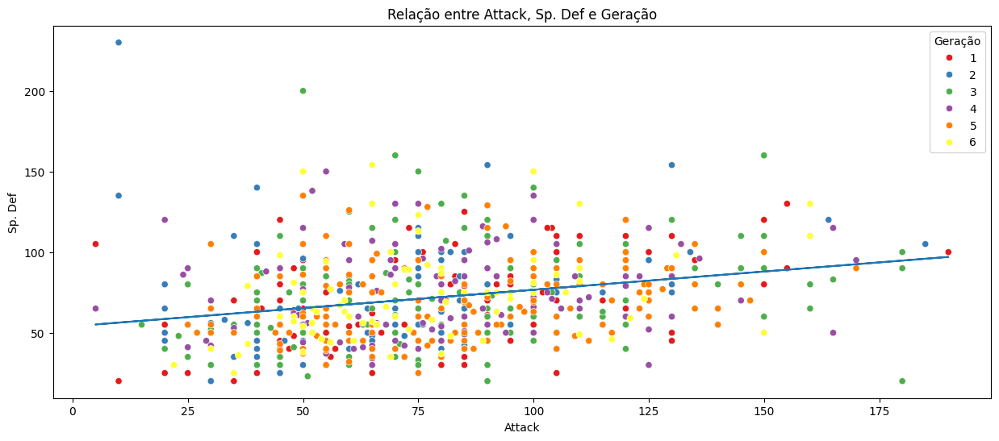

In [37]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Attack", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Def e Geração") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Attack']
y = df3['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))
plt.show()                                               #Mostrar a imagem

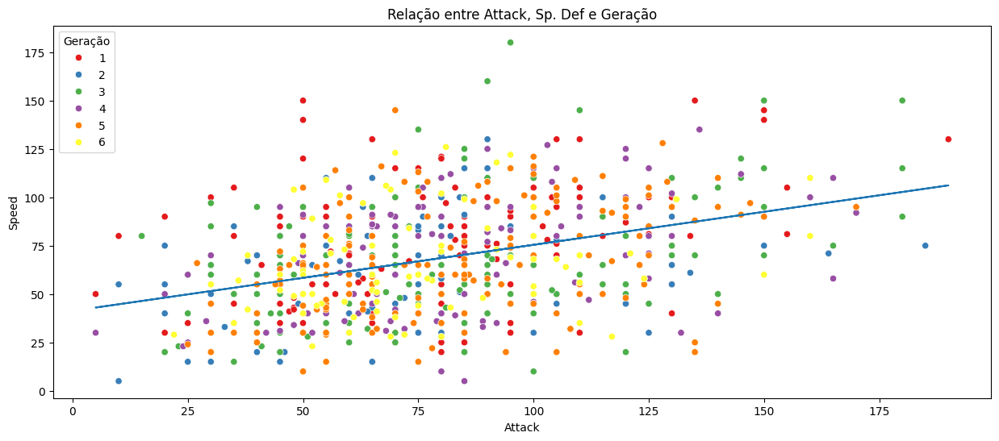

In [38]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Attack", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Def e Geração") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Attack']
y = df3['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))
plt.show()                                               #Mostrar a imagem

####Defense

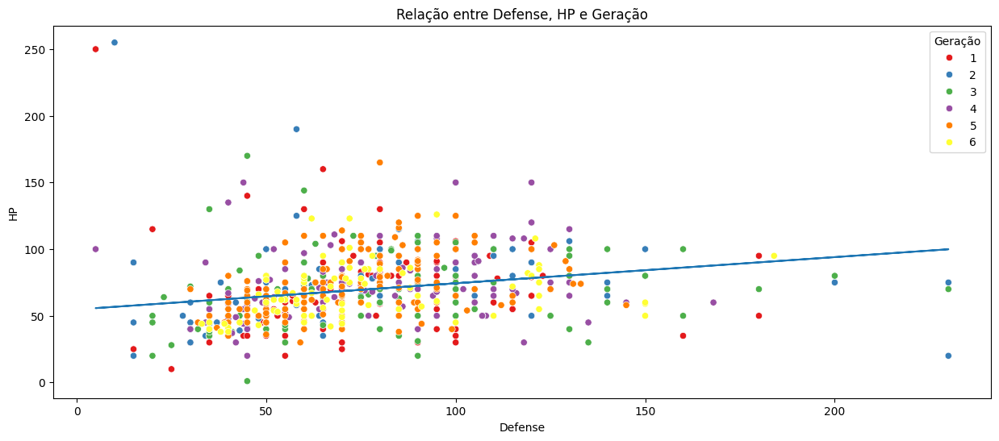

In [39]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Defense", y="HP", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, HP e Geração") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("HP")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Defense']
y = df3['HP']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

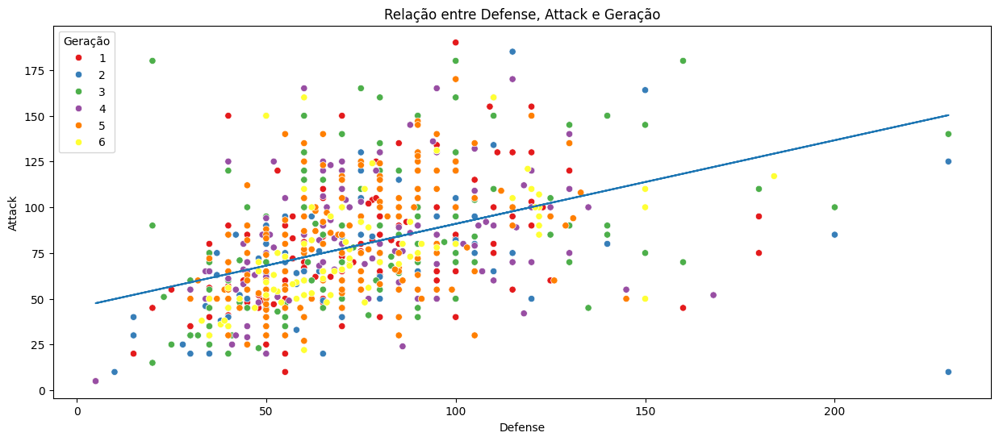

In [40]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Defense", y="Attack", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Attack e Geração") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Attack")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Defense']
y = df3['Attack']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

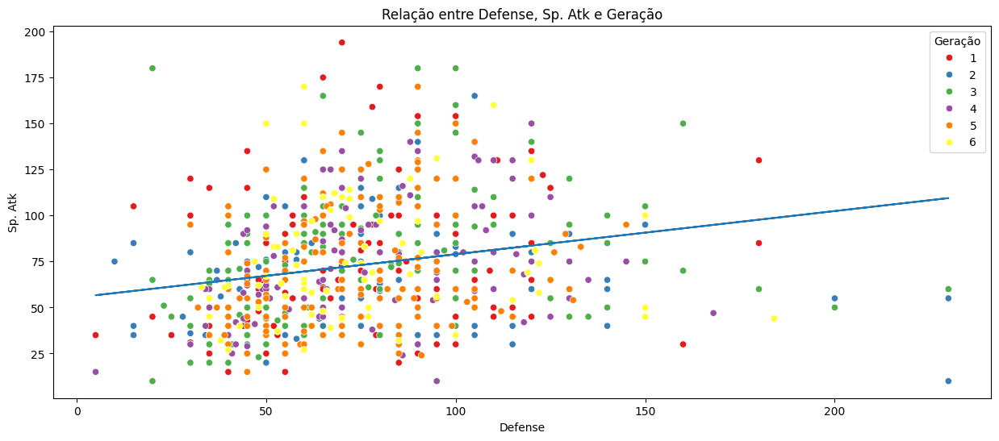

In [41]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Defense", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Atk e Geração") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Defense']
y = df3['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

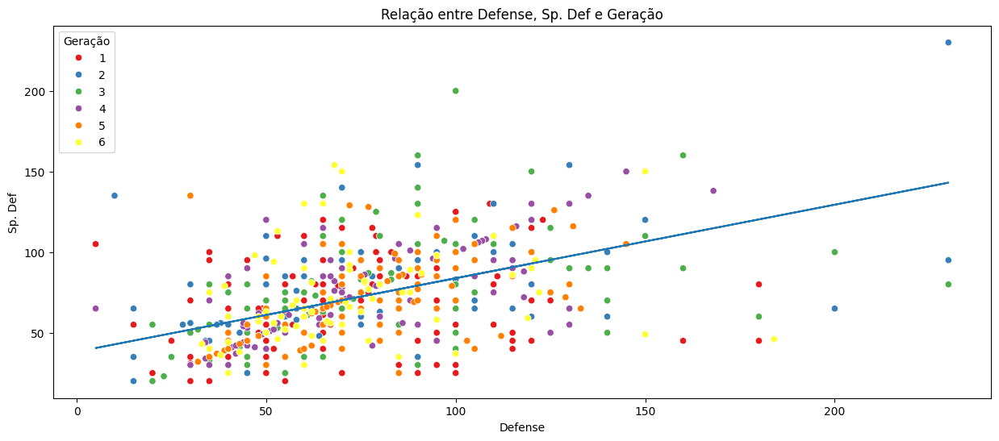

In [42]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Geração") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Defense']
y = df3['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

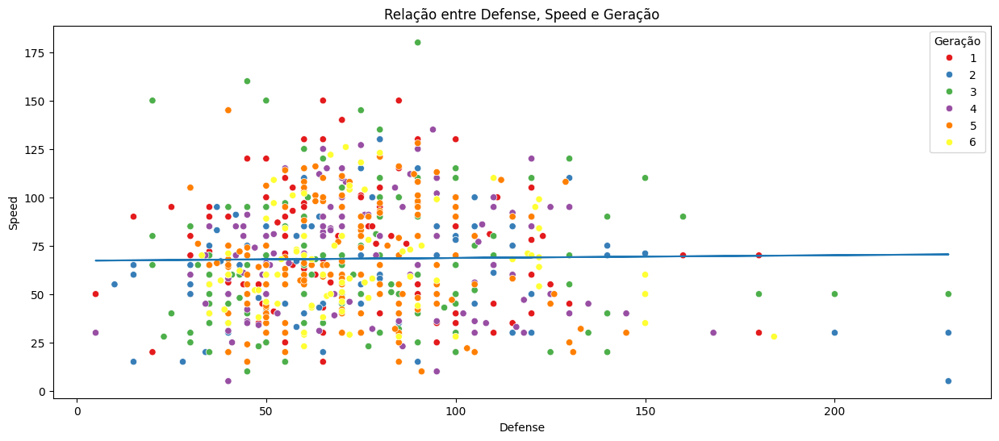

In [43]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Defense", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Speed e Geração") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Defense']
y = df3['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

####Sp. Atk


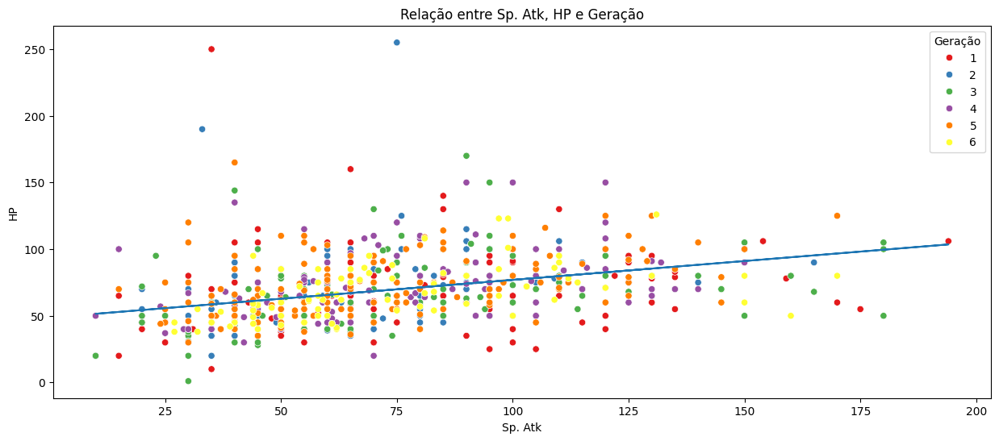

In [44]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Atk", y="HP", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Atk, HP e Geração") #Alteração do titulo
plt.xlabel("Sp. Atk")                                      #Alteração do indicador do eixo X
plt.ylabel("HP")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Atk']
y = df3['HP']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

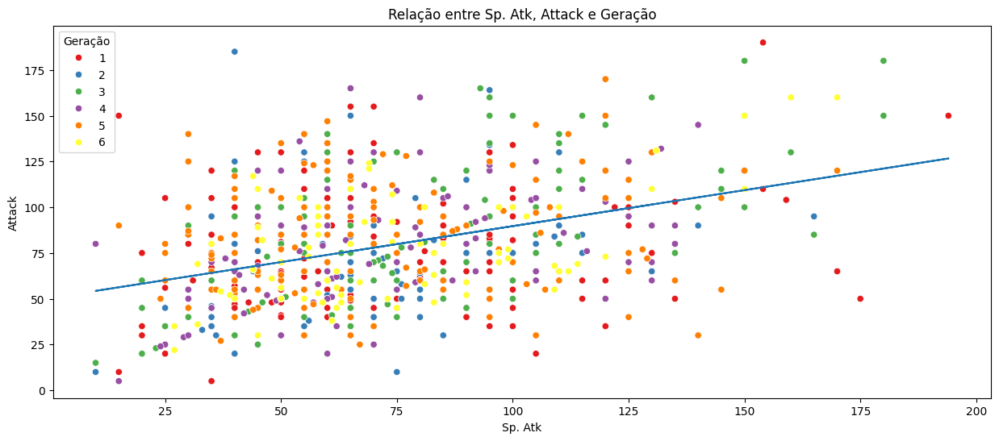

In [45]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Atk", y="Attack", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Atk, Attack e Geração") #Alteração do titulo
plt.xlabel("Sp. Atk")                                      #Alteração do indicador do eixo X
plt.ylabel("Attack")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Atk']
y = df3['Attack']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

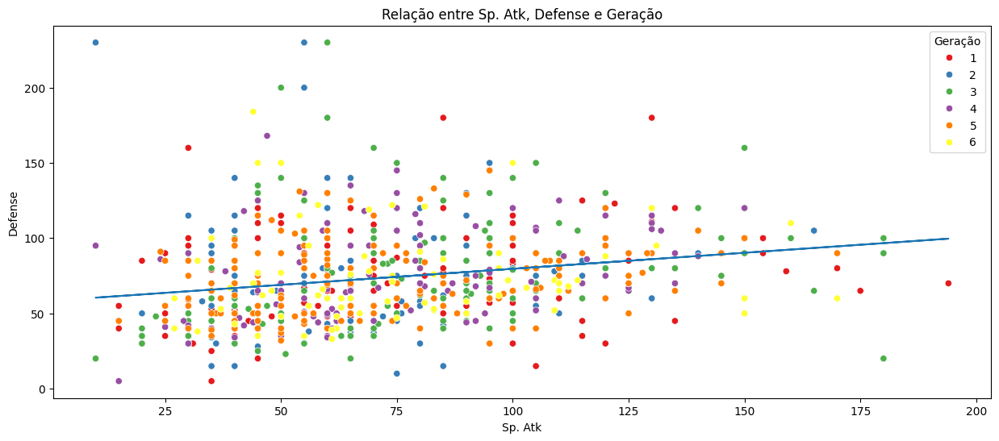

In [46]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Atk", y="Defense", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Atk, Defense e Geração") #Alteração do titulo
plt.xlabel("Sp. Atk")                                      #Alteração do indicador do eixo X
plt.ylabel("Defense")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Atk']
y = df3['Defense']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

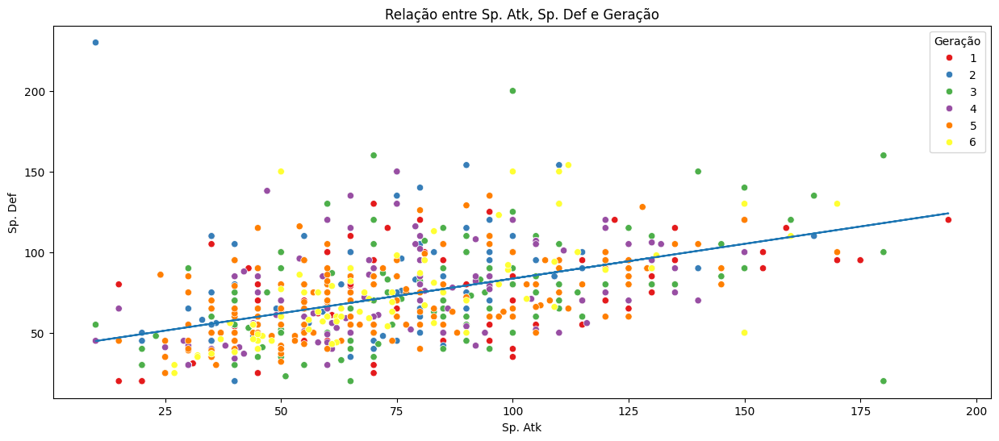

In [47]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Atk", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Atk, Sp. Def e Geração") #Alteração do titulo
plt.xlabel("Sp. Atk")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Atk']
y = df3['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

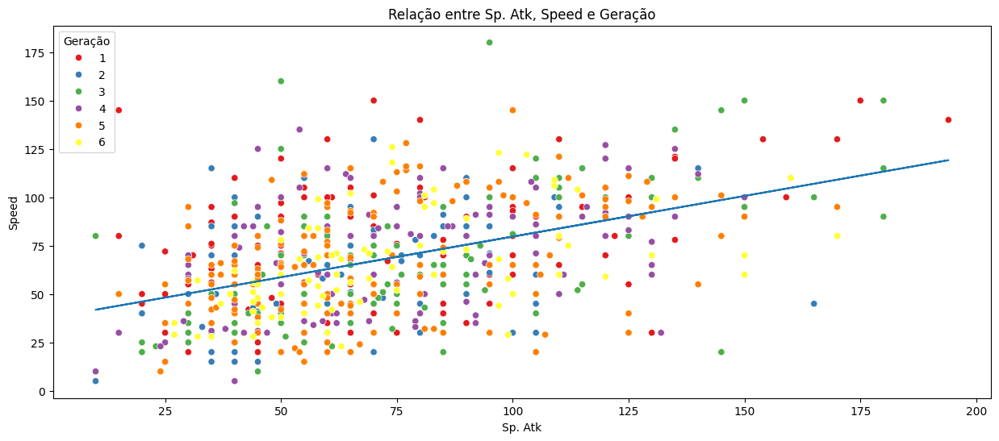

In [48]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Atk", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Atk, Speed e Geração") #Alteração do titulo
plt.xlabel("Sp. Atk")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Atk']
y = df3['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

####Sp Def

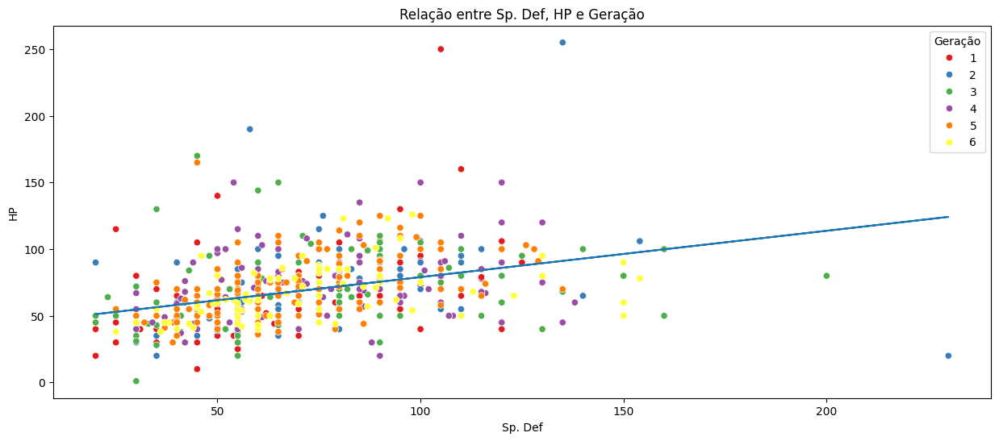

In [49]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Def", y="HP", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Def, HP e Geração") #Alteração do titulo
plt.xlabel("Sp. Def")                                      #Alteração do indicador do eixo X
plt.ylabel("HP")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Def']
y = df3['HP']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

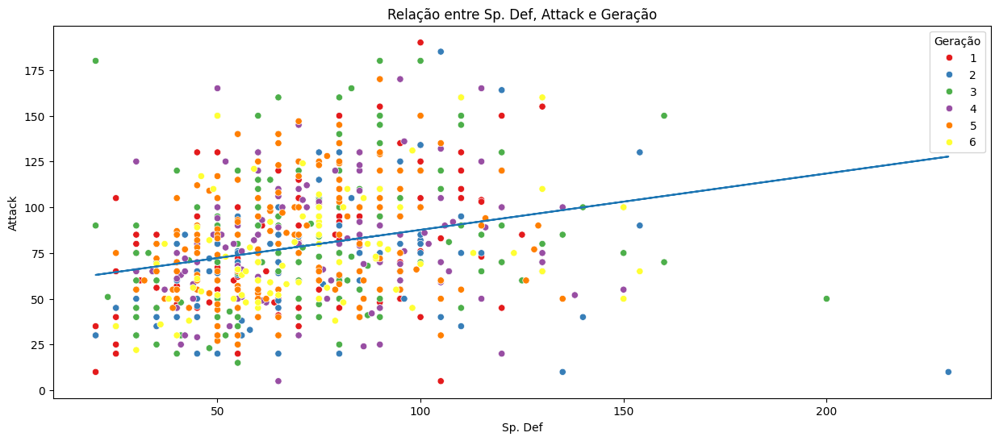

In [50]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Def", y="Attack", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Def, Attack e Geração") #Alteração do titulo
plt.xlabel("Sp. Def")                                      #Alteração do indicador do eixo X
plt.ylabel("Attack")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Def']
y = df3['Attack']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

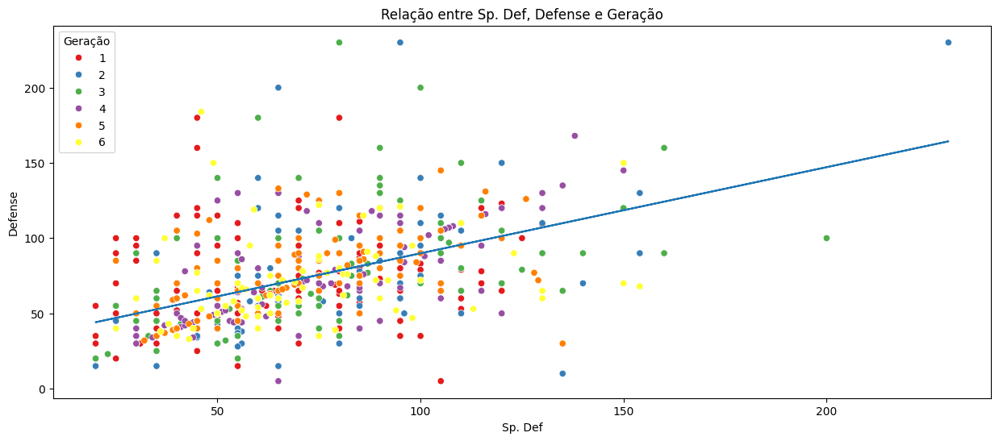

In [51]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Def", y="Defense", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Def, Defense e Geração") #Alteração do titulo
plt.xlabel("Sp. Def")                                      #Alteração do indicador do eixo X
plt.ylabel("Defense")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Def']
y = df3['Defense']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

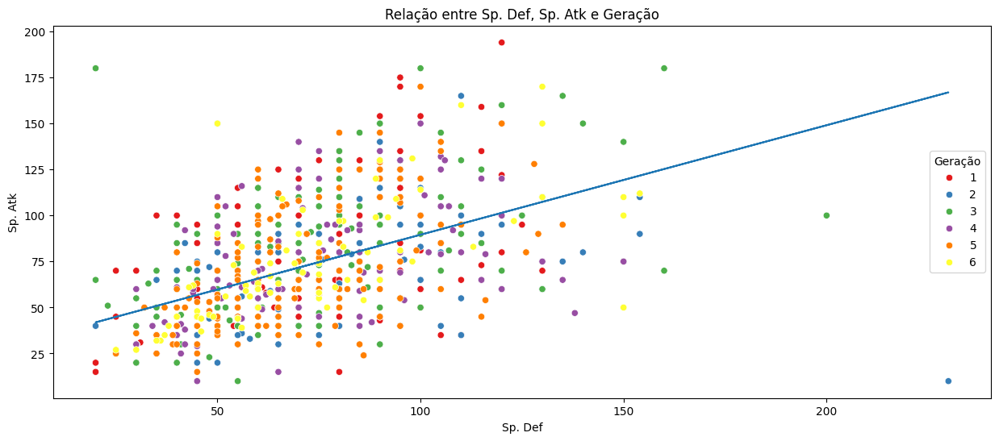

In [52]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Def", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Def, Sp. Atk e Geração") #Alteração do titulo
plt.xlabel("Sp. Def")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Def']
y = df3['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

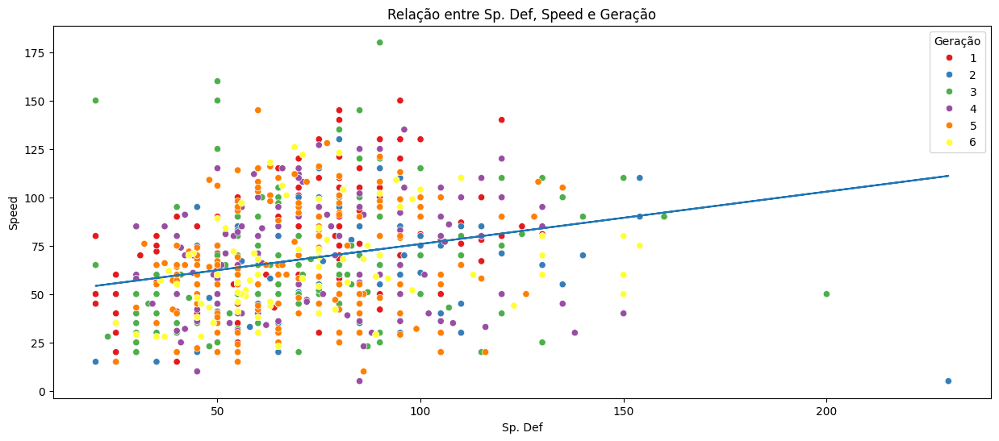

In [53]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Sp. Def", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Sp. Def, Speed e Geração") #Alteração do titulo
plt.xlabel("Sp. Def")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Sp. Def']
y = df3['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

#### Speed


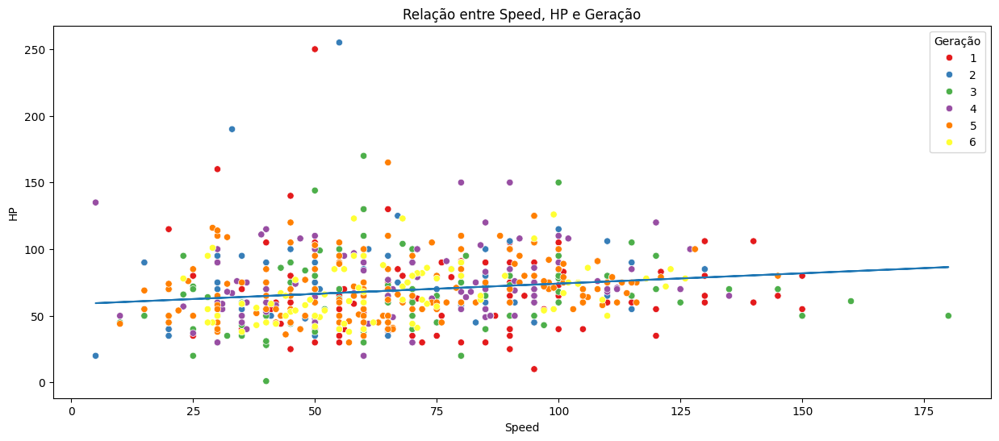

In [54]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Speed", y="HP", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Speed, HP e Geração") #Alteração do titulo
plt.xlabel("Speed")                                      #Alteração do indicador do eixo X
plt.ylabel("HP")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Speed']
y = df3['HP']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

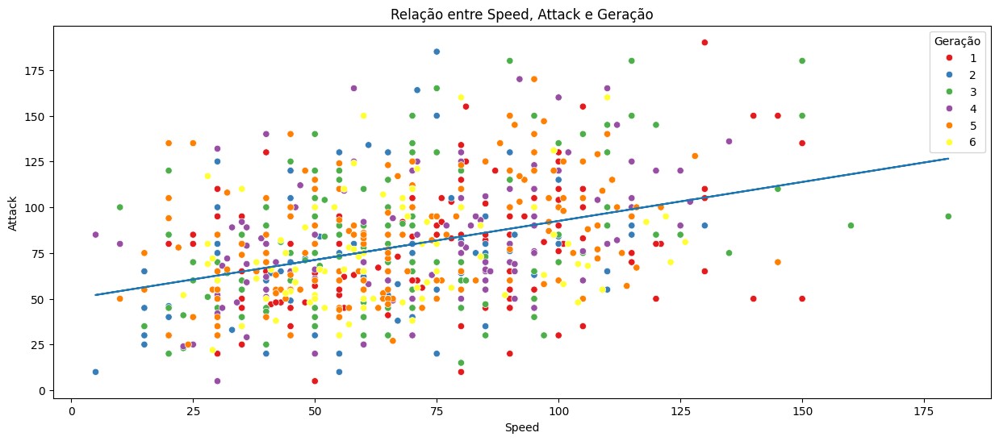

In [55]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Speed", y="Attack", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Speed, Attack e Geração") #Alteração do titulo
plt.xlabel("Speed")                                      #Alteração do indicador do eixo X
plt.ylabel("Attack")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Speed']
y = df3['Attack']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

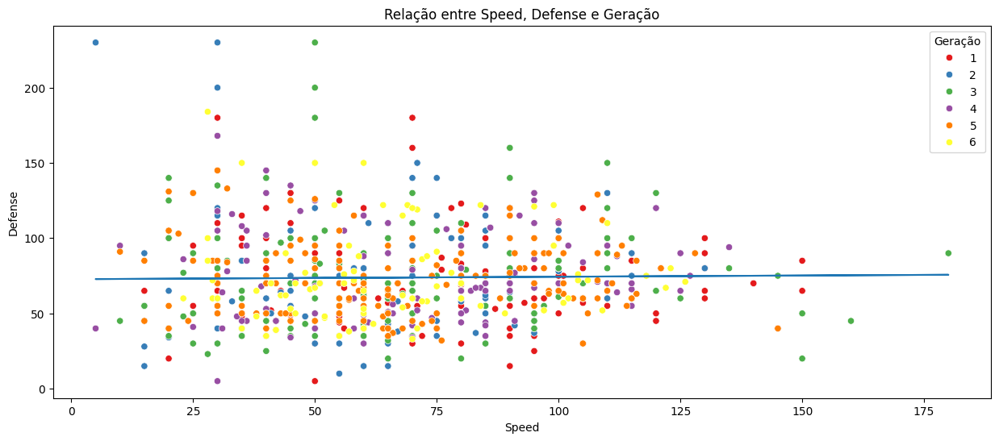

In [56]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Speed", y="Defense", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Speed, Defense e Geração") #Alteração do titulo
plt.xlabel("Speed")                                      #Alteração do indicador do eixo X
plt.ylabel("Defense")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Speed']
y = df3['Defense']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

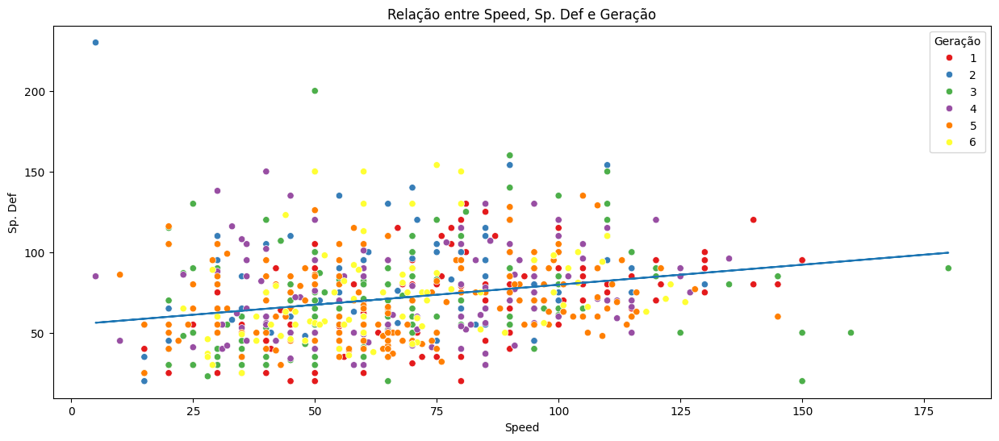

In [57]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Speed", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Speed, Sp. Def e Geração") #Alteração do titulo
plt.xlabel("Speed")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Speed']
y = df3['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

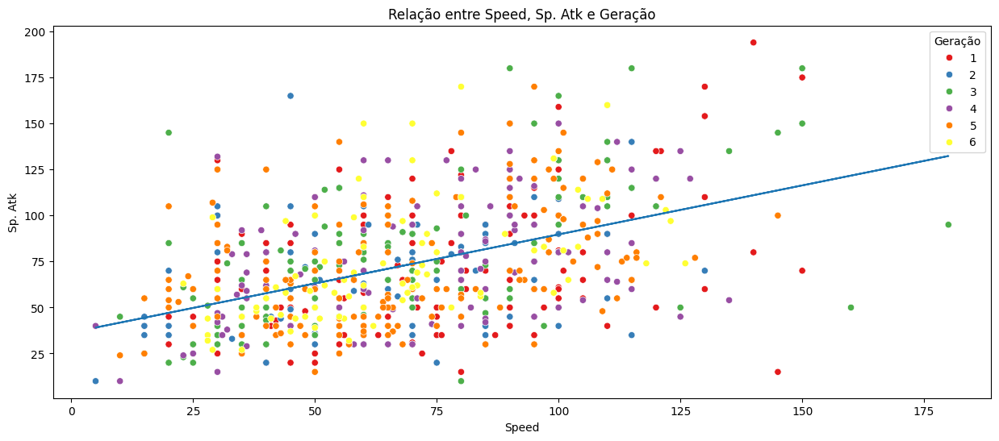

In [58]:
plt.figure(figsize=(15, 6))#criação do tamanho da figura
sns.scatterplot(data=df3, x="Speed", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Speed, Sp. Atk e Geração") #Alteração do titulo
plt.xlabel("Speed")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

x = df3['Speed']
y = df3['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

###Relação Base Stats com o Type

Esta relação é para melhor visualização e verificação se o tipo é mais ofensivo ou defensivo, baseando-se na relação entre:


*   Attack x Sp. Atk
*   Defense x Sp. Def

com isso sabe-se se a tipagem tem como caracteristica se é mais Fisica ou Especial

####Fire


#####Tipo Primario

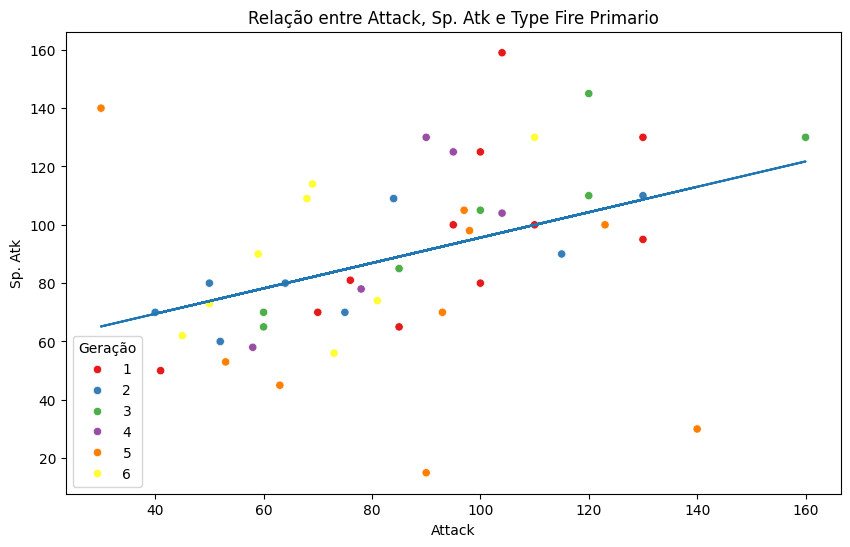

In [59]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fire'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Fire Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fire']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

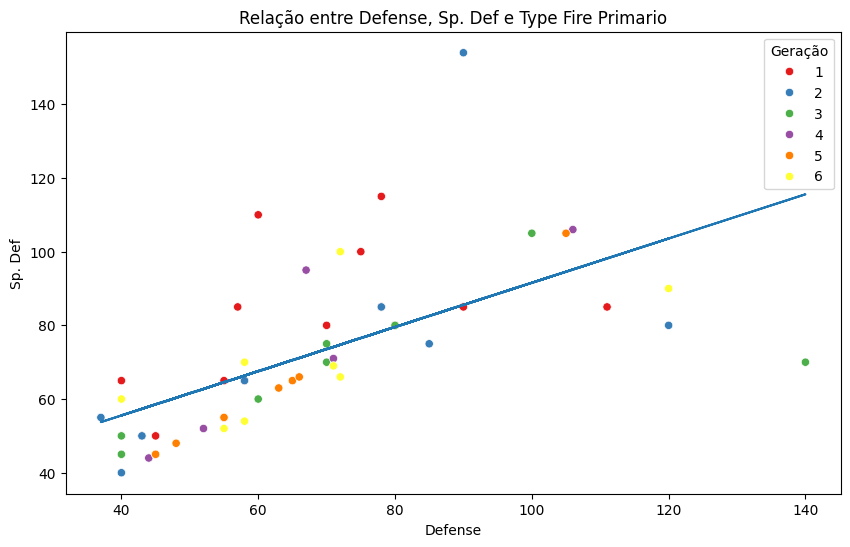

In [60]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fire'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Fire Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fire']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

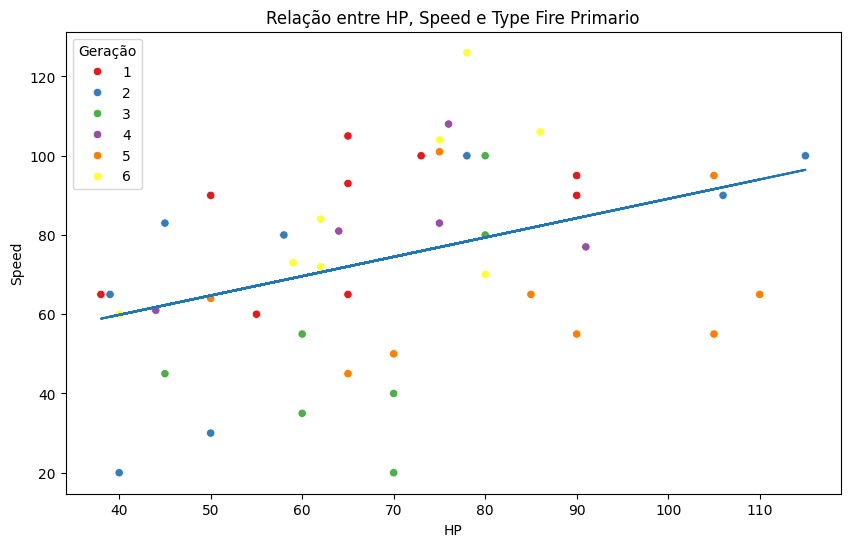

In [61]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fire'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Fire Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fire']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

Podemos perceber com os Graficos que o tipo fogo é mais ofensivo tendendo mais para o Sp. Atk e que nao são defensivos pois grande parte da concentração esta perto da origem tanto na questao de Sp.Def e Defense, para compensar isso o HP e Speed são mais balanceados.

##### Tipo Secundario

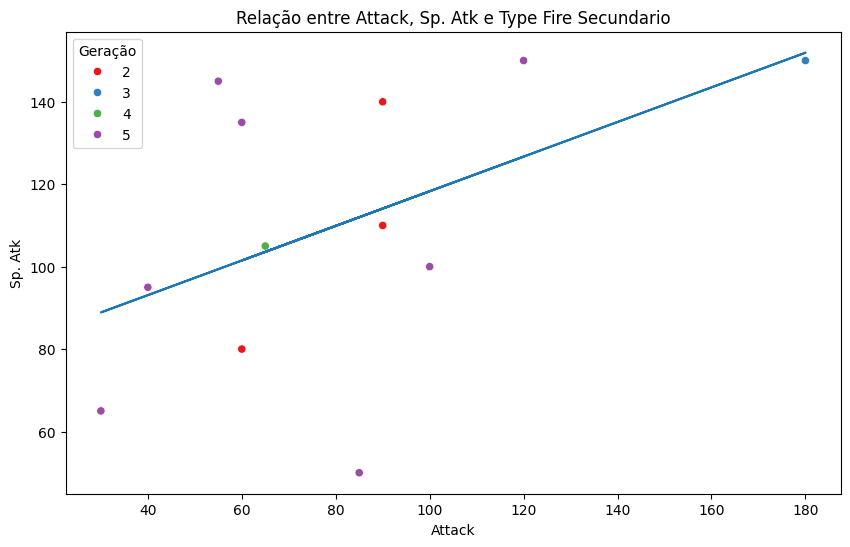

In [62]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fire'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Fire Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fire']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

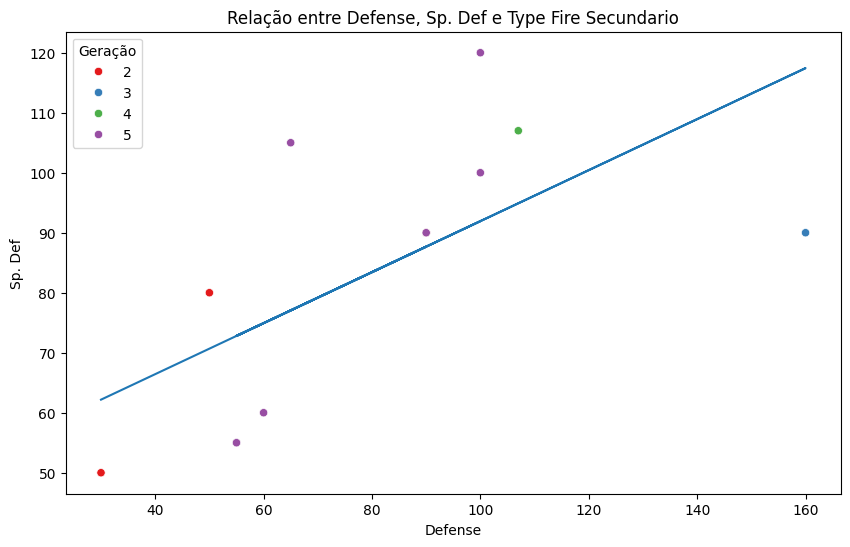

In [63]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fire'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Fire Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fire']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

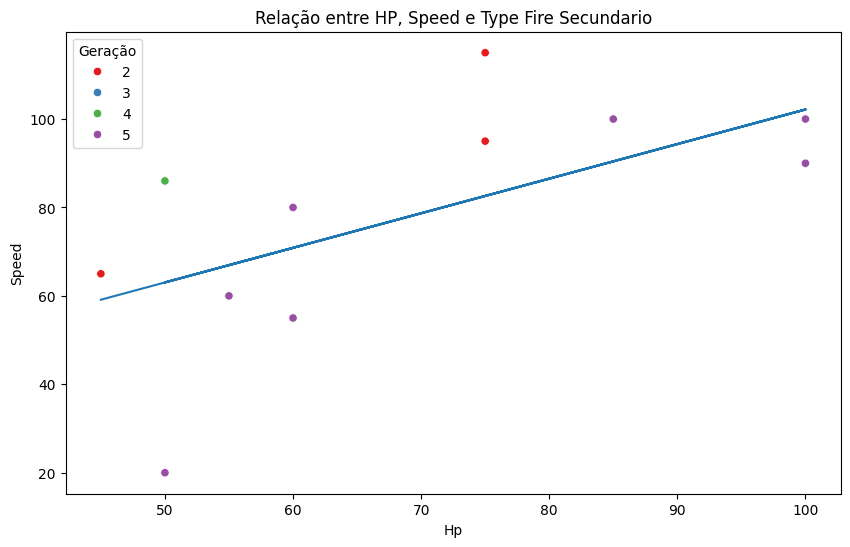

In [64]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fire'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Fire Secundario") #Alteração do titulo
plt.xlabel("Hp")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fire']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

Conforme visto nos Graficos a tendencia igual no tipo primario de ser ofensivo de Sp. Atk porém quando é tipo secundario podem ser defensivos na questao de Sp.Def e o HP e Speed continuam mais balanceados

####Water

##### Tipo Primario

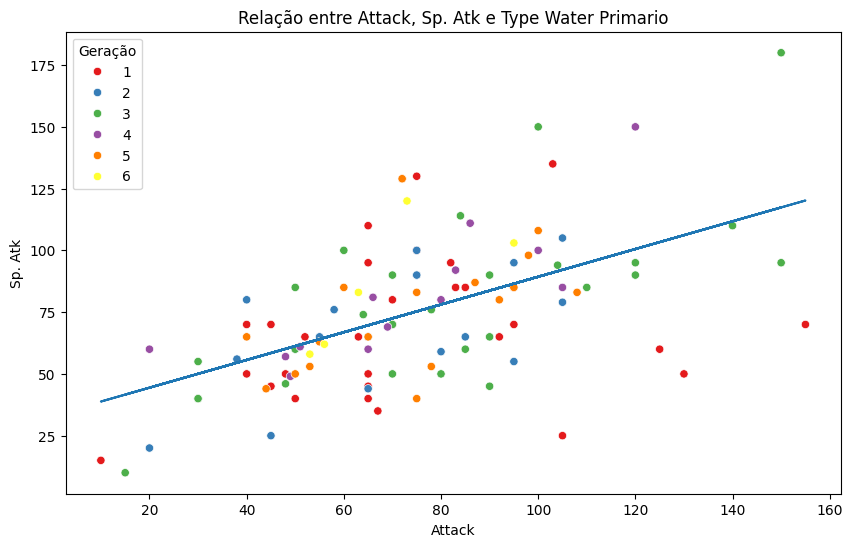

In [65]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Water'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Water Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Water']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

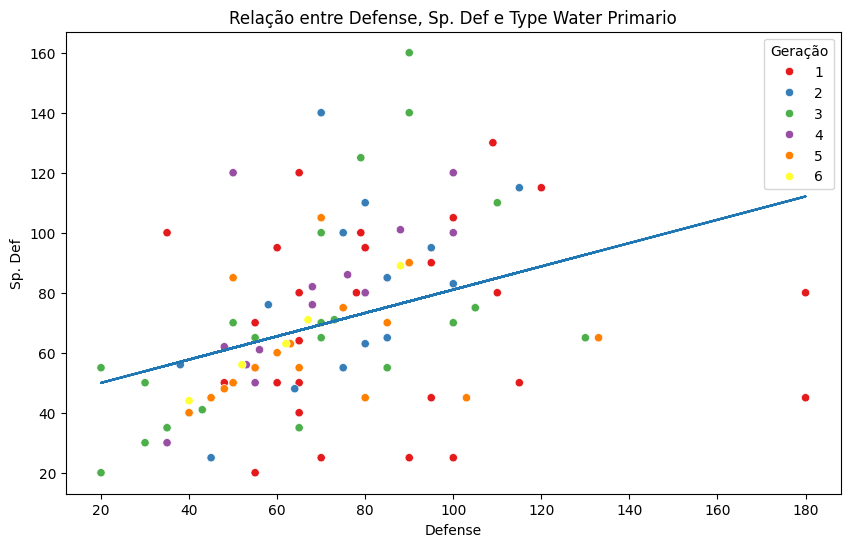

In [66]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Water'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Water Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Water']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

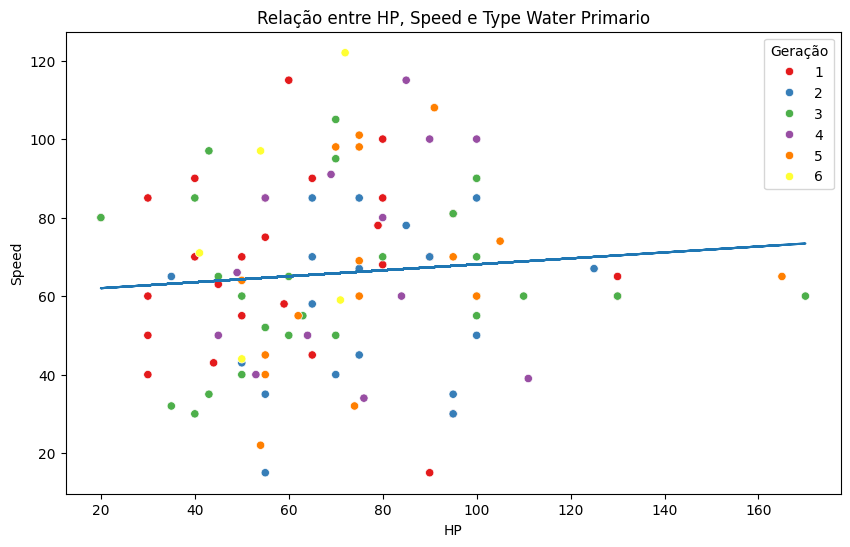

In [67]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Water'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Water Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Water']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Agua primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo especial do que fisico e mais veloz do que ter mais HP

##### Tipo Secundario

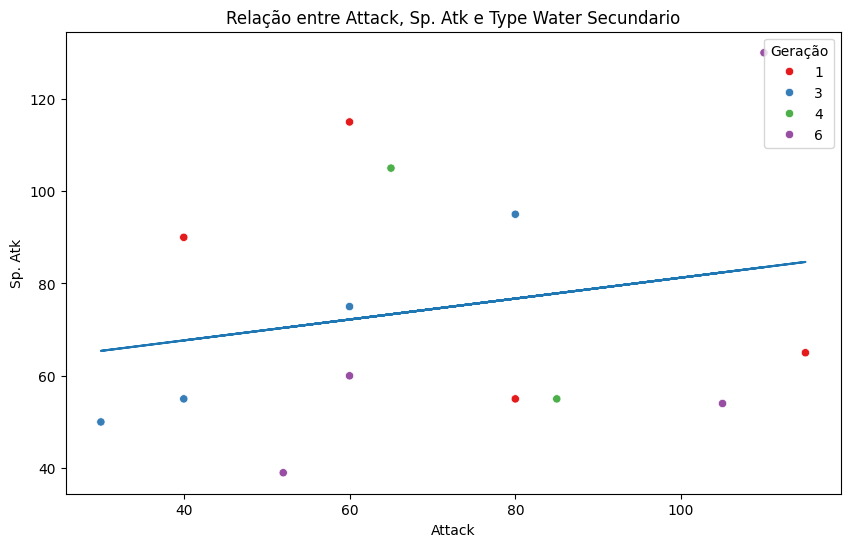

In [68]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Water'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Water Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Water']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

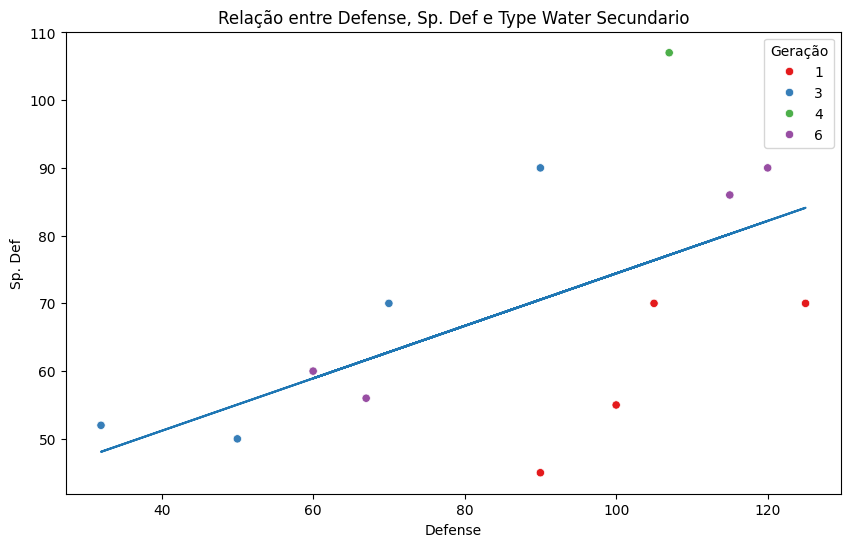

In [69]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Water'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Water Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Water']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

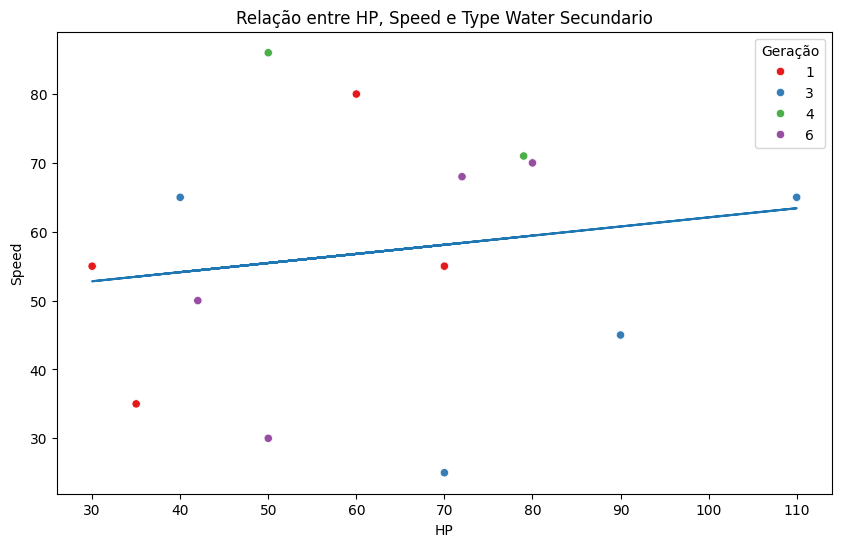

In [70]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Water'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Water Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Water']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Agua Secundario tem como tendencias ser mais ofensivo especial do que fisico, defensivo fisico do que especial e mais veloz do que ter mais HP

#### Grass

##### Tipo Primario

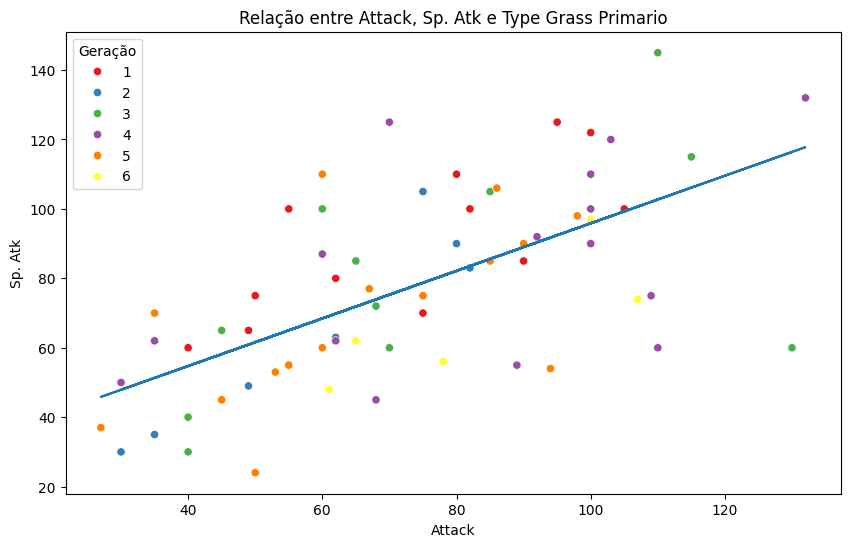

In [71]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Grass'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Grass Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Grass']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

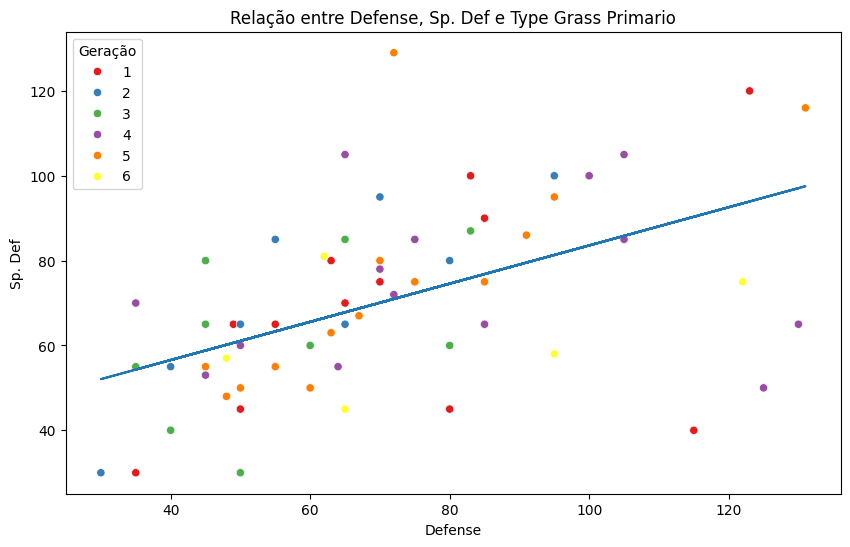

In [72]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Grass'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Grass Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Grass']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

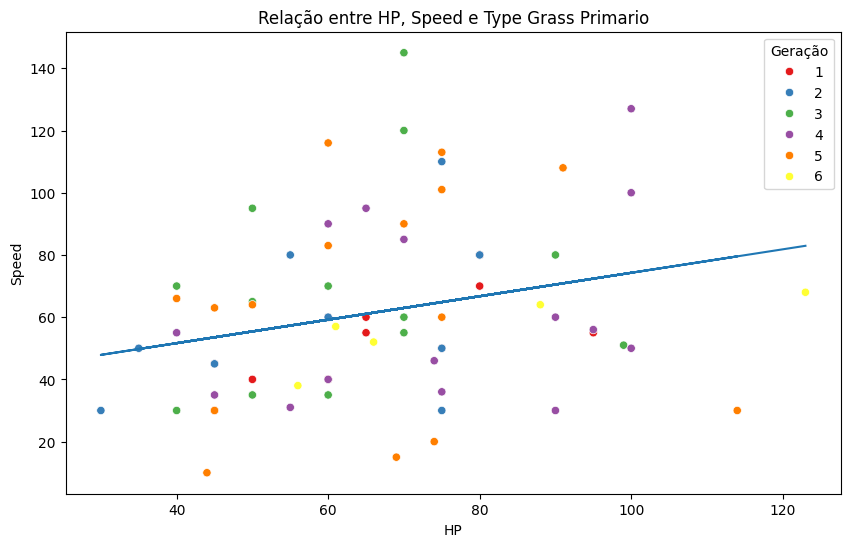

In [73]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Grass'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Grass Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Grass']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Grass primario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais HP do que ter mais velocidade

##### Tipo Secundario

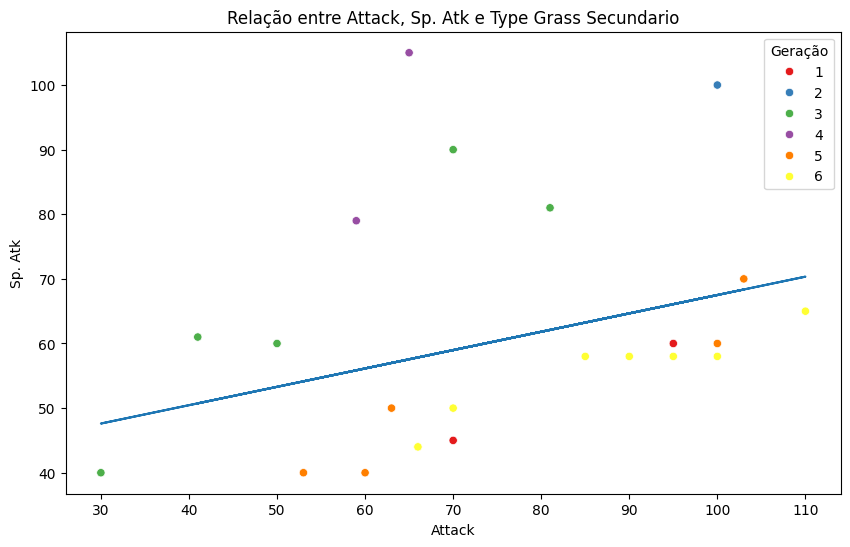

In [74]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Grass'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Grass Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Grass']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

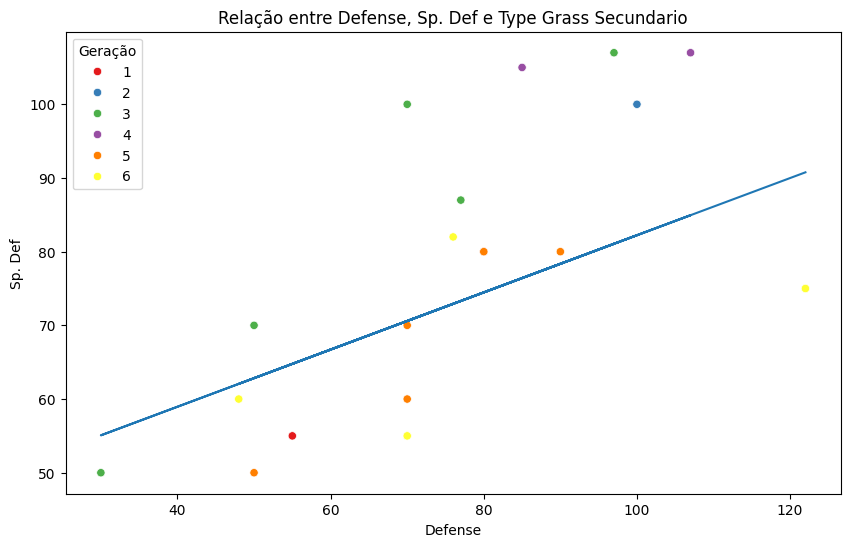

In [75]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Grass'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Grass Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Grass']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

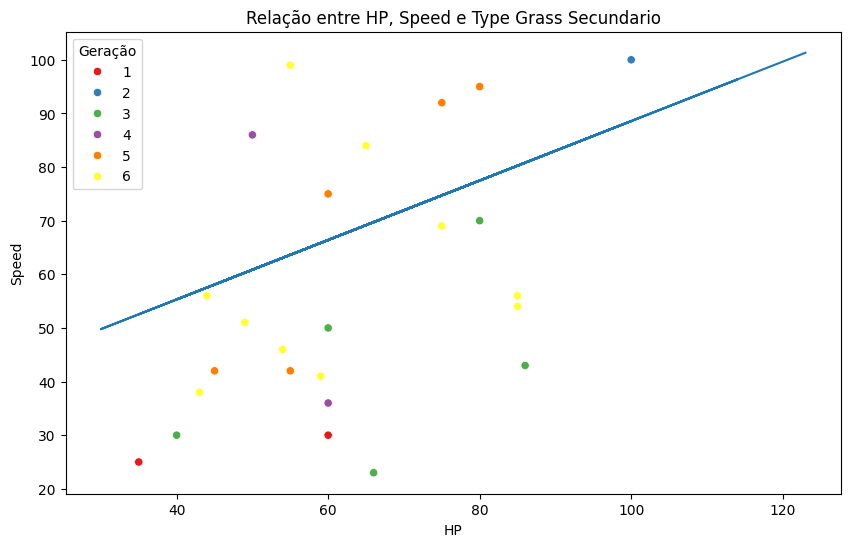

In [76]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Grass'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Grass Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Grass']
x = data['HP']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Grass secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo especial do que fisico e mais HP do que ter mais Speed

####Dragon

##### Tipo Primario

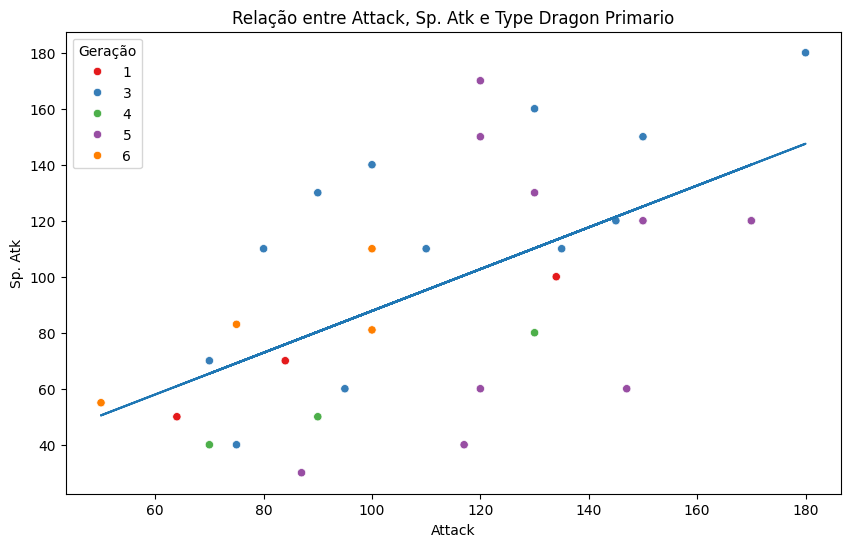

In [77]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Dragon'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Dragon Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Dragon']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

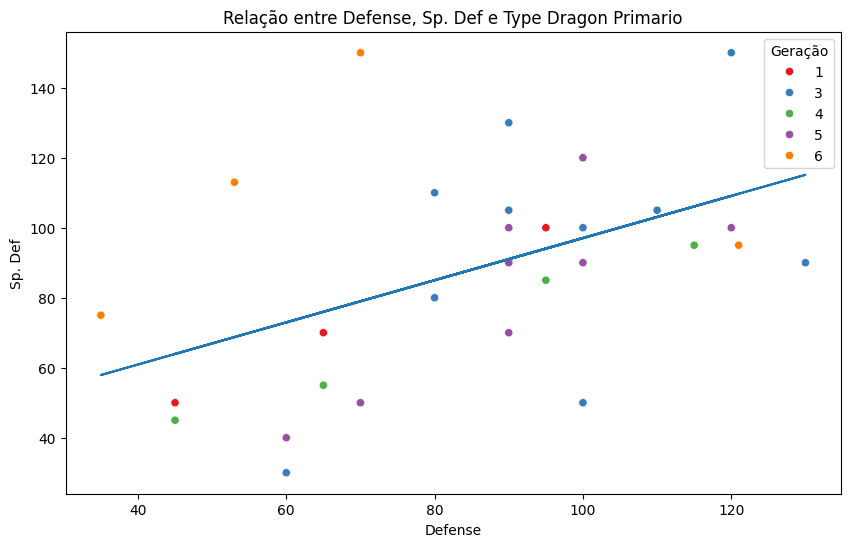

In [78]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Dragon'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Dragon Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Dragon']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

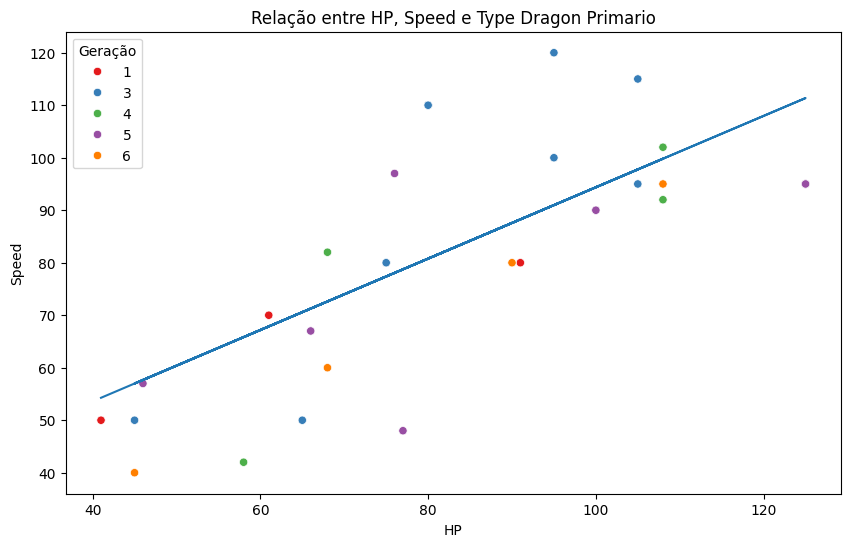

In [79]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Dragon'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Dragon Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Dragon']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Dragon primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais veloz do que ter mais HP

##### Tipo Secundario

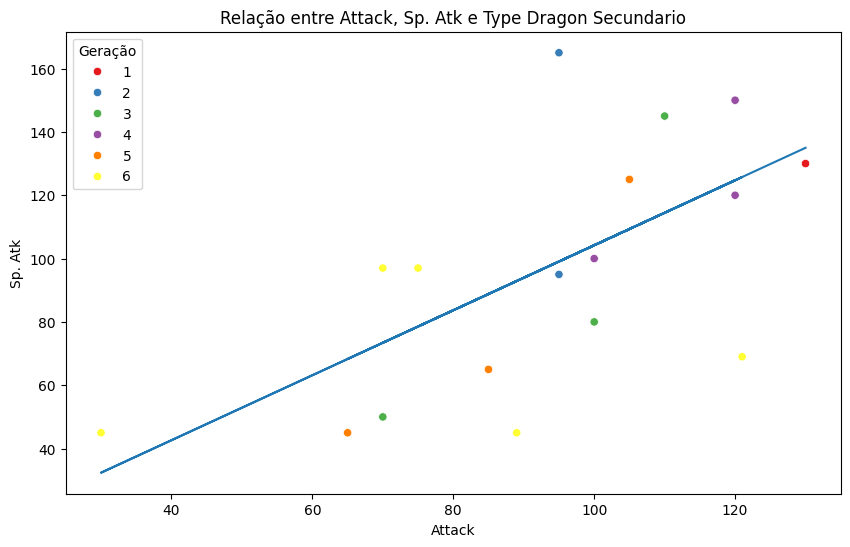

In [80]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Dragon'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Dragon Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Dragon']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

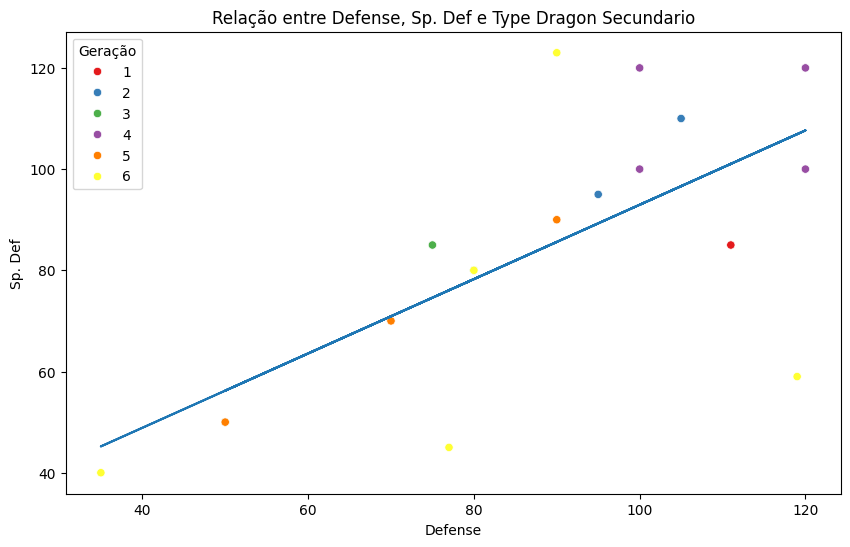

In [81]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Dragon'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Dragon Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Dragon']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

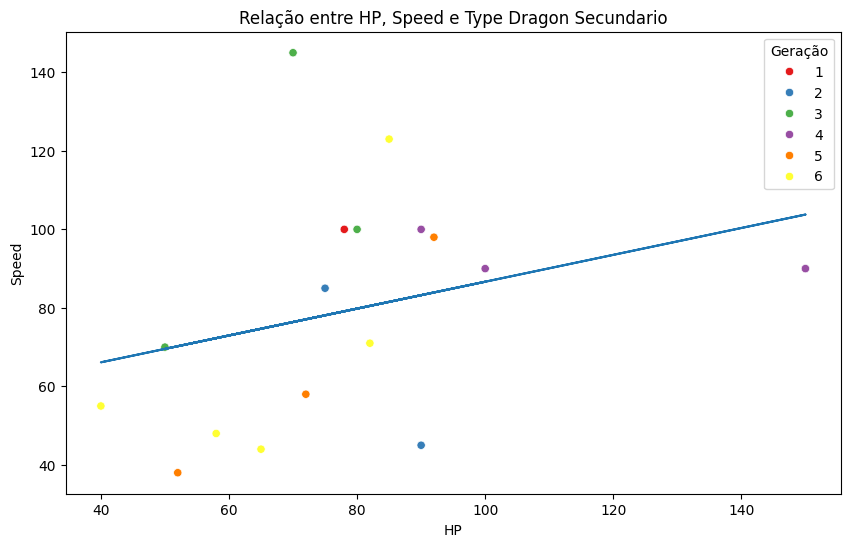

In [82]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Dragon'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Dragon Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Dragon']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Dragon secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo especial do que fisico e mais veloz do que ter mais HP

#### Electric

##### Tipo Primario

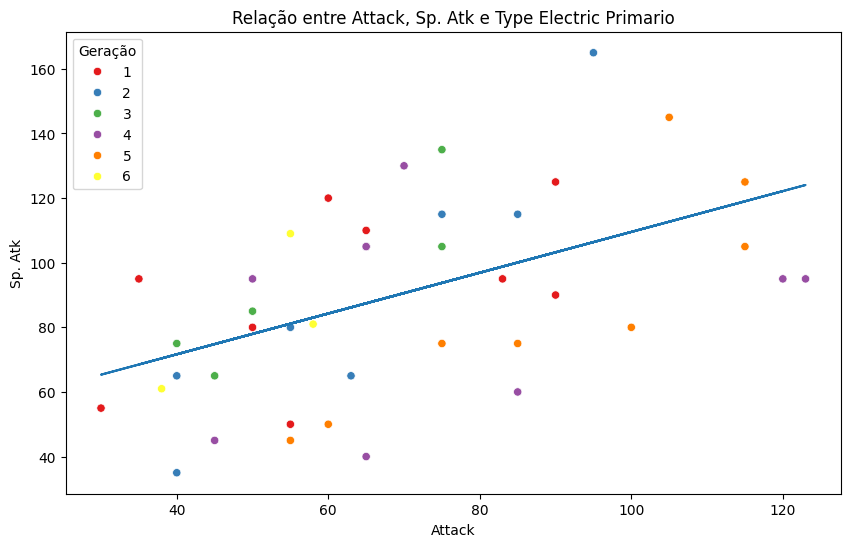

In [83]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Electric'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Electric Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Electric']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

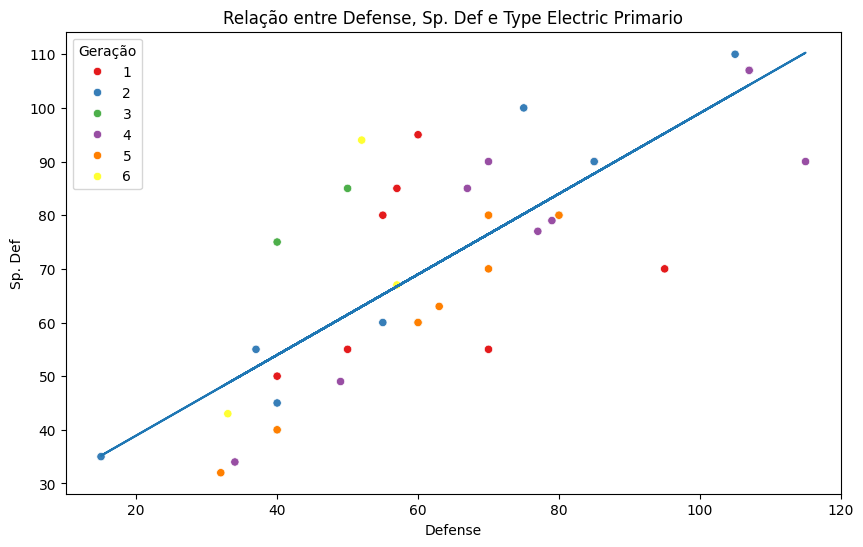

In [84]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Electric'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Electric Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Electric']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

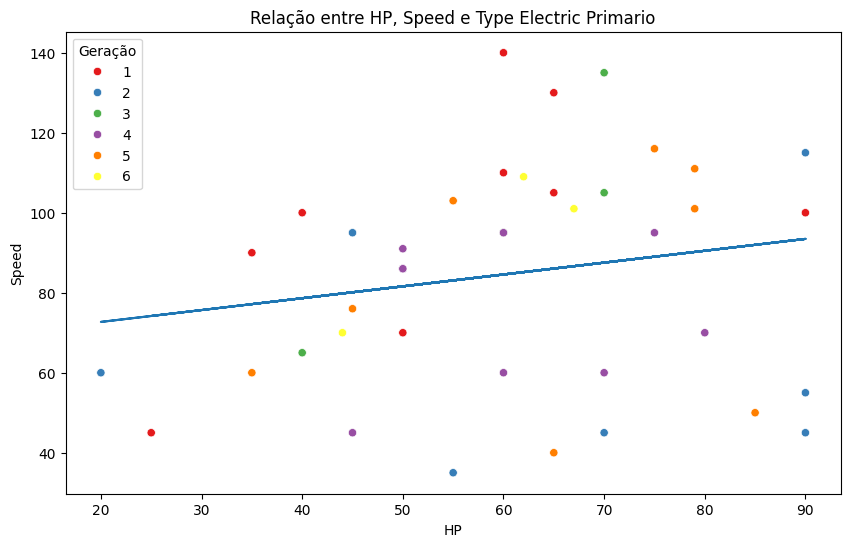

In [85]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Electric'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Electric Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Electric']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Electric primario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais veloz do que ter mais HP

##### Tipo Secundario

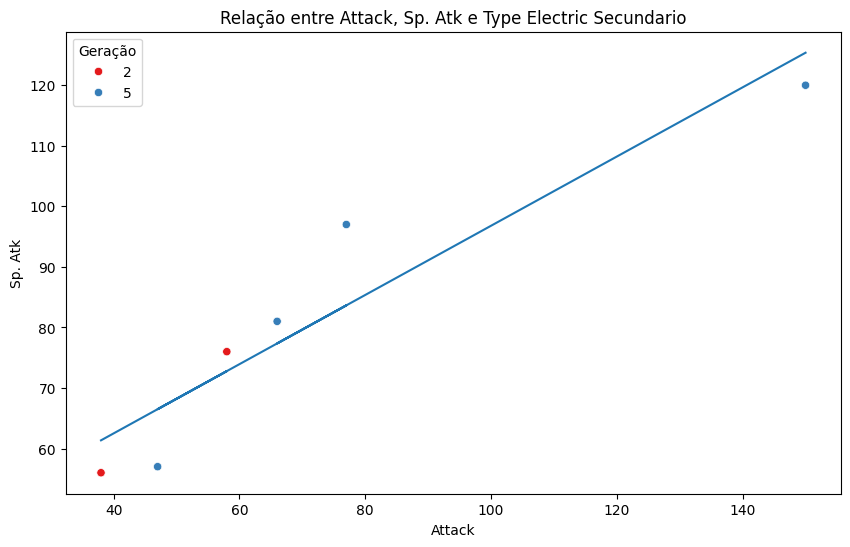

In [86]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Electric'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Electric Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Electric']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

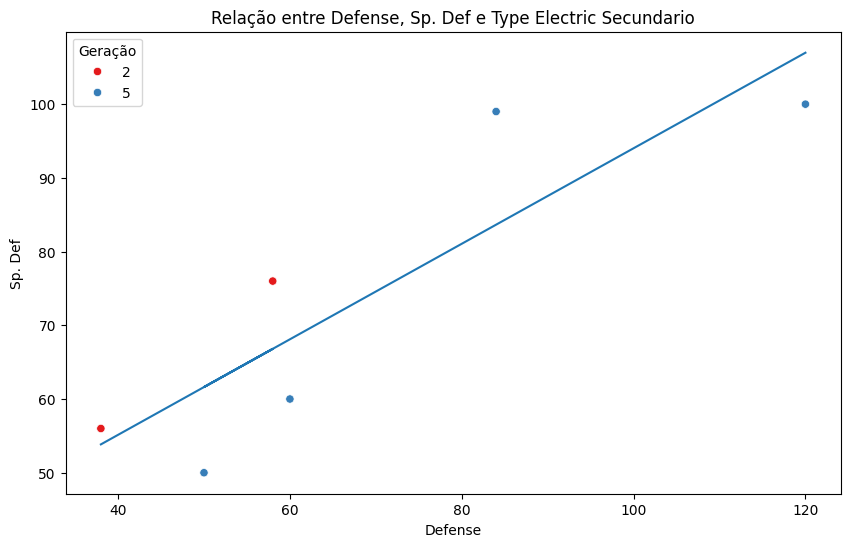

In [87]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Electric'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Electric Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Electric']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

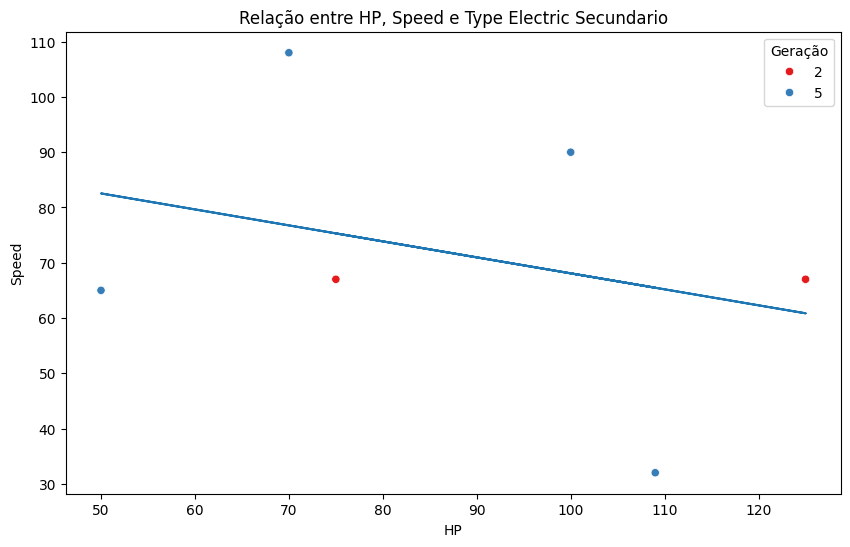

In [88]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Electric'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Electric Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Electric']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Electric secundario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais HP do que ter mais Speed

#### Ghost

##### Tipo Primario

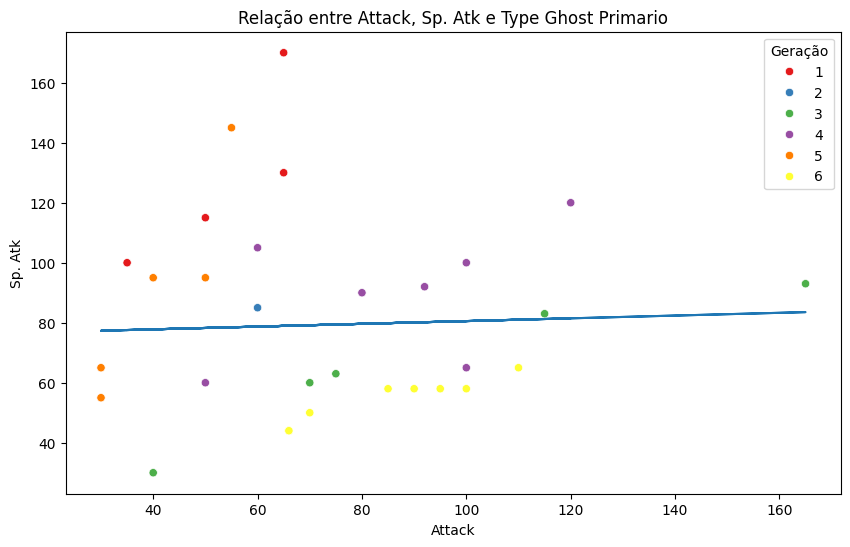

In [89]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ghost'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Ghost Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ghost']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

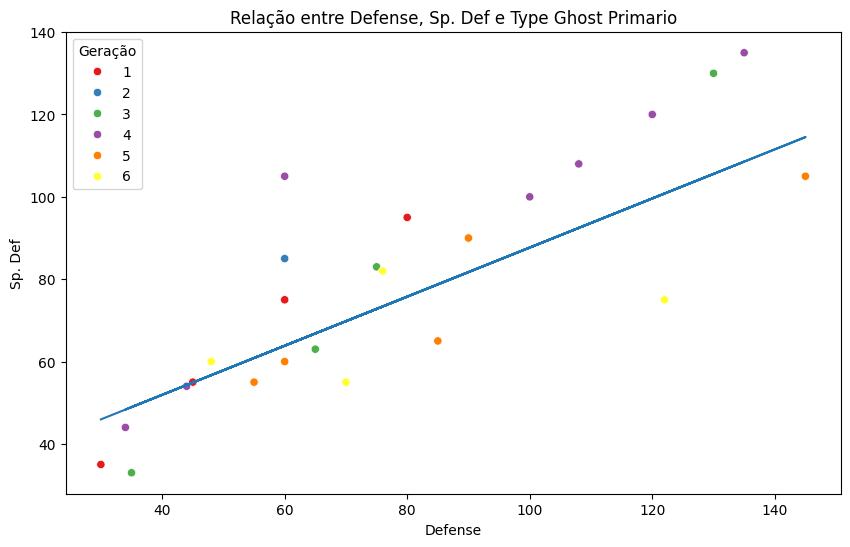

In [90]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ghost'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Ghost Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ghost']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

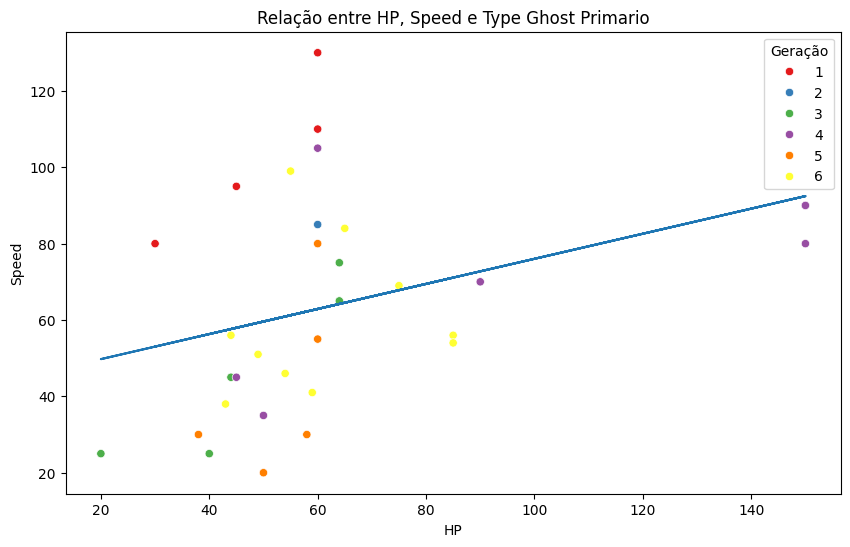

In [91]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ghost'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Ghost Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ghost']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Ghost primario tem como tendencias ser mais ofensivo especial do que fisico, defensivo fisico do que especial e mais HP do que ter mais Speed

##### Tipo Secundario

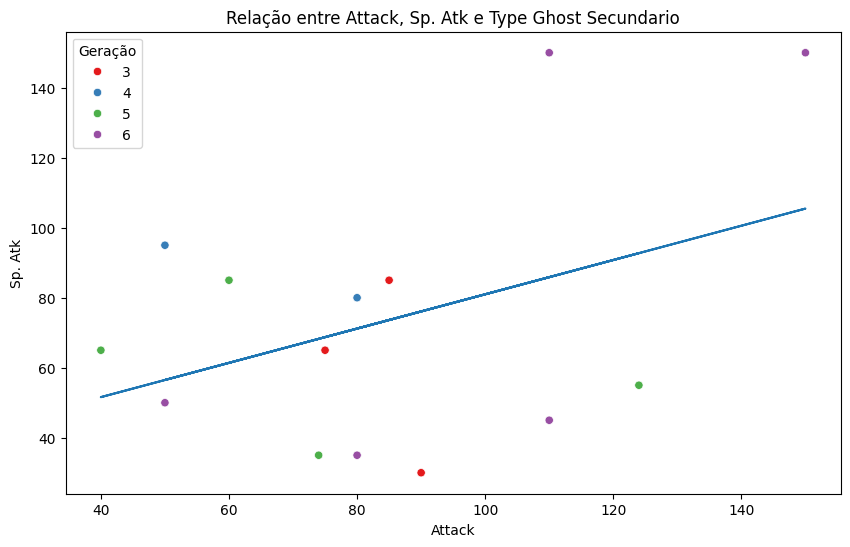

In [92]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ghost'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Ghost Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ghost']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

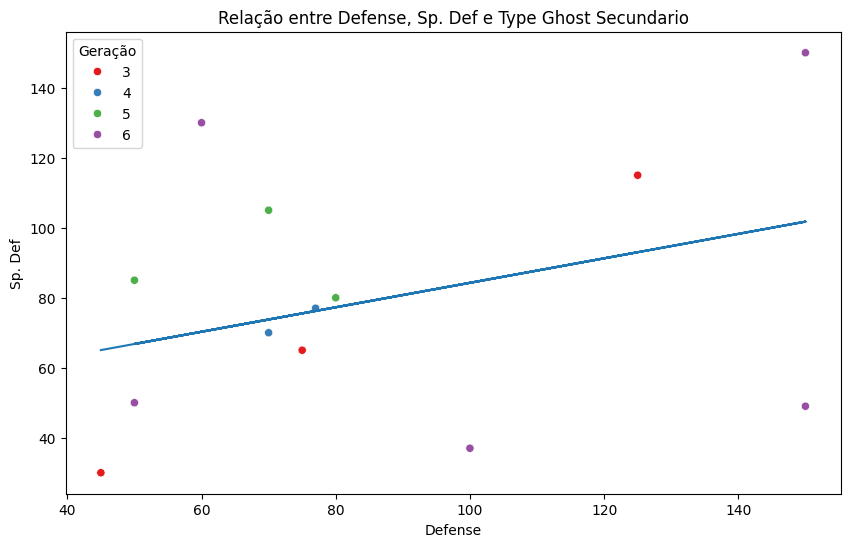

In [93]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ghost'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Ghost Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ghost']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

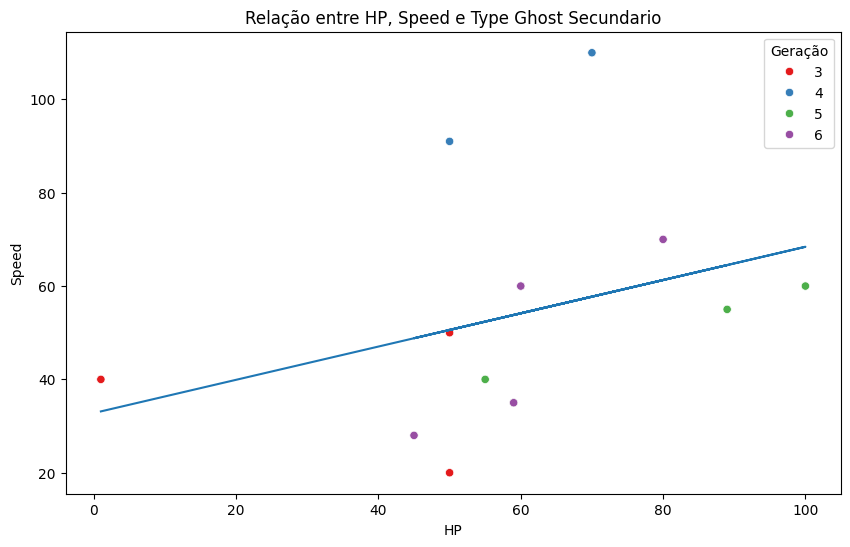

In [94]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ghost'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Ghost Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ghost']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Ghost secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

####Dark

##### Tipo Primario

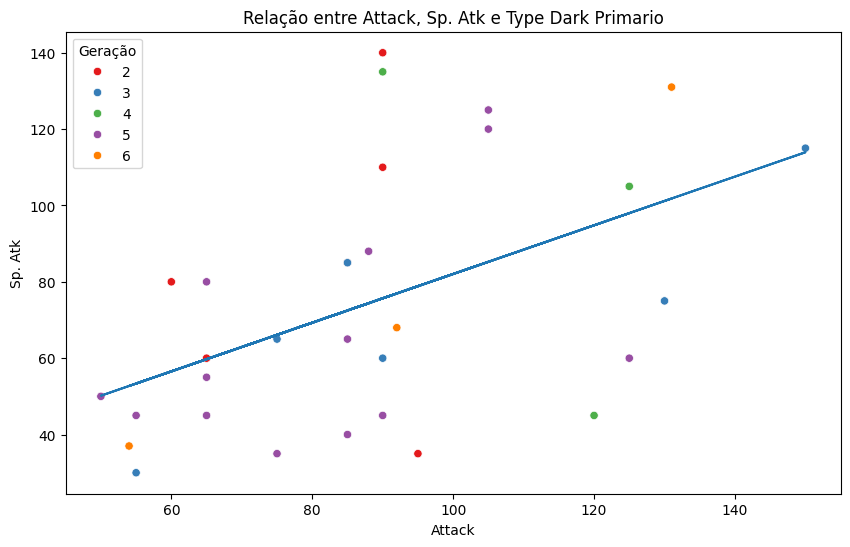

In [95]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Dark'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Dark Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Dark']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

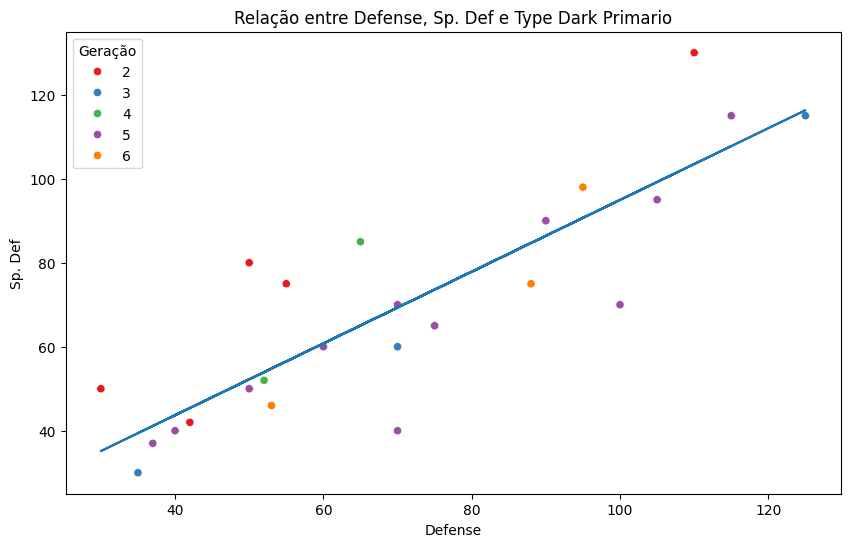

In [96]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Dark'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Dark Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Dark']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

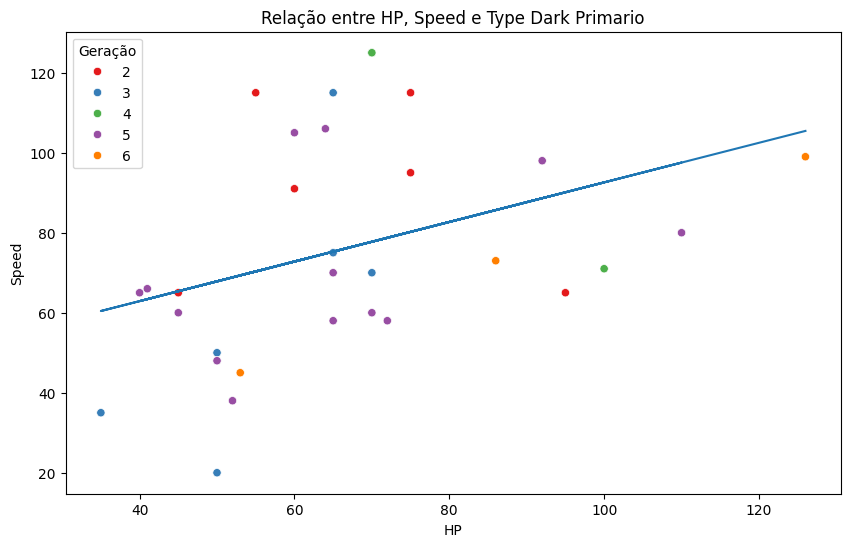

In [97]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Dark'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Dark Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Dark']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Dark primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais Speed do que ter mais HP

##### Tipo Secundario

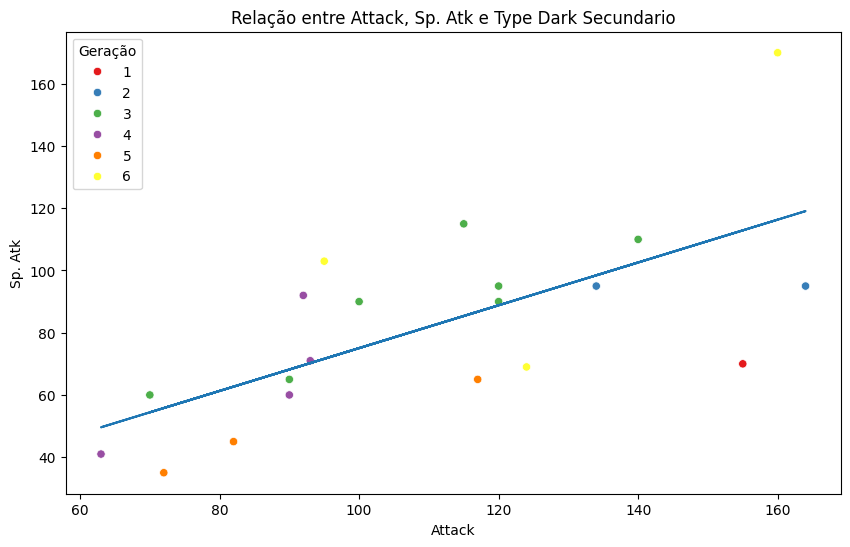

In [98]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Dark'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Dark Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Dark']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

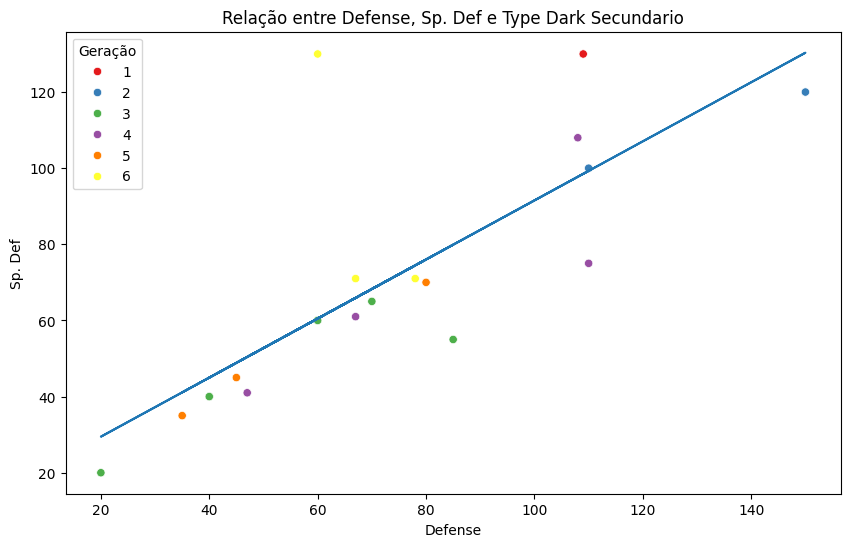

In [99]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Dark'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Dark Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Dark']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

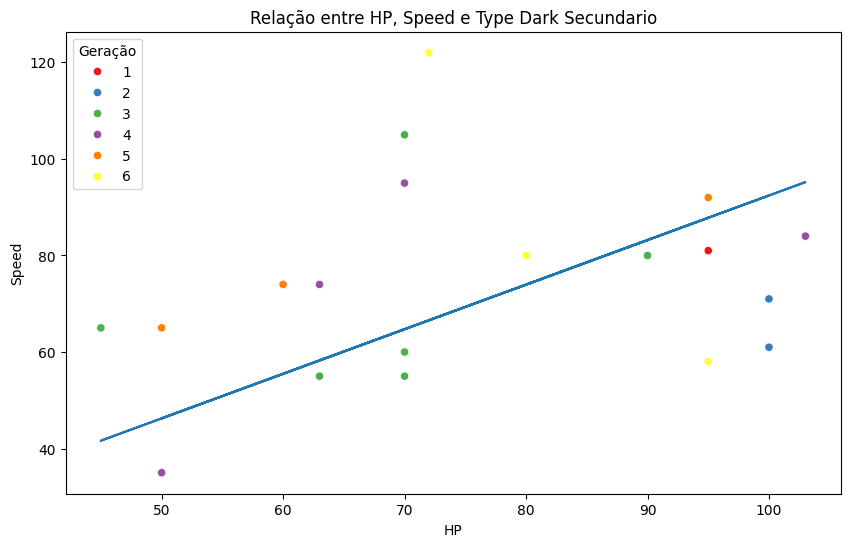

In [100]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Dark'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Dark Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Dark']
x = data['HP']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Dark secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

#### Bug

##### Tipo Primario

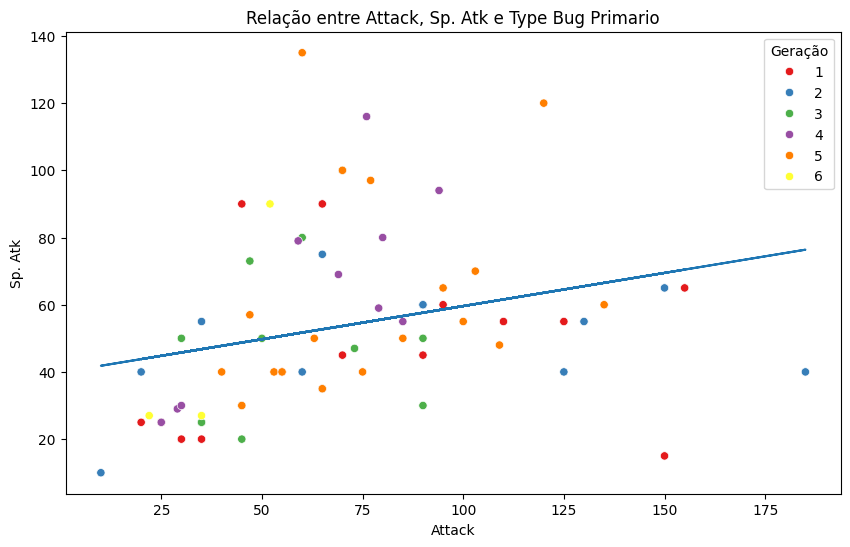

In [101]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Bug'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Bug Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Bug']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

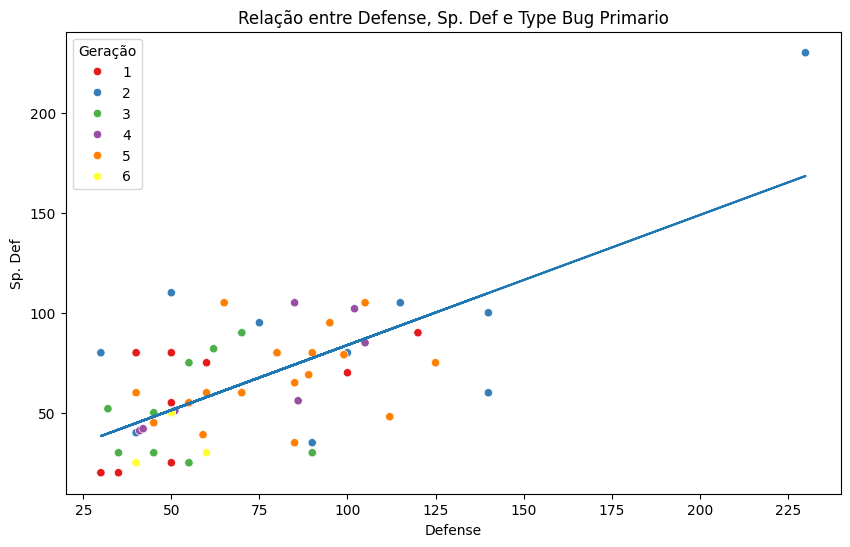

In [102]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Bug'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Bug Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Bug']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

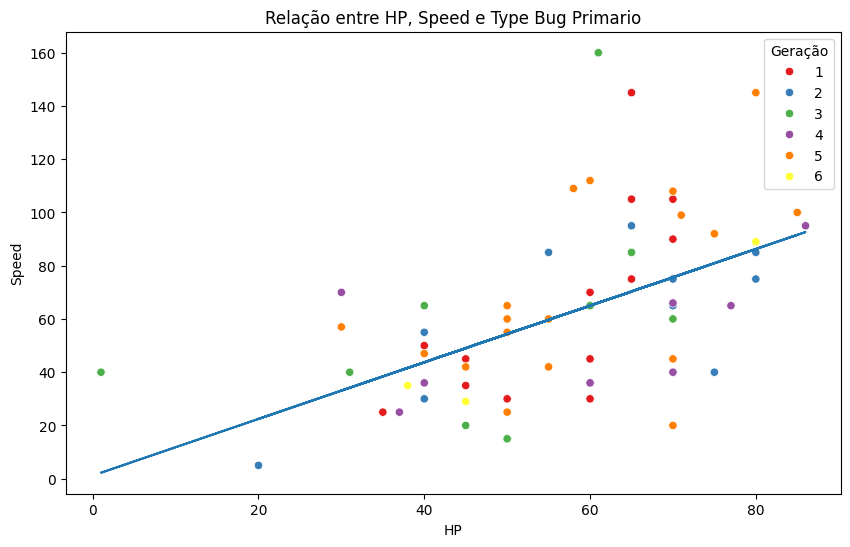

In [103]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Bug'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Bug Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Bug']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Bug primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo especial do que fisico e mais Speed do que ter mais HP

##### Tipo Secundario

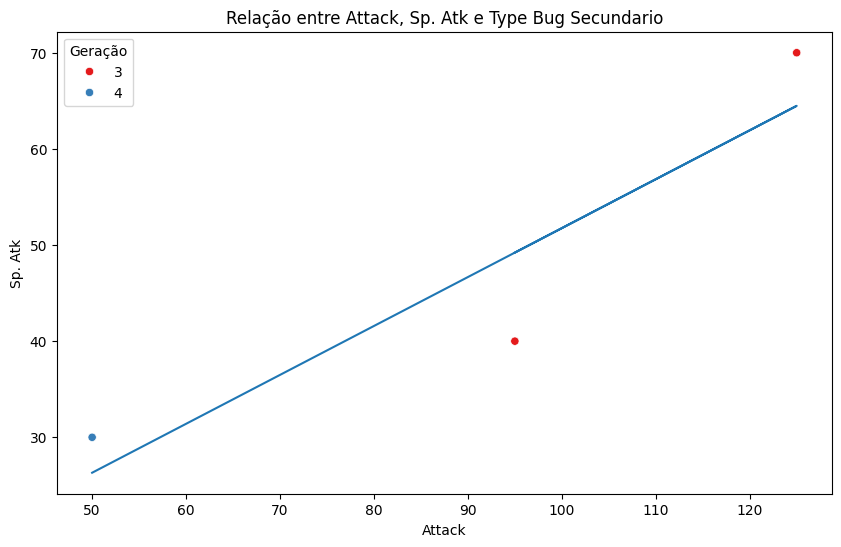

In [104]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Bug'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Bug Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Bug']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

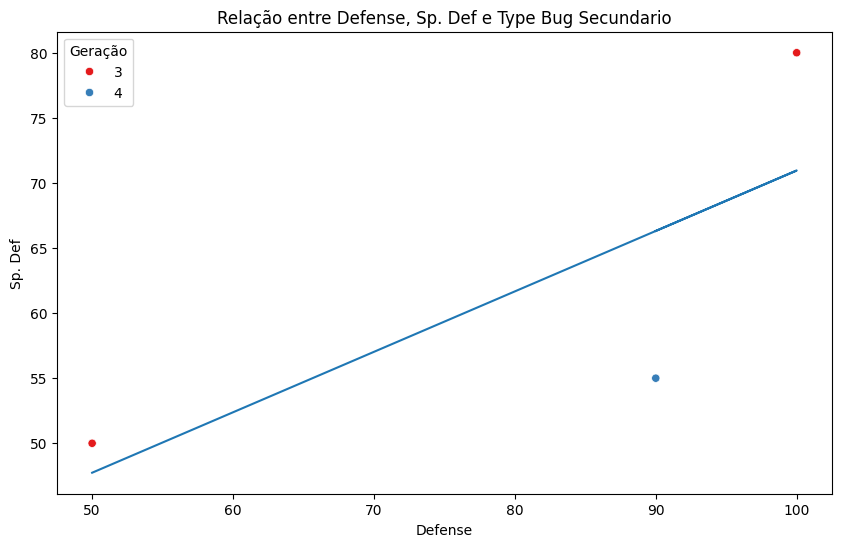

In [105]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Bug'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Bug Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Bug']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

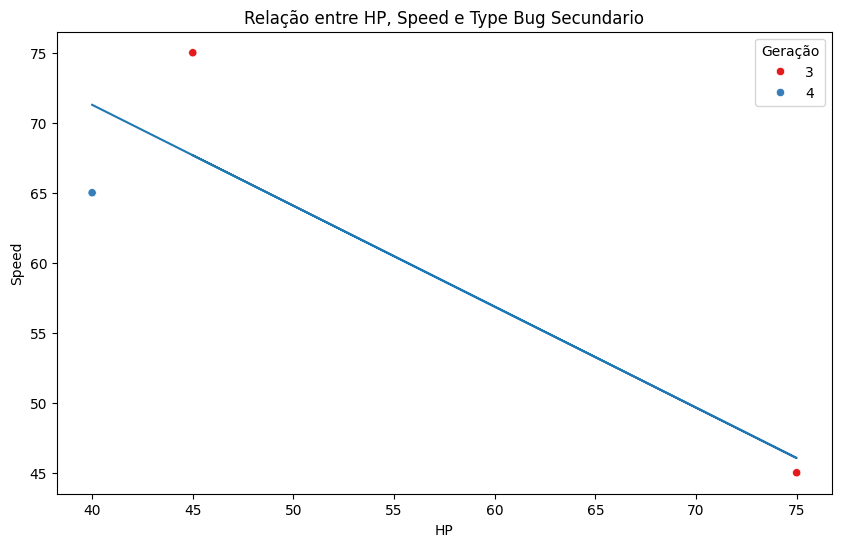

In [106]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Bug'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Bug Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Bug']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Bug secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais Speed do que ter mais HP

#### Fairy

##### Tipo Primario

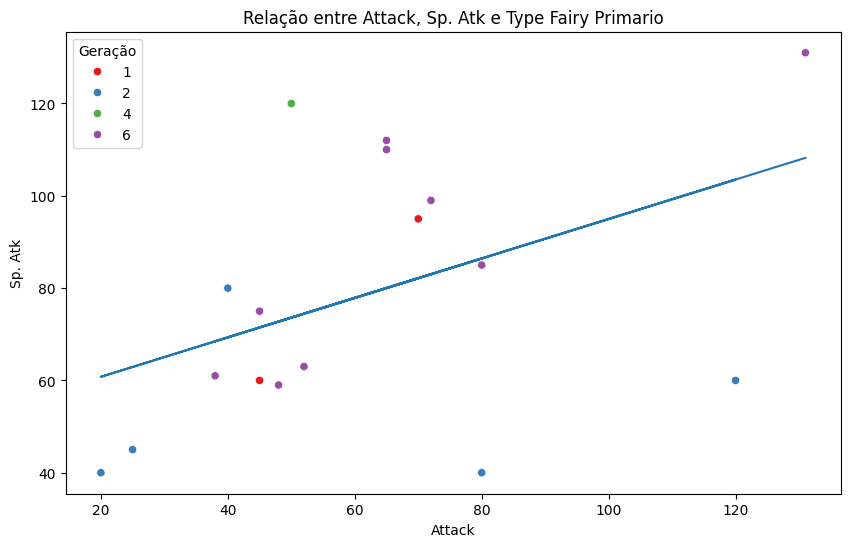

In [107]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1'] == 'Fairy'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Fairy Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fairy']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

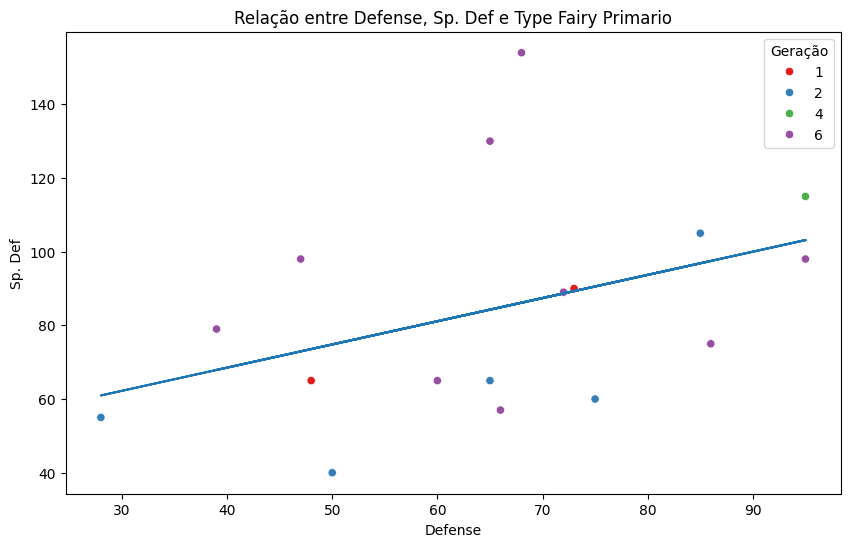

In [108]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fairy'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Fairy Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fairy']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

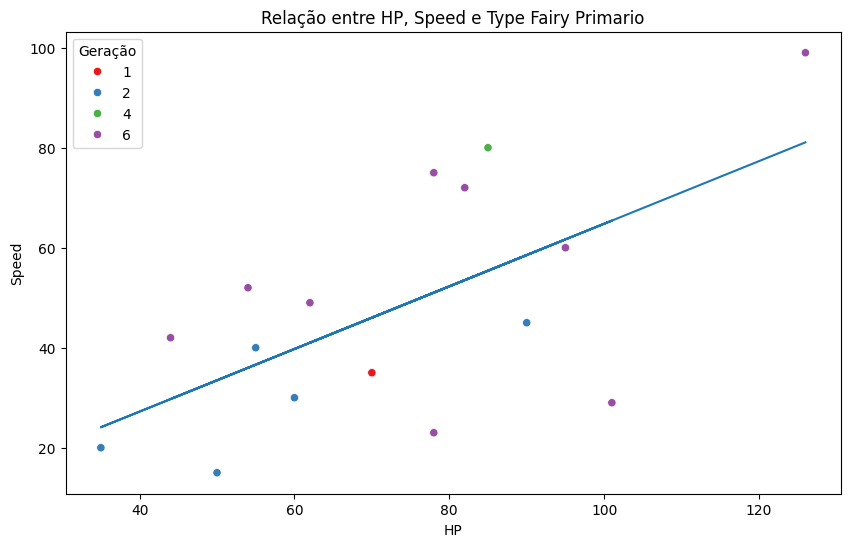

In [109]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fairy'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Fairy Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fairy']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Fairy primario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais HP do que ter mais Speed

##### Tipo Secundario

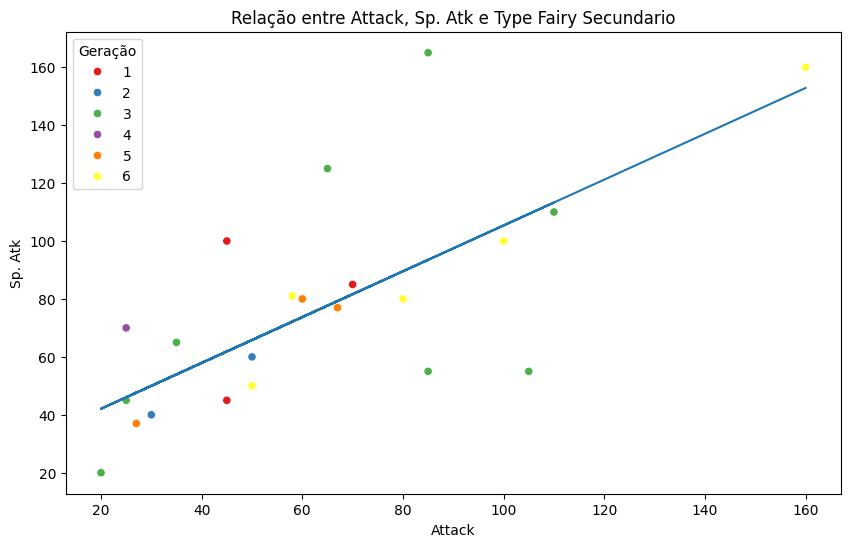

In [110]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fairy'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Fairy Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fairy']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

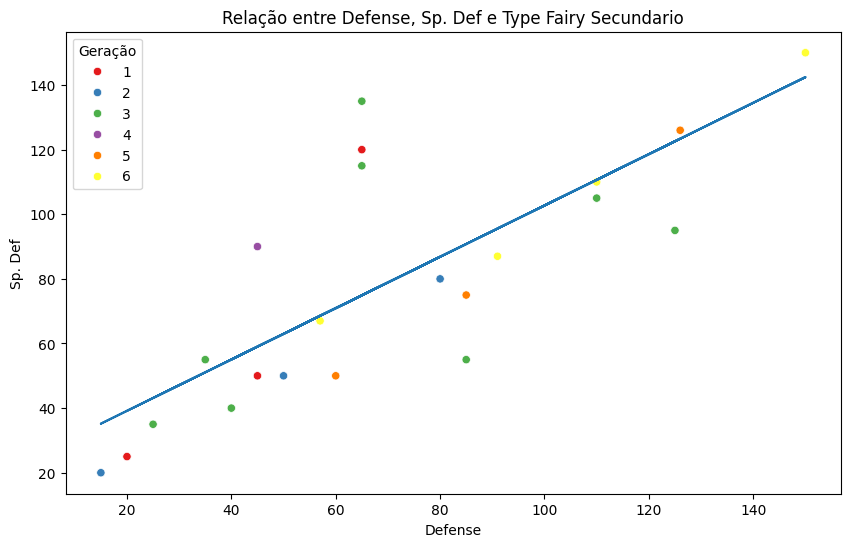

In [111]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fairy'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Fairy Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fairy']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

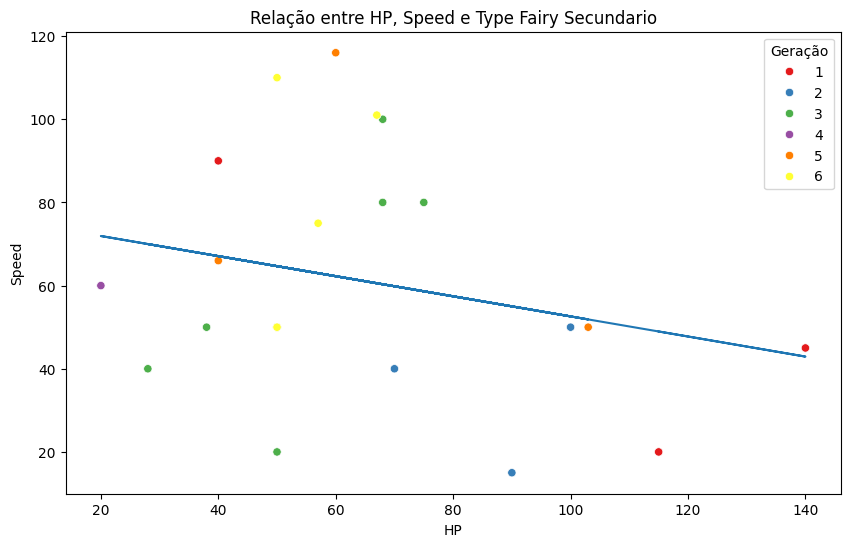

In [112]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fairy'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Fairy Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fairy']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Fairy secundario tem como tendencias ser mais ofensivo especial do que fisico, defensivo fisico do que especial e mais Speed do que ter mais HP

#### Fighting

##### Tipo Primario

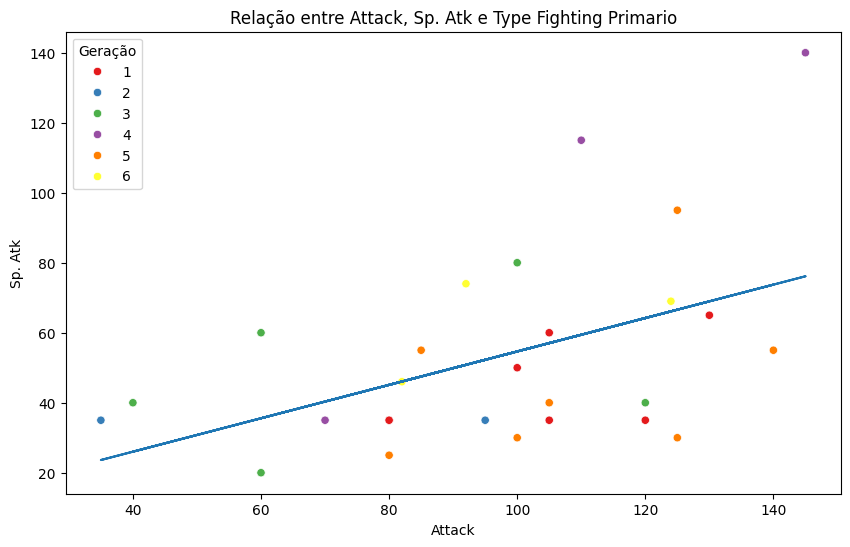

In [113]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fighting'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Fighting Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fighting']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

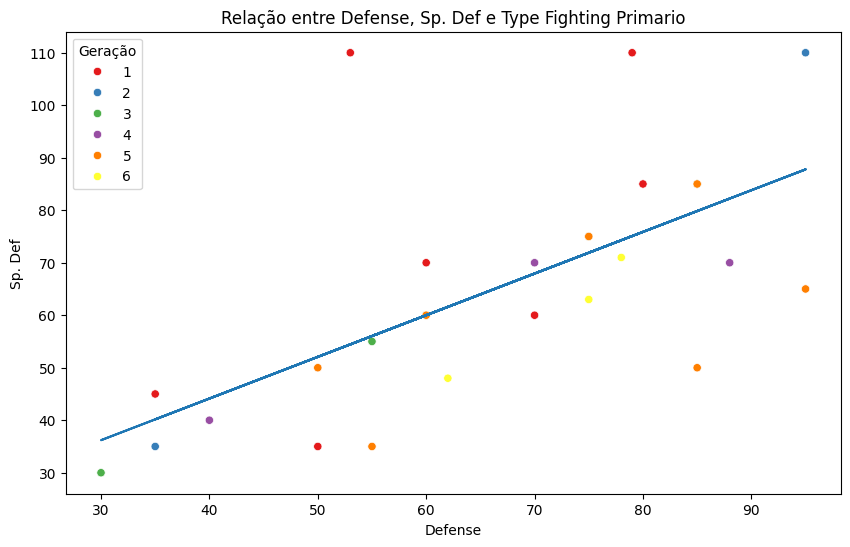

In [114]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fighting'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Fighting Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fighting']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

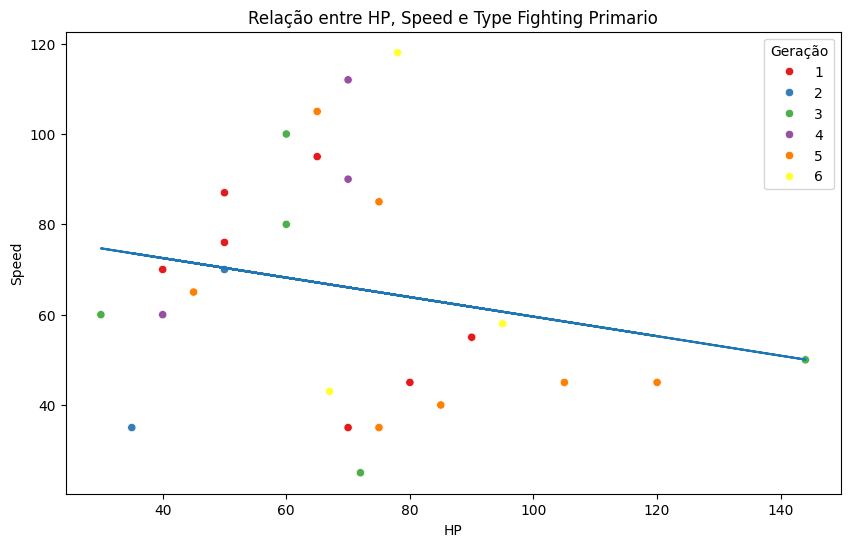

In [115]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Fighting'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Fighting Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Fighting']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Fighting primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais Speed do que ter mais HP

##### Tipo Secundario

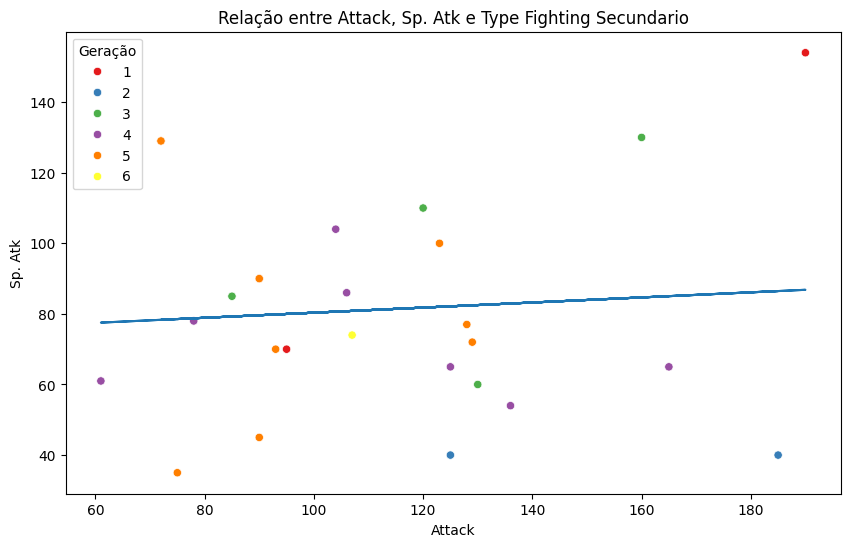

In [116]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fighting'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Fighting Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fighting']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

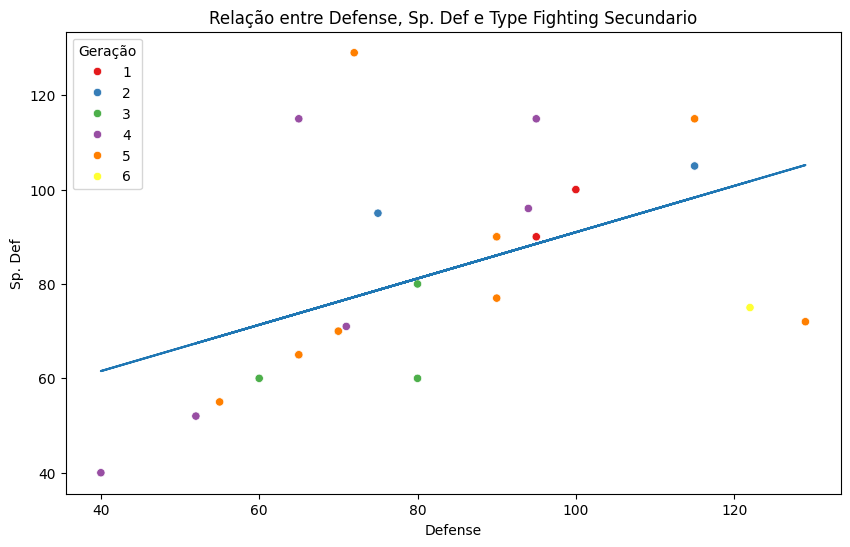

In [117]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fighting'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Fighting Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fighting']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

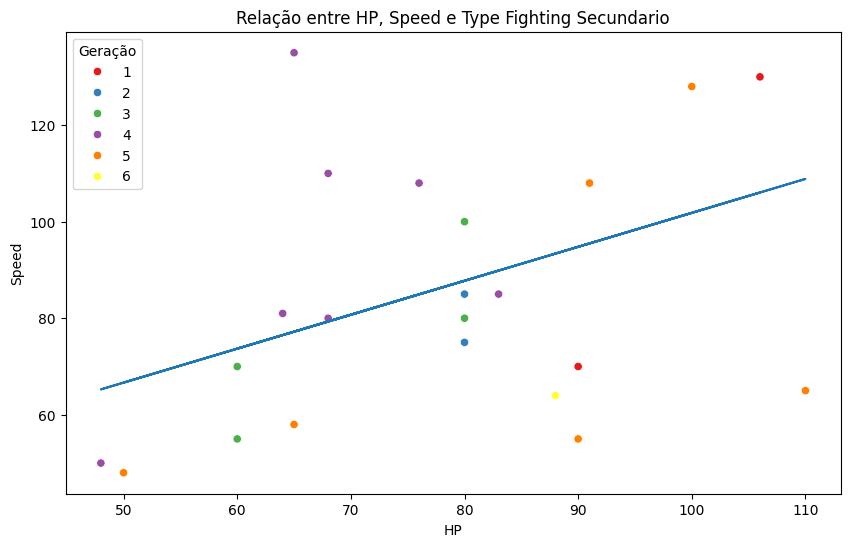

In [118]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Fighting'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Fighting Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Fighting']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Fighting secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais Speed do que ter mais HP

#### Ground

##### Tipo Primario

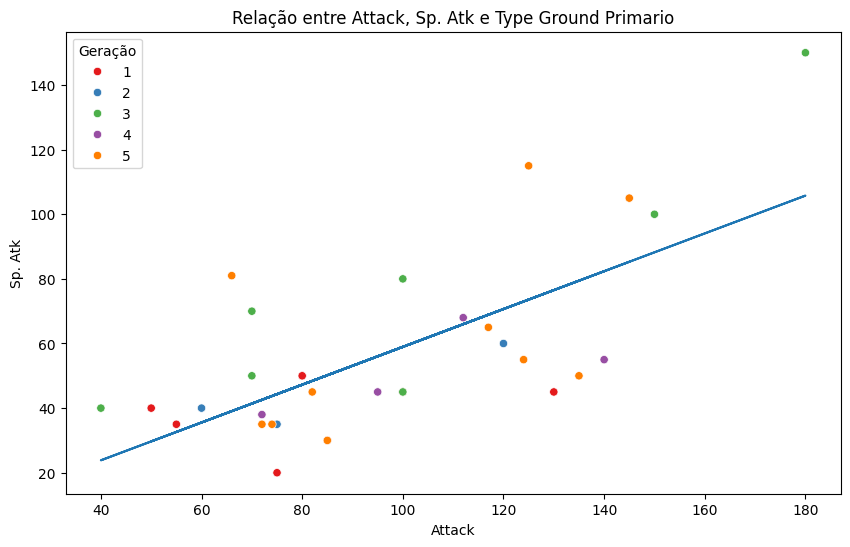

In [119]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ground'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Ground Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ground']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

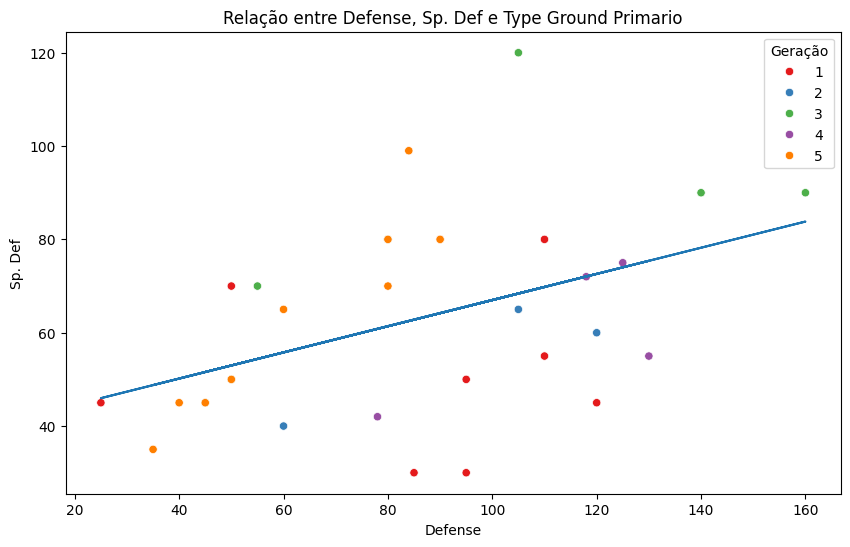

In [120]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ground'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Ground Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ground']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

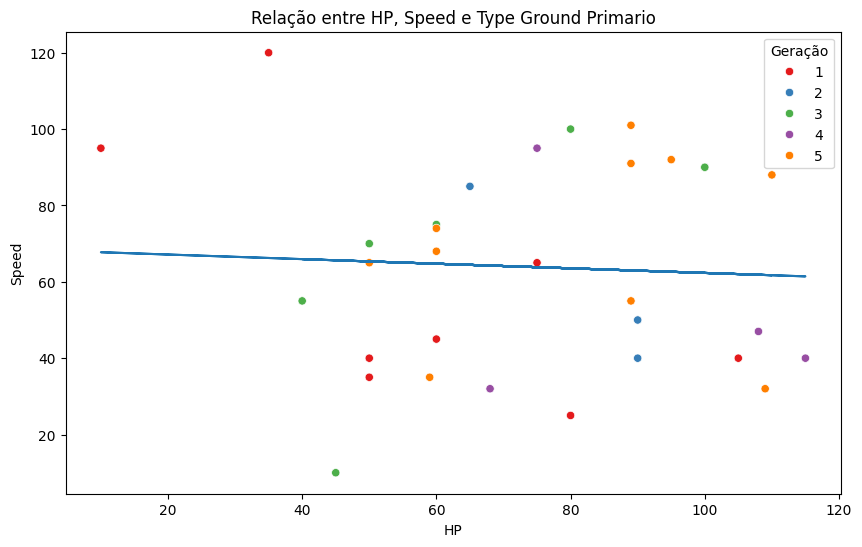

In [121]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ground'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Ground Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ground']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Ground primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

##### Tipo Secundario

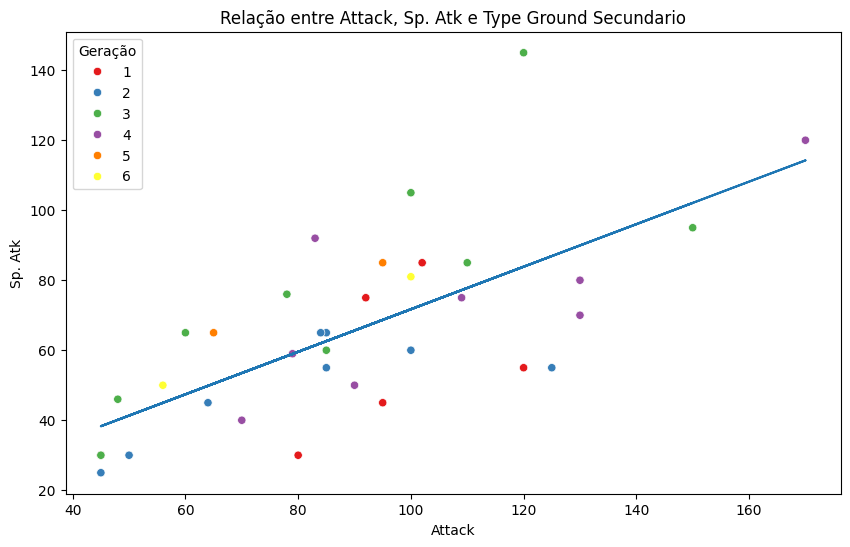

In [122]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ground'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Ground Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ground']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

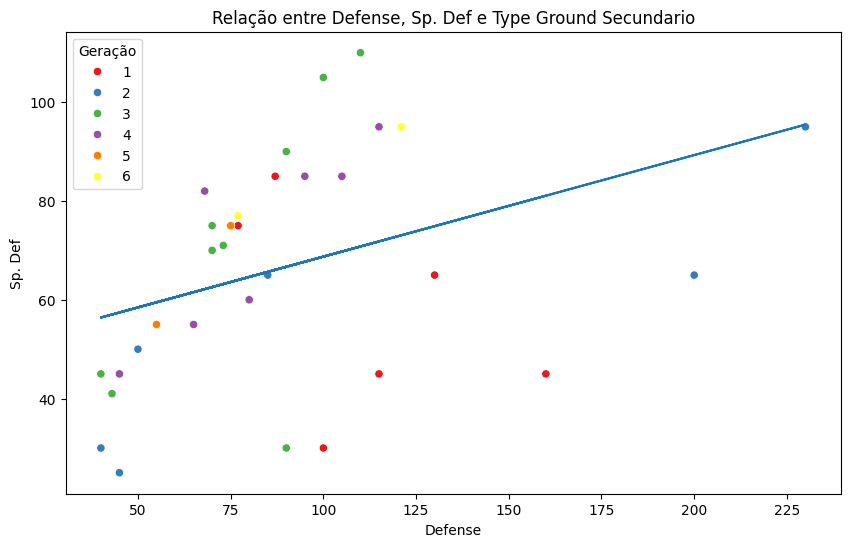

In [123]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ground'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Ground Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ground']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

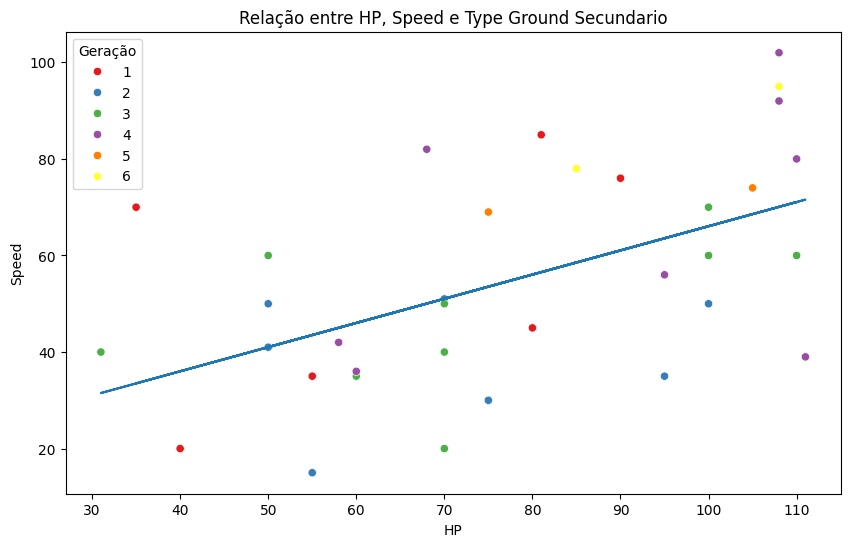

In [124]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ground'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Ground Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ground']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Ground secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

#### Flying

##### Tipo Primario

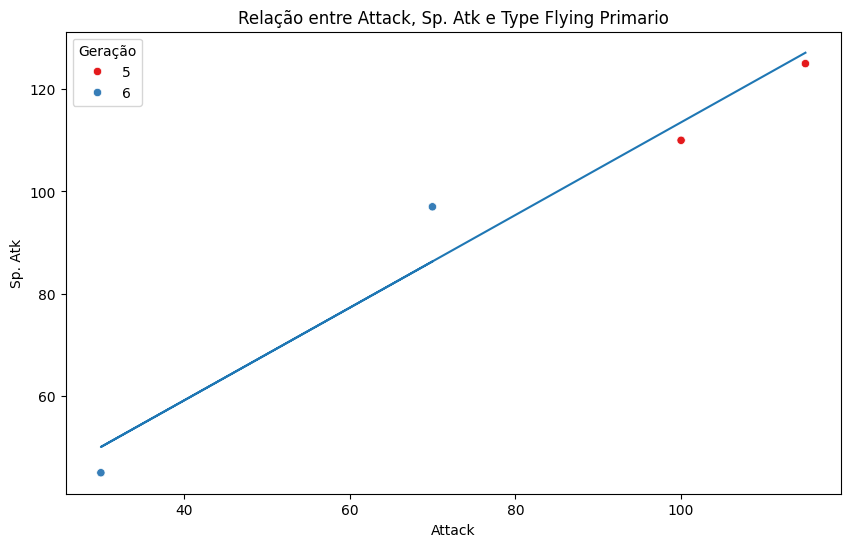

In [125]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Flying'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Flying Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Flying']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

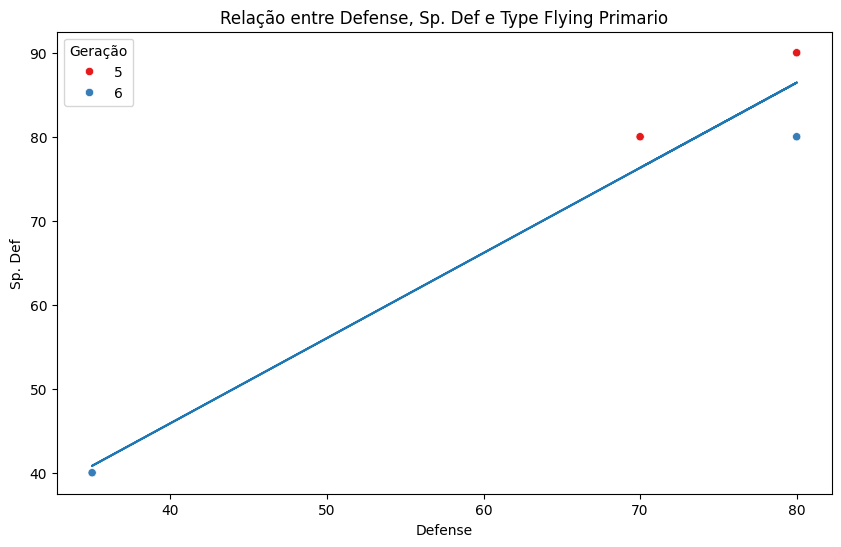

In [126]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Flying'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Flying Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Flying']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

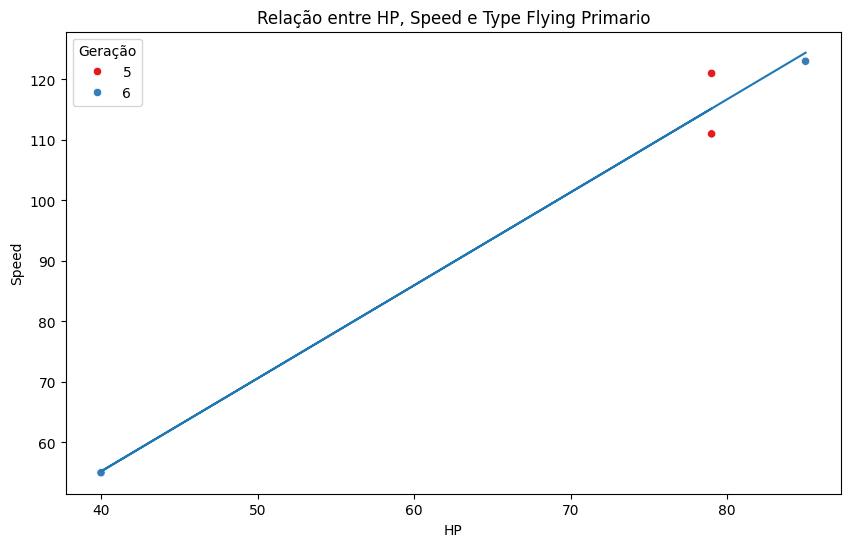

In [127]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Flying'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Flying Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Flying']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Flying primario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais Speed do que ter mais HP

##### Tipo Secundario

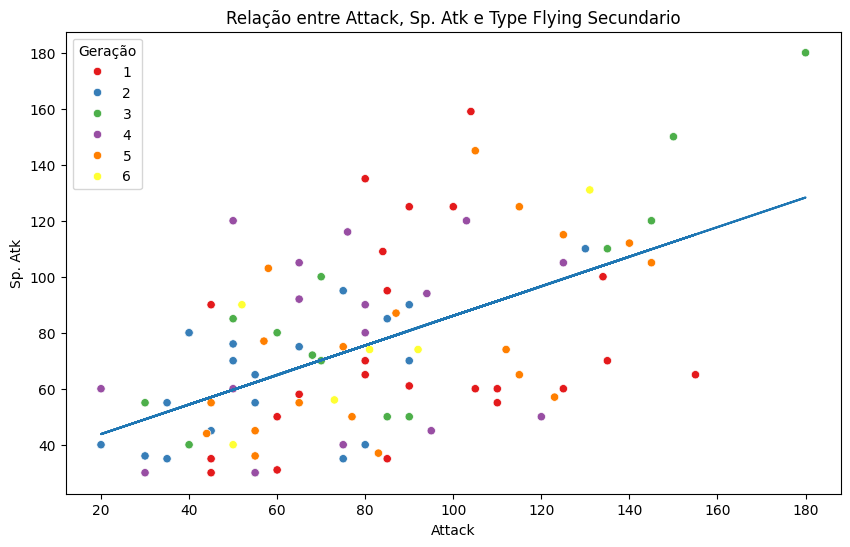

In [128]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Flying'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Flying Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Flying']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

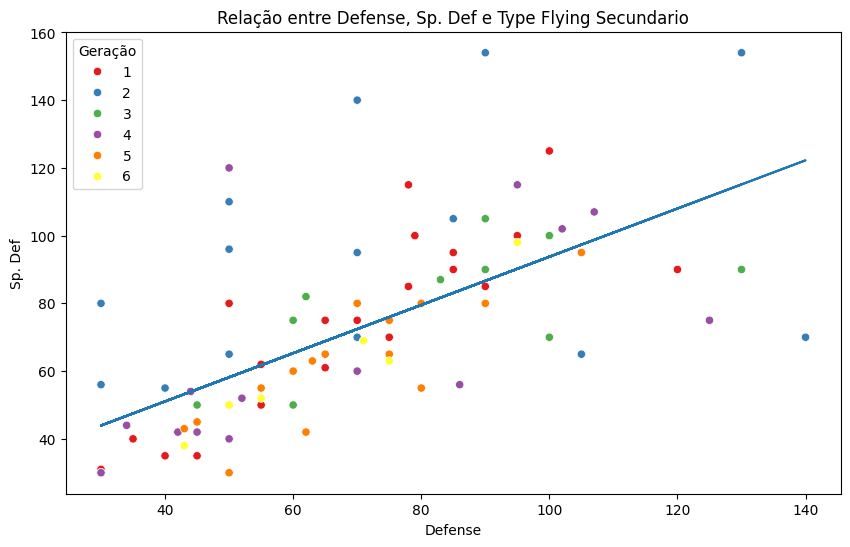

In [129]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Flying'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Flying Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Flying']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

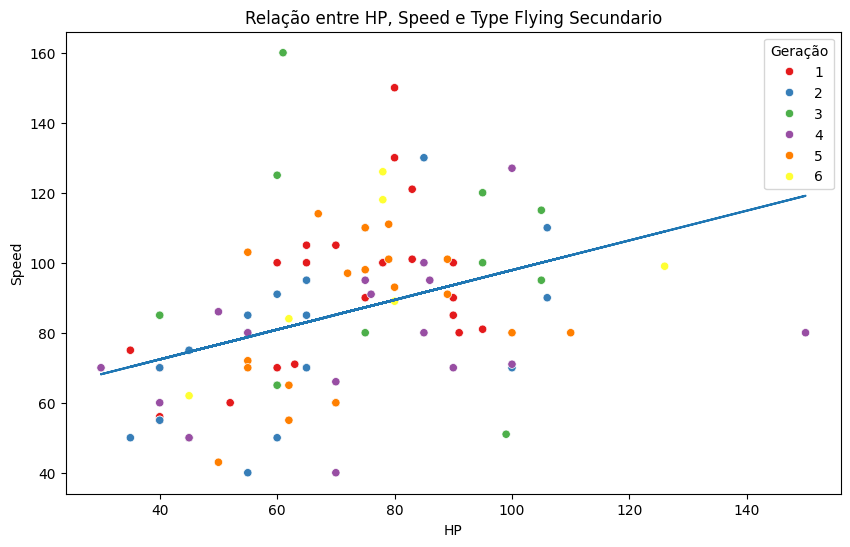

In [130]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Flying'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Flying Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Flying']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Flying secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo especial do que fisico e mais Speed do que ter mais HP

#### Normal

##### Tipo Primario

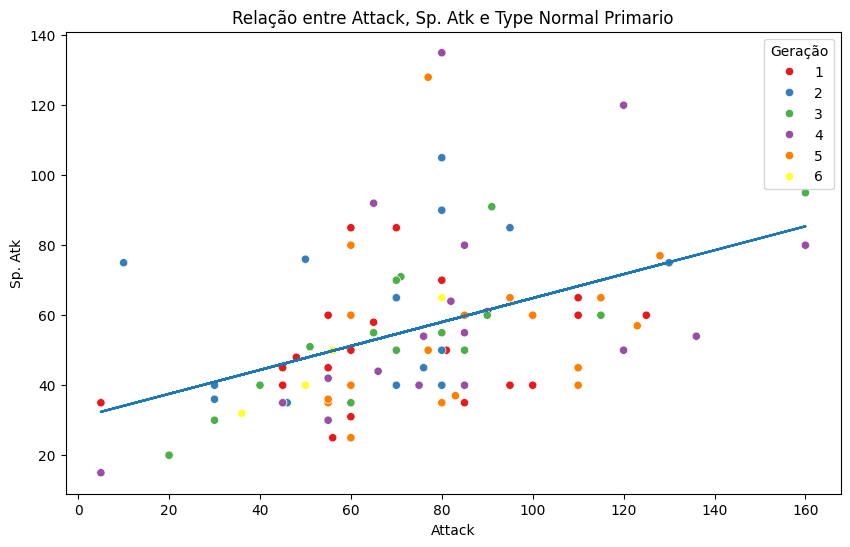

In [131]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Normal'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Normal Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Normal']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

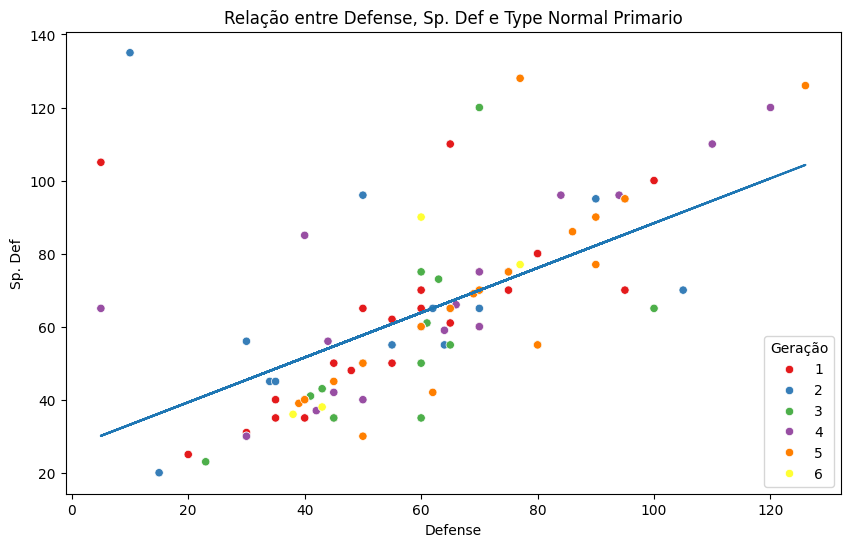

In [132]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Normal'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Normal Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Normal']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

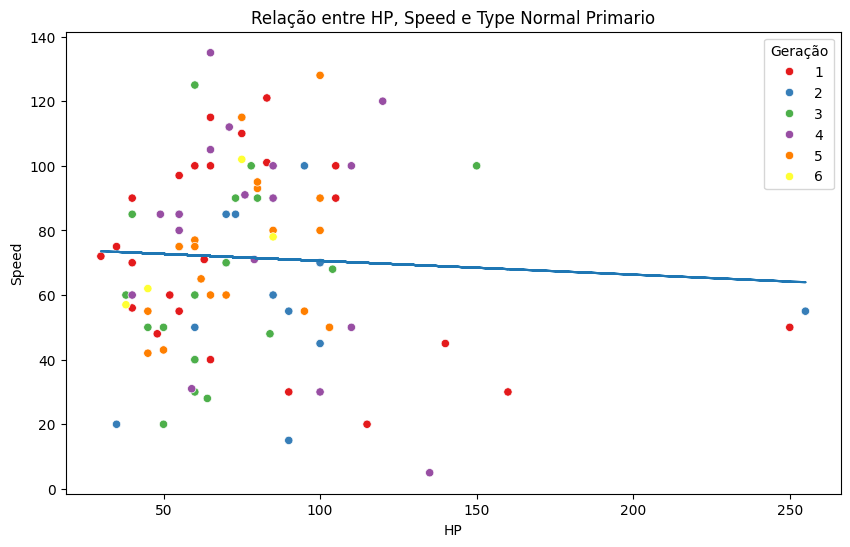

In [133]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Normal'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Normal Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Normal']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Normal primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais Speed do que ter mais HP

##### Tipo Secundario

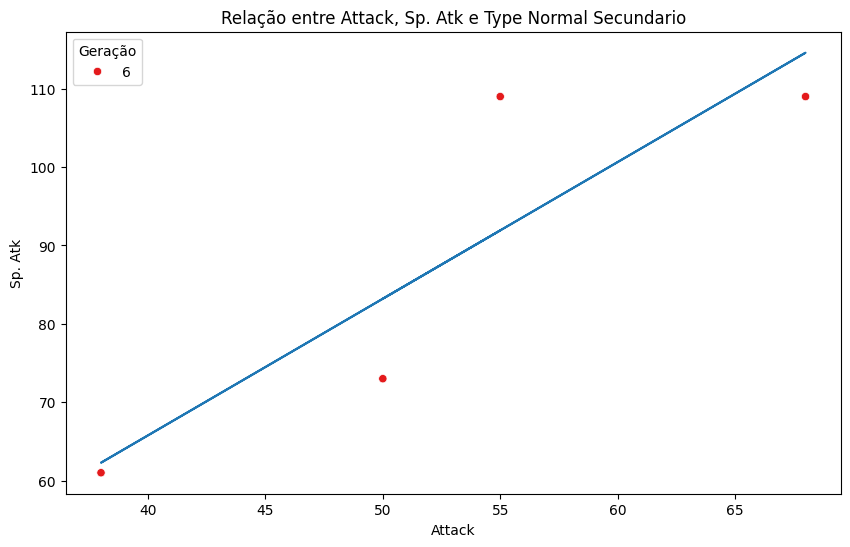

In [134]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Normal'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Normal Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Normal']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

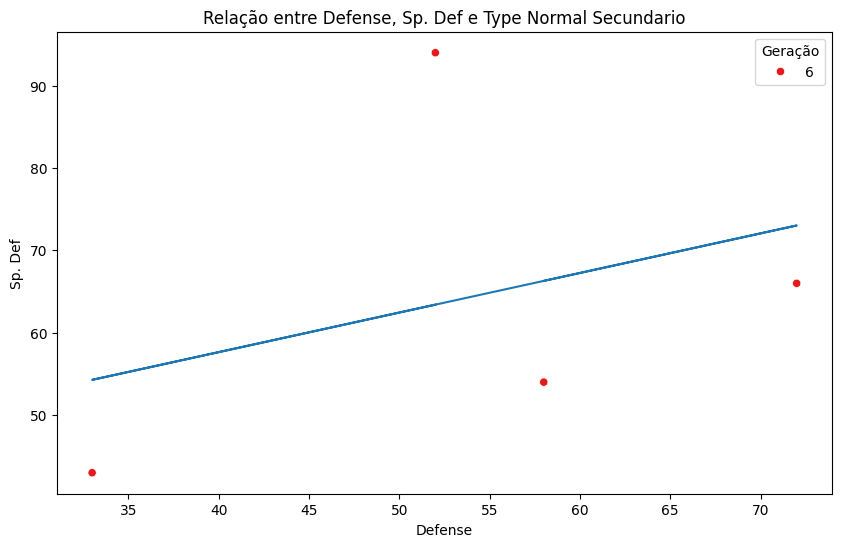

In [135]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Normal'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Normal Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Normal']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

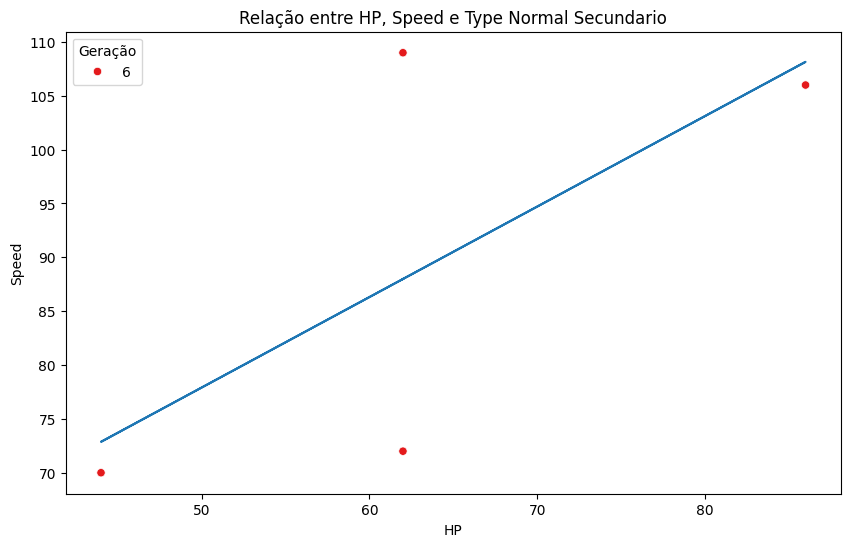

In [136]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Normal'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Normal Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Normal']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Normal secundario tem como tendencias ser mais ofensivo especial do que fisico, defensivo fisico do que especial e mais Speed do que ter mais HP

#### Ice

##### Tipo Primario

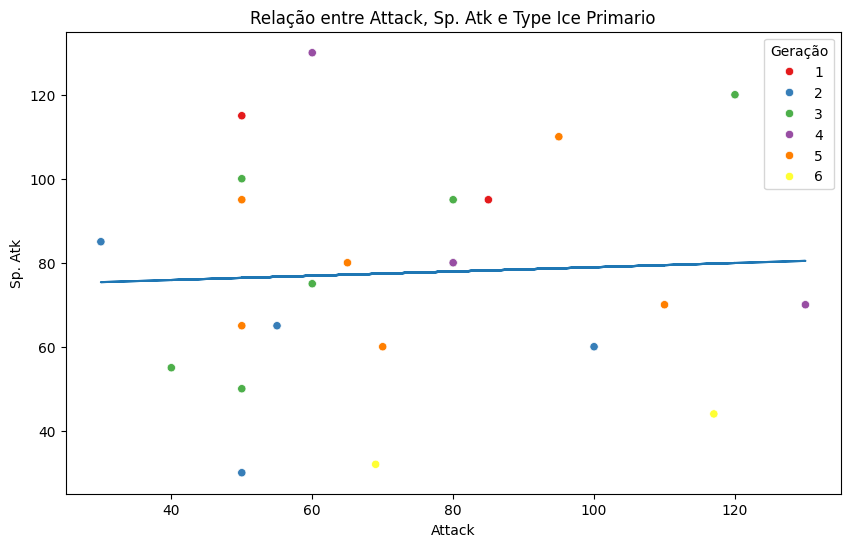

In [137]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ice'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Ice Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ice']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

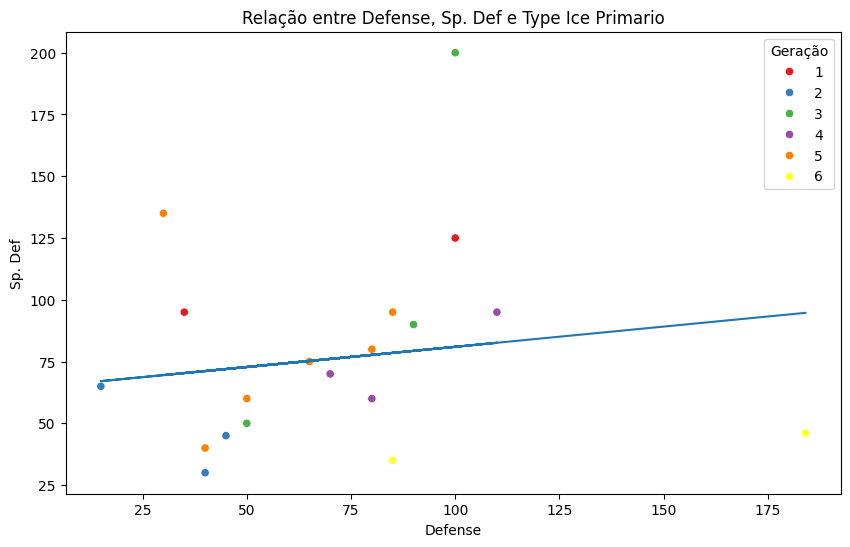

In [138]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ice'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Ice Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ice']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

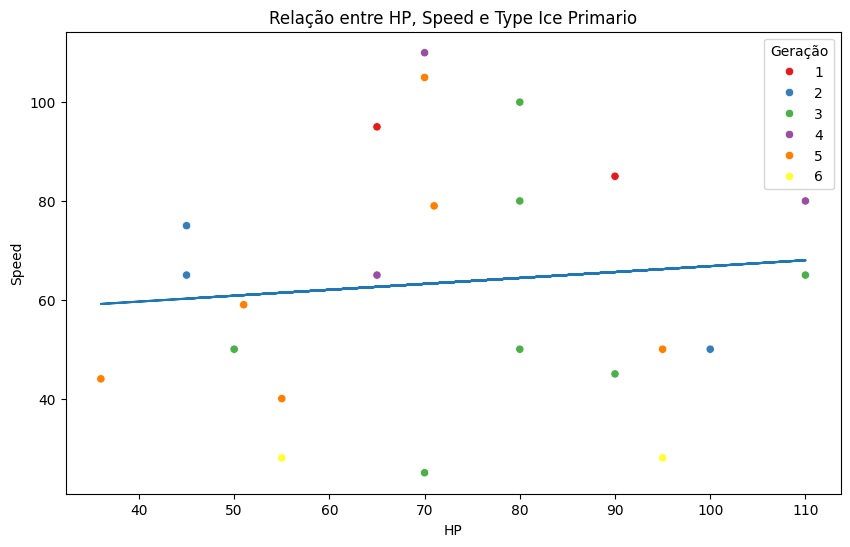

In [139]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Ice'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Ice Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ice']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Ice primario tem como tendencias ser mais ofensivo especial do que fisico, defensivo fisico do que especial e mais Speed do que ter mais HP

##### Tipo Secundario

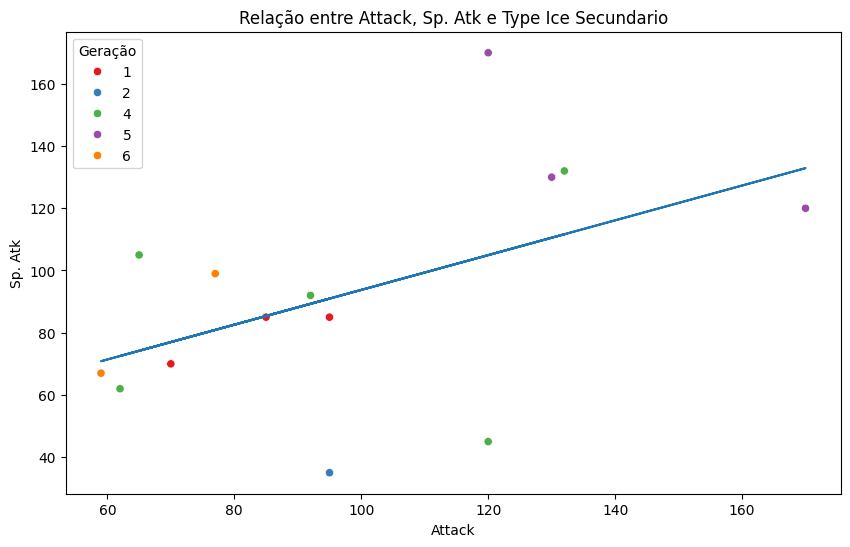

In [140]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ice'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Ice Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ice']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

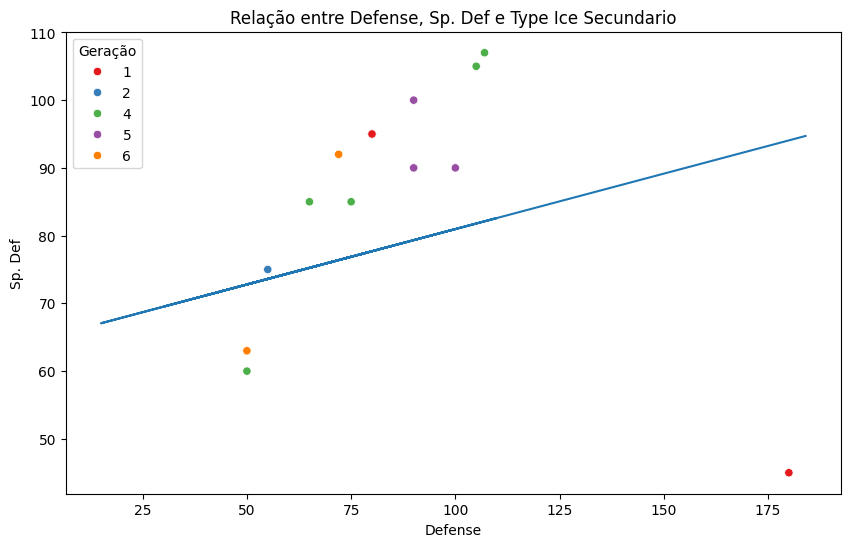

In [141]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ice'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Ice Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Ice']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

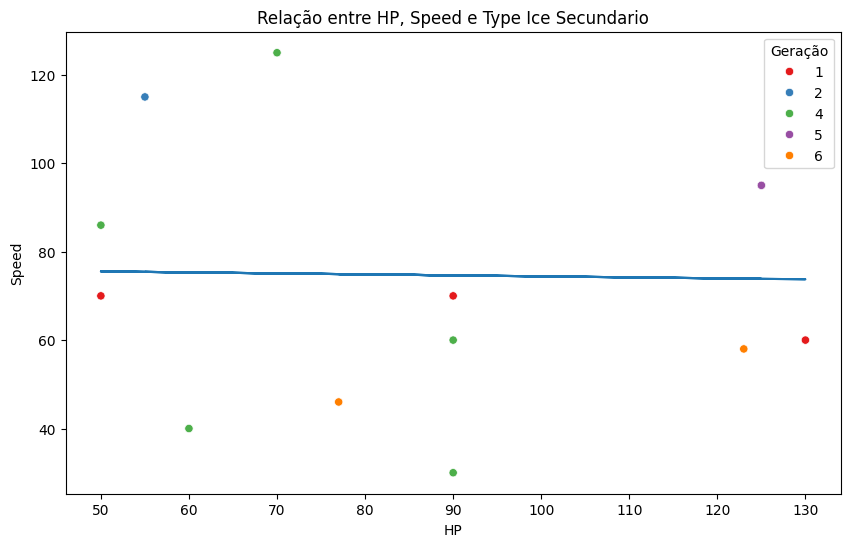

In [142]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Ice'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Ice Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Ice']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Ice secundario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais HP do que ter mais Speed

#### Rock

##### Tipo Primario

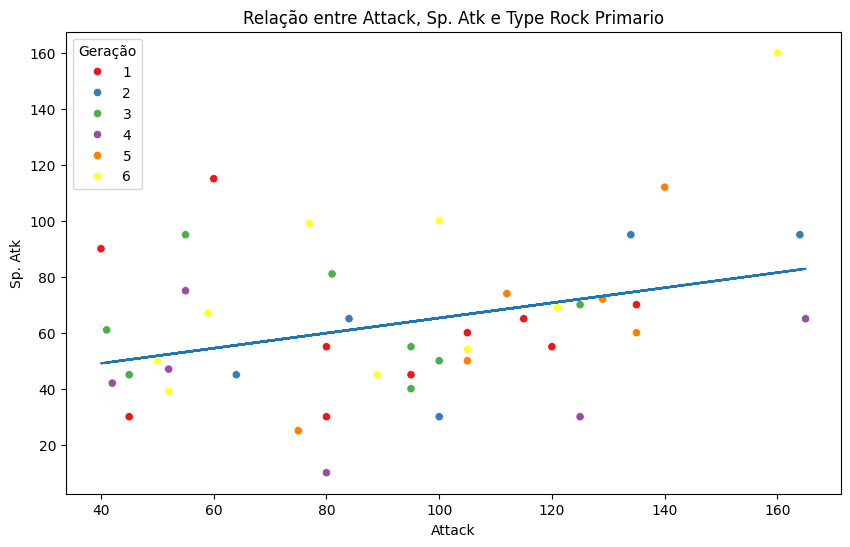

In [143]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Rock'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Rock Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Rock']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

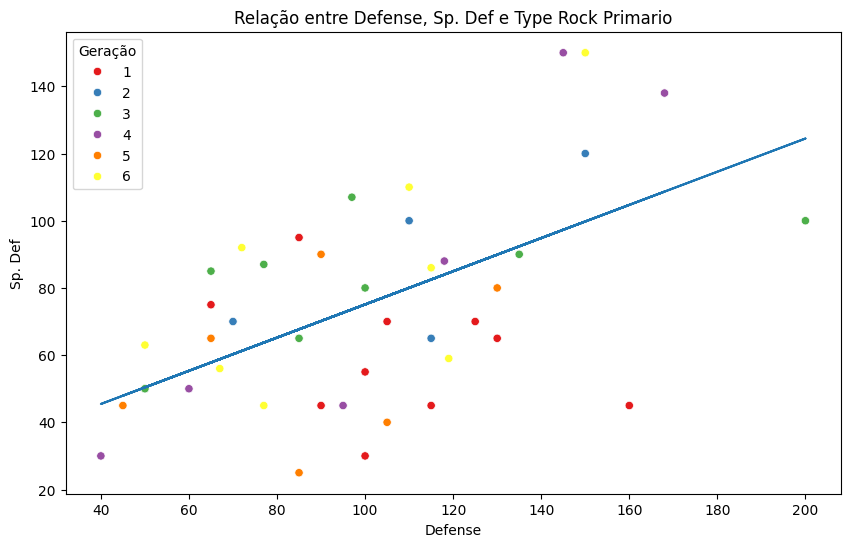

In [144]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Rock'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Rock Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Rock']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

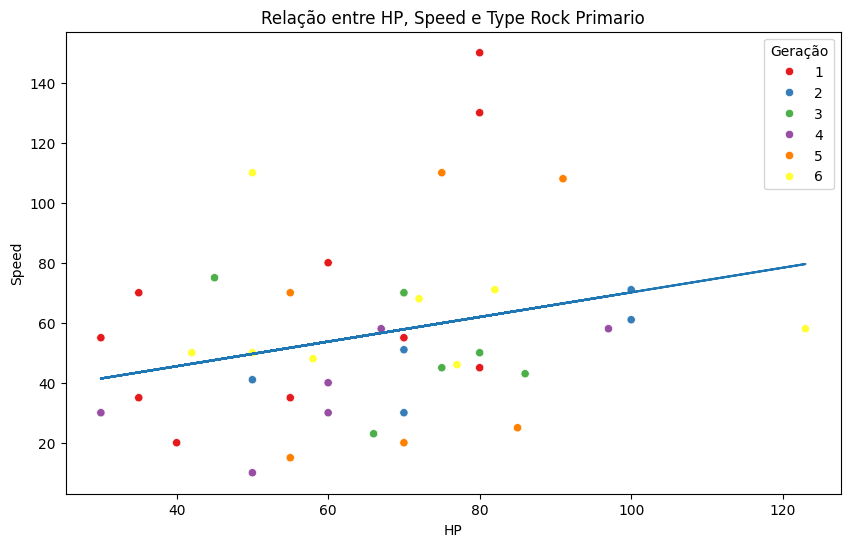

In [145]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Rock'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Rock Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Rock']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Rock primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

##### Tipo Secundario

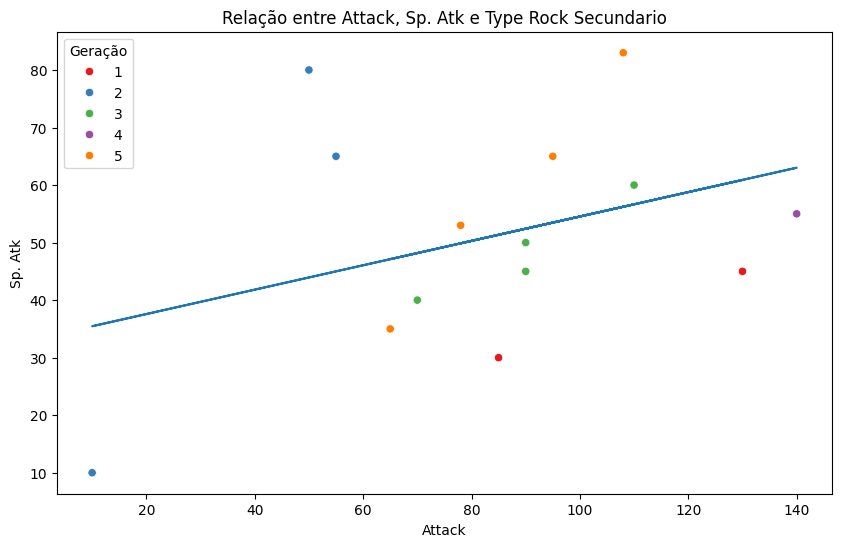

In [146]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Rock'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Rock Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Rock']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

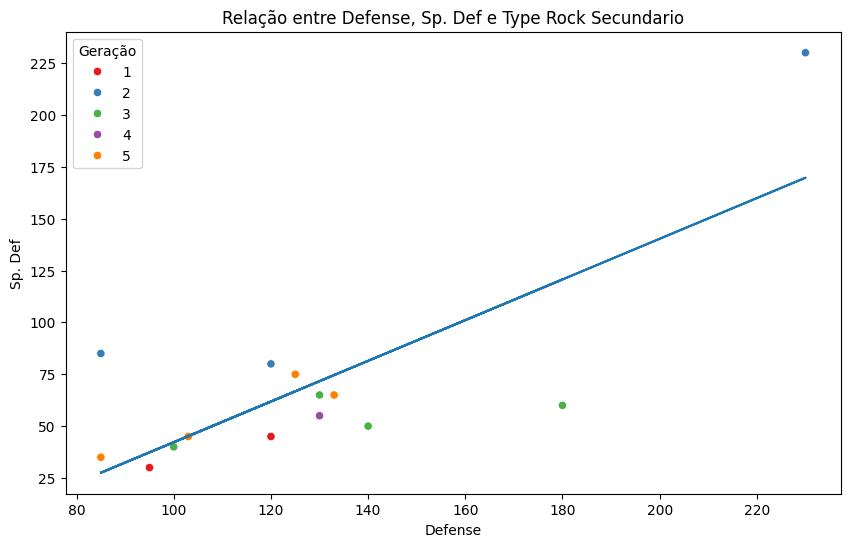

In [147]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Rock'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Rock Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Rock']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

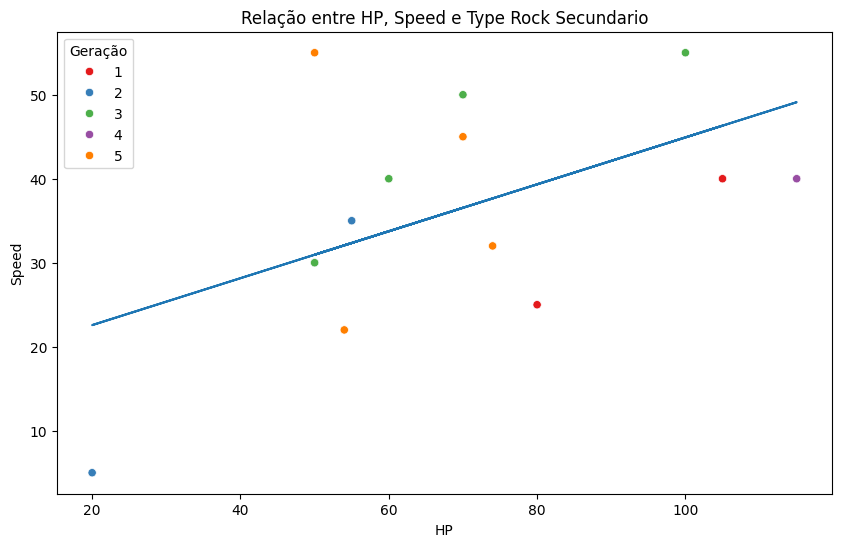

In [148]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Rock'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Rock Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Rock']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Rock secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

####Psychic

##### Tipo Primario

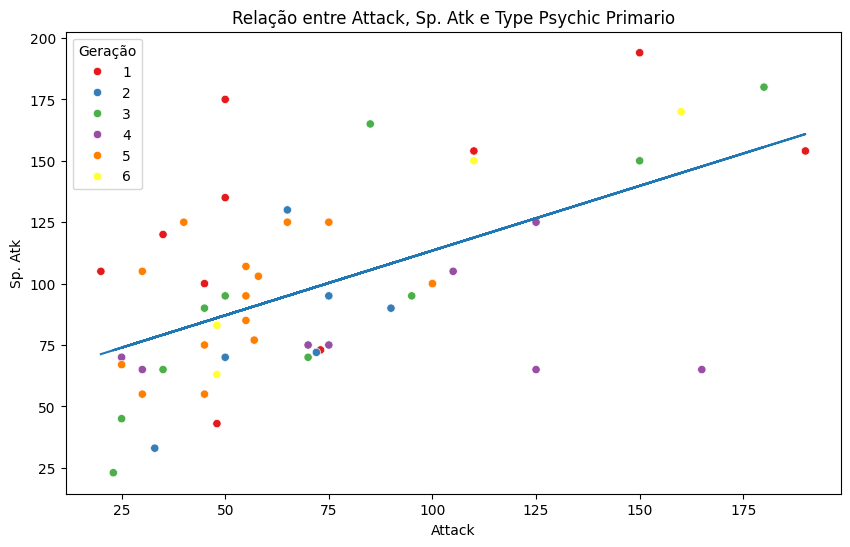

In [149]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Psychic'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Psychic Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Psychic']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

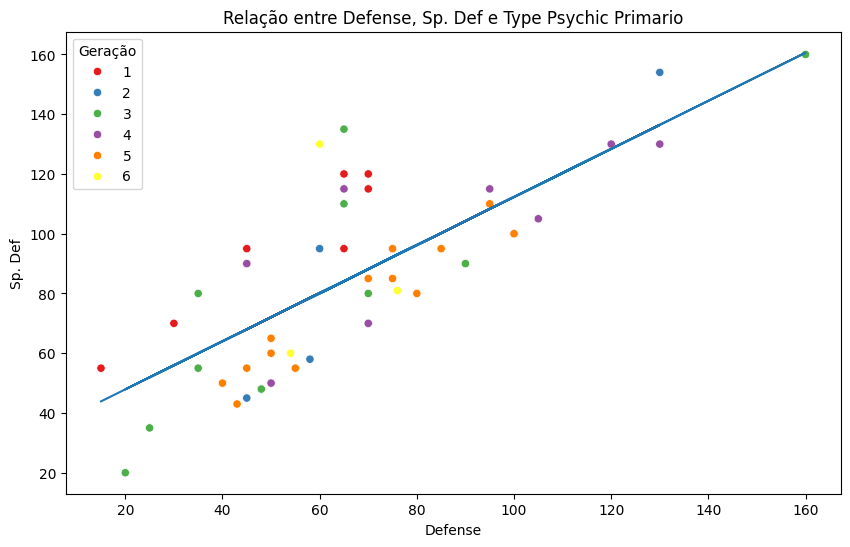

In [150]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Psychic'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Psychic Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Psychic']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

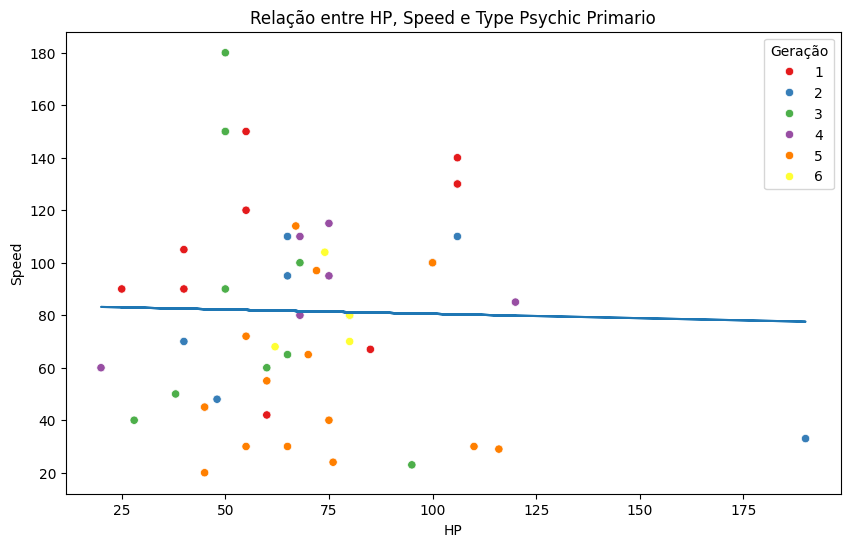

In [151]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Psychic'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Psychic Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Psychic']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Psychic primario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais HP do que ter mais Speed

##### Tipo Secundario

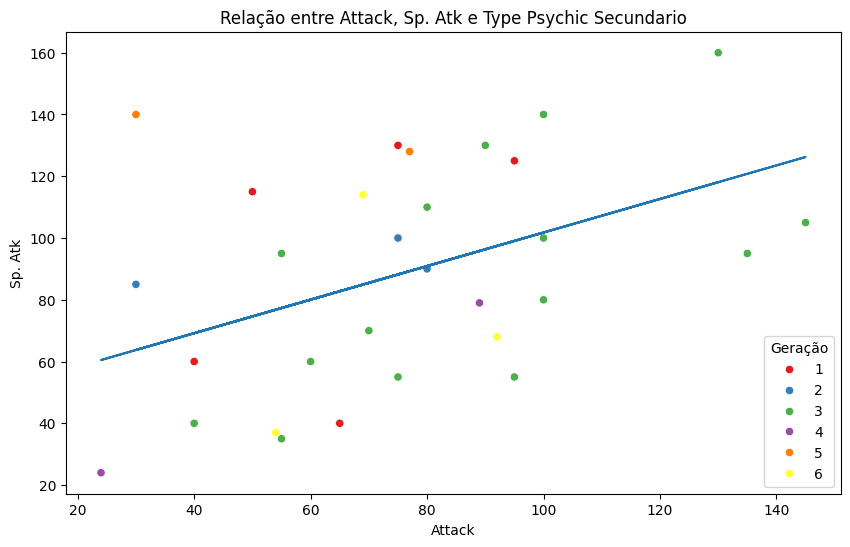

In [152]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Psychic'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Psychic Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Psychic']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

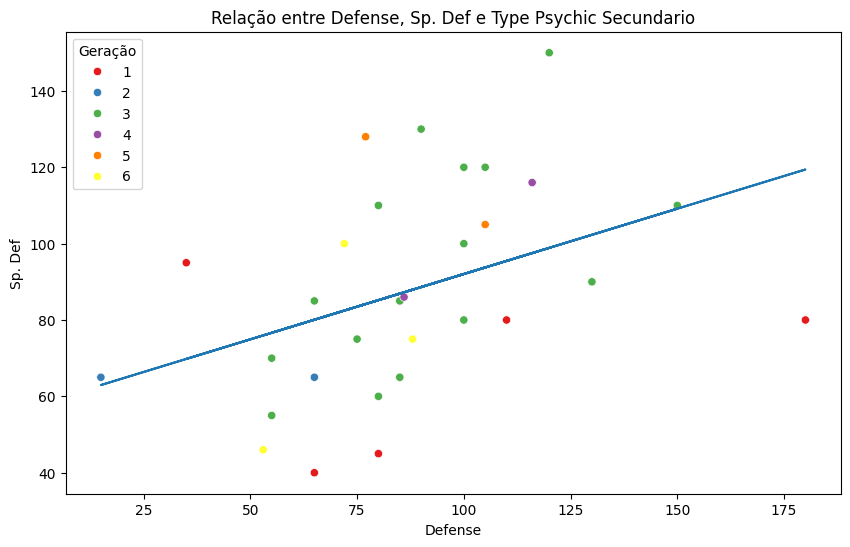

In [153]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Psychic'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Psychic Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Psychic']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

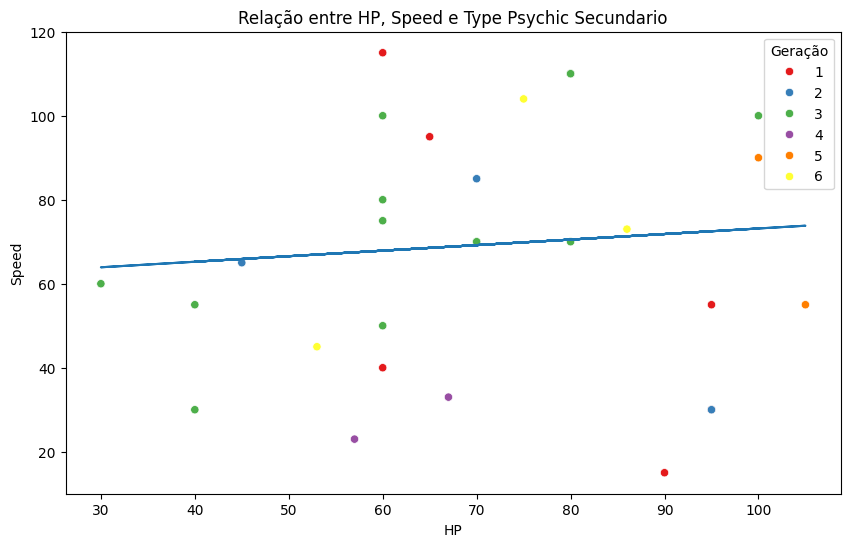

In [154]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Psychic'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Psychic Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Psychic']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Psychic secundario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais Speed do que ter mais HP

#### Poison

##### Tipo Primario

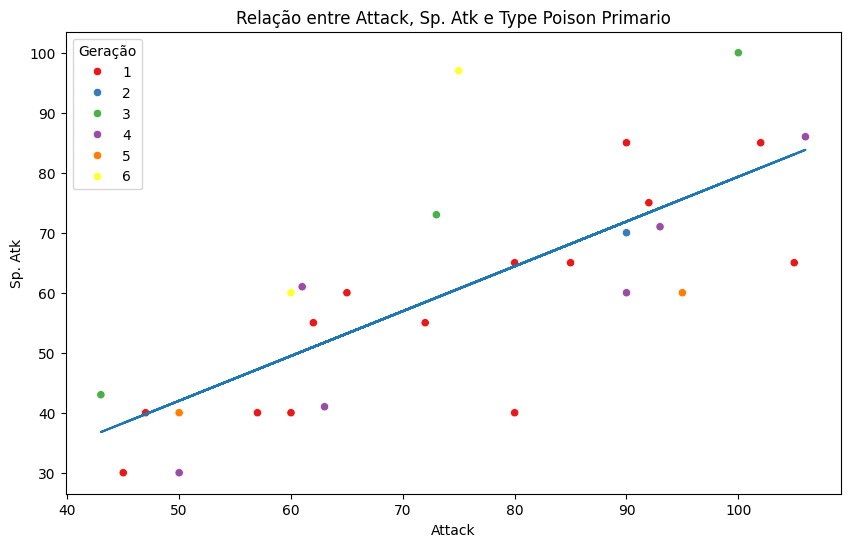

In [155]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Poison'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Poison Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Poison']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

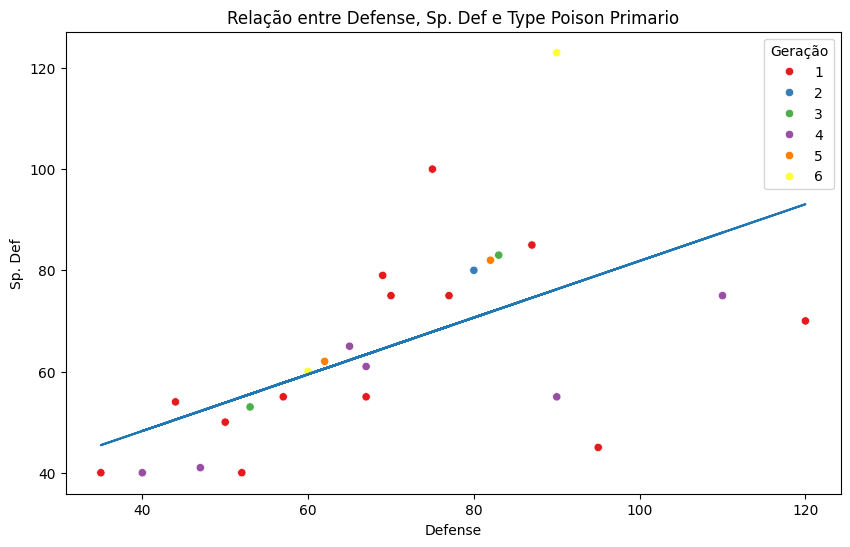

In [156]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Poison'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Poison Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Poison']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

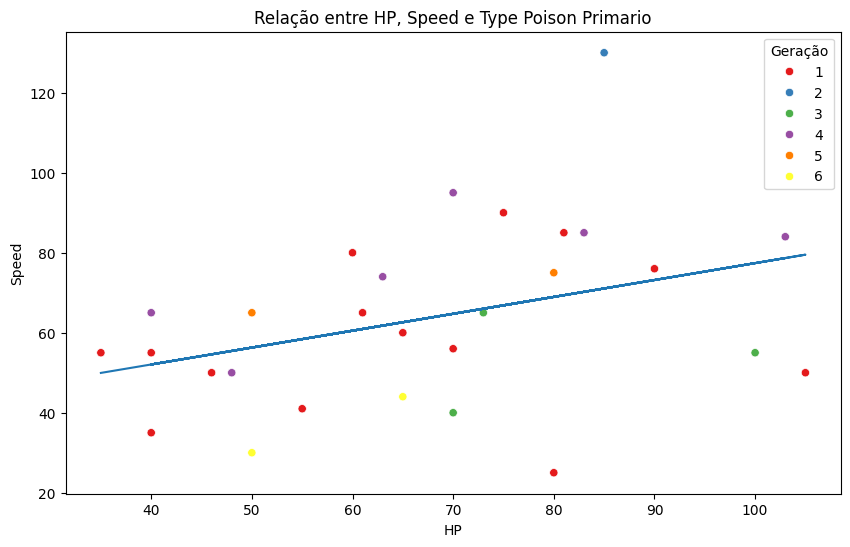

In [157]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Poison'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Poison Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Poison']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Poison primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

##### Tipo Secundario

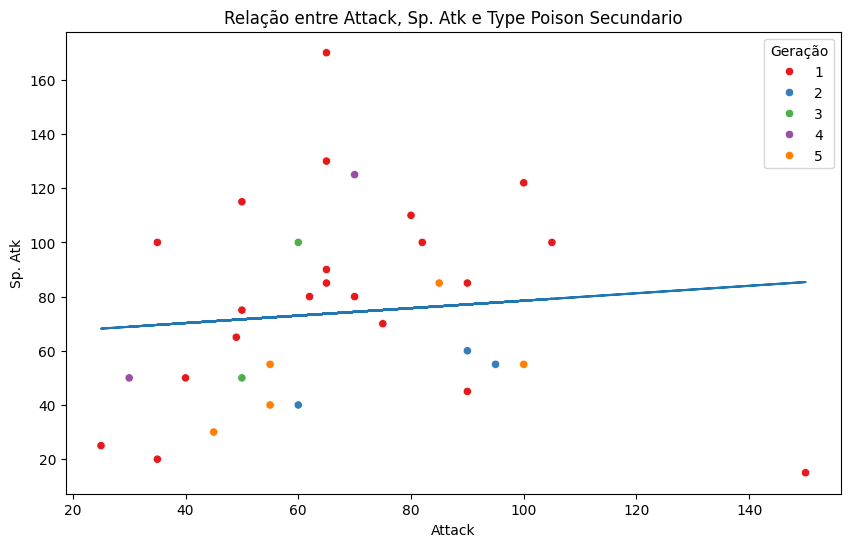

In [158]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Poison'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Poison Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Poison']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

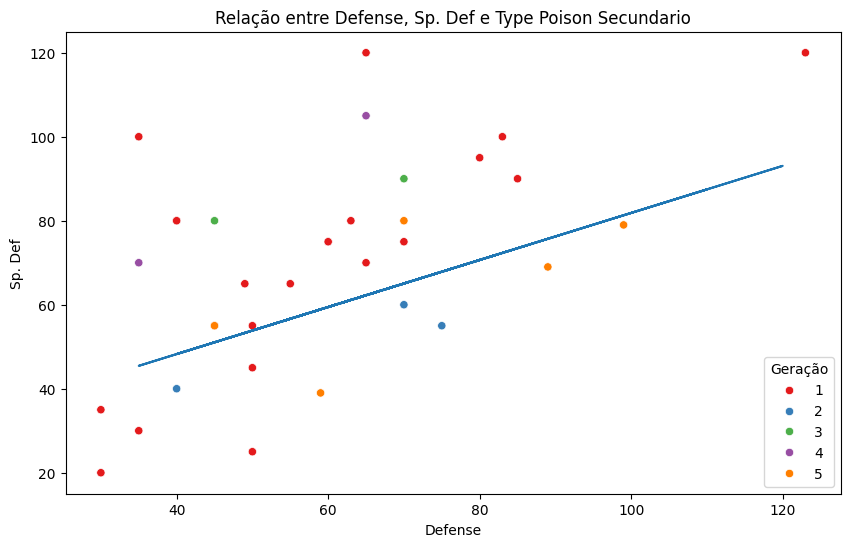

In [159]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Poison'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Poison Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Poison']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

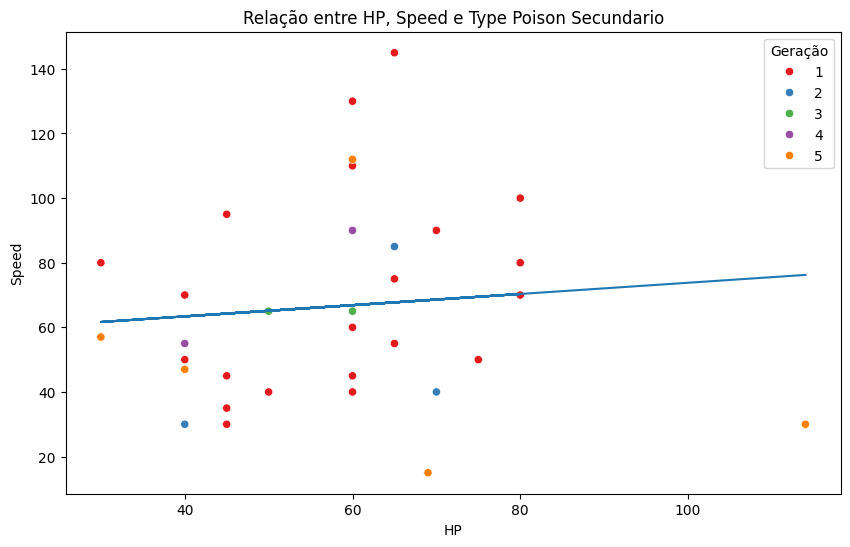

In [160]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Poison'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Poison Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Poison']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Poison secundario tem como tendencias ser mais ofensivo especial do que fisico, defensivo especial do que fisico e mais Speed do que ter mais HP

#### Steel

##### Tipo Primario

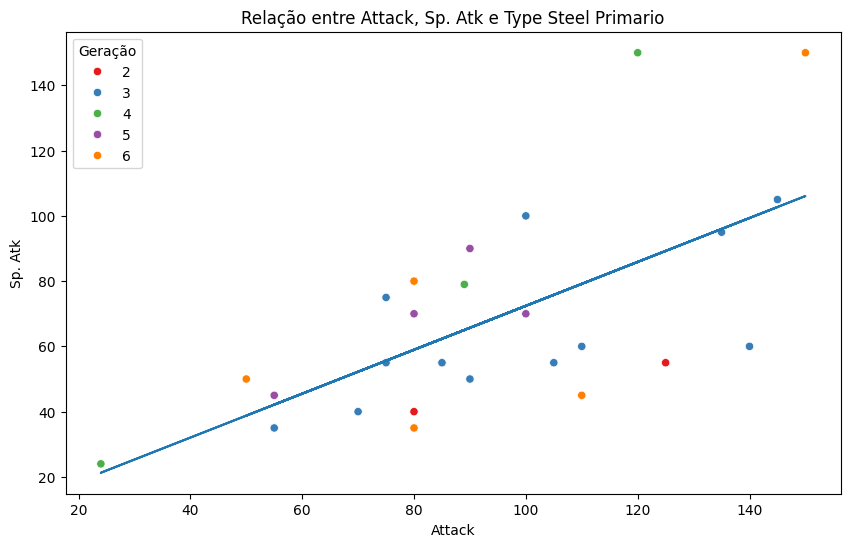

In [161]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Steel'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Steel Primario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Steel']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

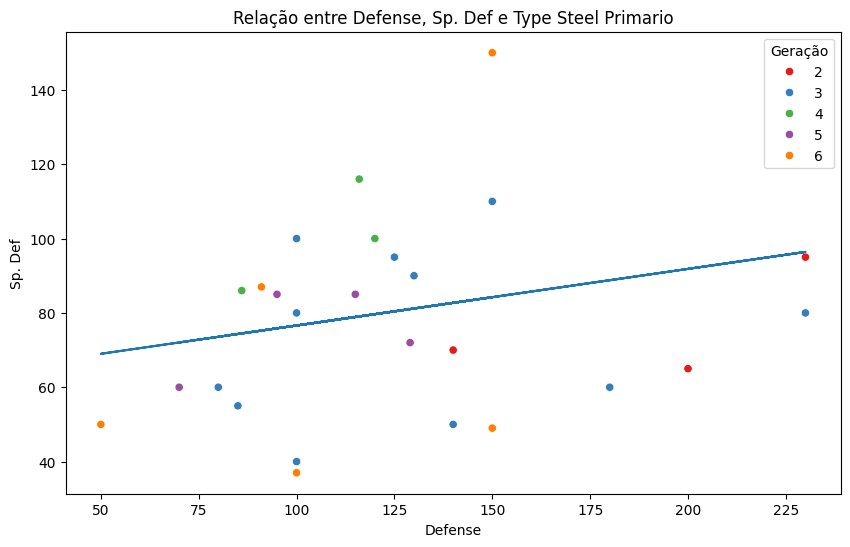

In [162]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Steel'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Steel Primario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Steel']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

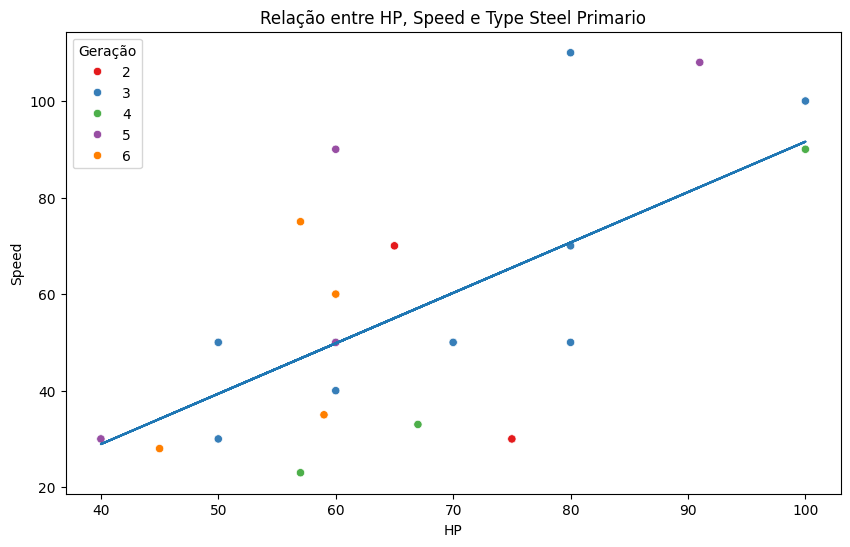

In [163]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 1']== 'Steel'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Steel Primario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 1']== 'Steel']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Steel primario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

##### Tipo Secundario

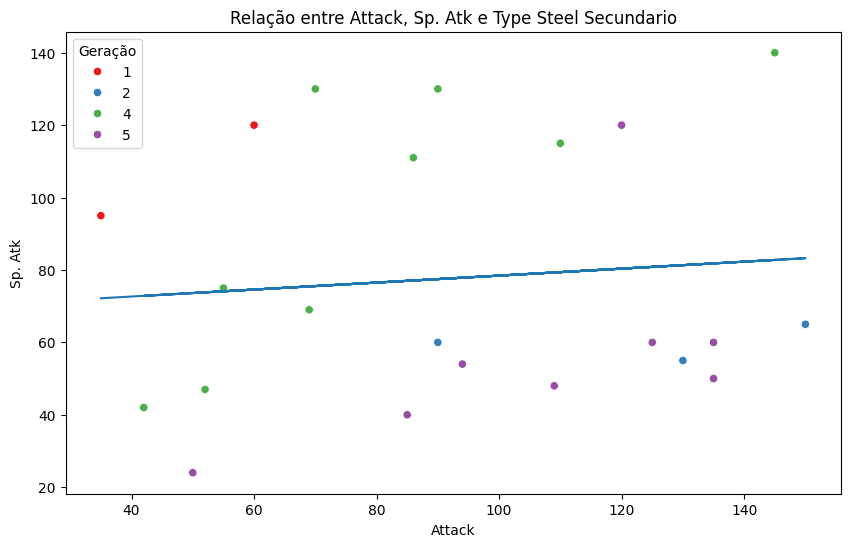

In [164]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Steel'], x="Attack", y="Sp. Atk", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Attack, Sp. Atk e Type Steel Secundario") #Alteração do titulo
plt.xlabel("Attack")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Atk")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Steel']
x = data['Attack']
y = data['Sp. Atk']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

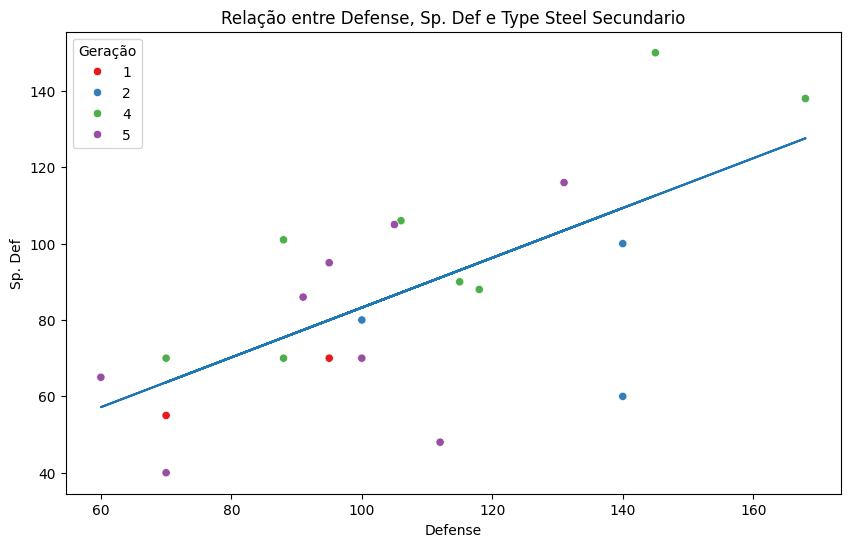

In [165]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Steel'], x="Defense", y="Sp. Def", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Defense, Sp. Def e Type Steel Secundario") #Alteração do titulo
plt.xlabel("Defense")                                      #Alteração do indicador do eixo X
plt.ylabel("Sp. Def")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Steel']
x = data['Defense']
y = data['Sp. Def']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

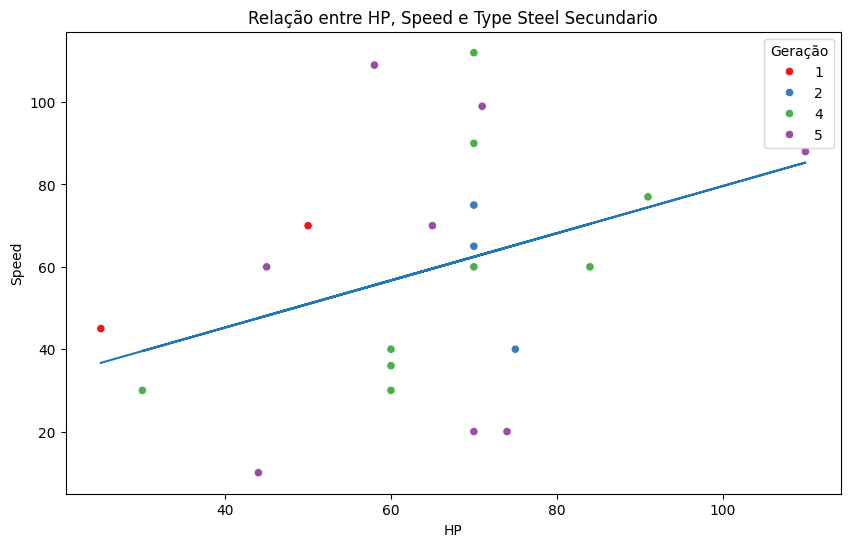

In [166]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.scatterplot(data=df3[df3['Type 2']== 'Steel'], x="HP", y="Speed", hue="Generation", palette="Set1")#Criação da Dispersão
plt.title("Relação entre HP, Speed e Type Steel Secundario") #Alteração do titulo
plt.xlabel("HP")                                      #Alteração do indicador do eixo X
plt.ylabel("Speed")                                     #Alteração do indicador do eixo Y
plt.legend(title="Geração")                          #Adicionar titulo à legenda

data = df3[df3['Type 2']== 'Steel']
x = data['HP']
y = data['Speed']
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x))

plt.show()                                               #Mostrar a imagem

O tipo Steel secundario tem como tendencias ser mais ofensivo fisico do que especial, defensivo fisico do que especial e mais HP do que ter mais Speed

### Histograma em Massa

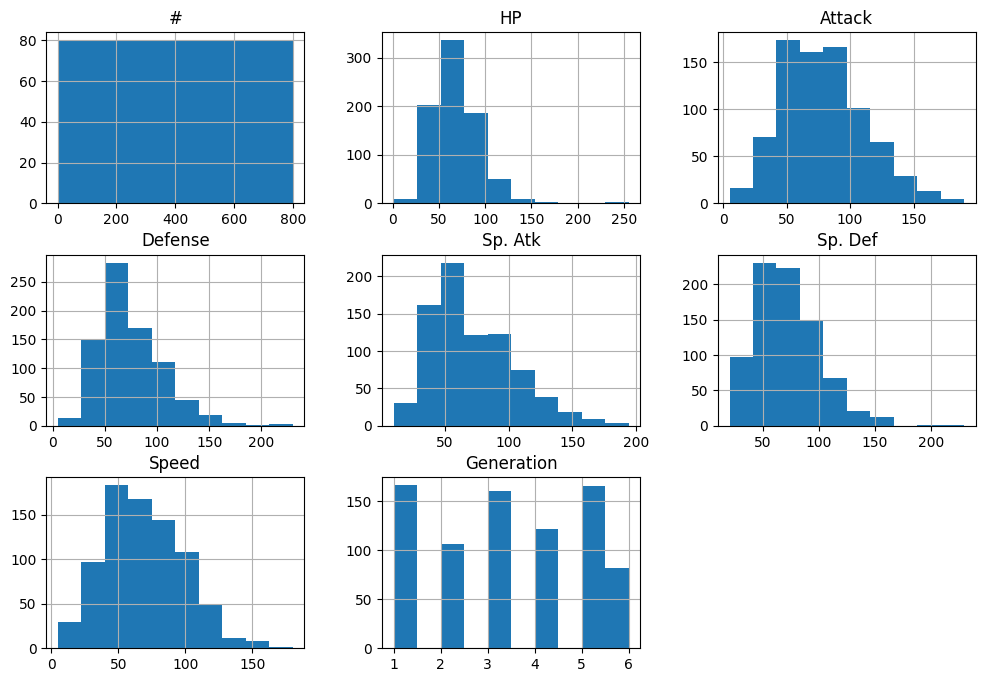

In [167]:
df3.hist(figsize=(12,8));

###Mapa de Calor dos Status

Conversão dos Tipos dos pokemons para tipagem numerica para inserção no mapa de calor

In [168]:
for i in range(len(df3['Type 1'])):
  if df3['Type 1'][i] == 'Fire':
    df3['Type 1'][i] = 1
  if df3['Type 1'][i] == 'Water':
    df3['Type 1'][i] = 2
  if df3['Type 1'][i] == 'Grass':
    df3['Type 1'][i] = 3
  if df3['Type 1'][i] == 'Ground':
    df3['Type 1'][i] = 4
  if df3['Type 1'][i] == 'Steel':
    df3['Type 1'][i] = 5
  if df3['Type 1'][i] == 'Bug':
    df3['Type 1'][i] = 6
  if df3['Type 1'][i] == 'Fighting':
    df3['Type 1'][i] = 7
  if df3['Type 1'][i] == 'Fairy':
    df3['Type 1'][i] = 8
  if df3['Type 1'][i] == 'Dragon':
    df3['Type 1'][i] = 9
  if df3['Type 1'][i] == 'Normal':
    df3['Type 1'][i] = 10
  if df3['Type 1'][i] == 'Electric':
    df3['Type 1'][i] = 11
  if df3['Type 1'][i] == 'Ice':
    df3['Type 1'][i] = 12
  if df3['Type 1'][i] == 'Poison':
    df3['Type 1'][i] = 13
  if df3['Type 1'][i] == 'Flying':
    df3['Type 1'][i] = 14
  if df3['Type 1'][i] == 'Psychic':
    df3['Type 1'][i] = 15
  if df3['Type 1'][i] == 'Rock':
    df3['Type 1'][i] = 16
  if df3['Type 1'][i] == 'Dark':
    df3['Type 1'][i] = 17
  if df3['Type 1'][i] == 'Ghost':
    df3['Type 1'][i] = 18

for i in range(len(df3['Type 2'])):
  if df3['Type 2'][i] == 'Fire':
    df3['Type 2'][i] = 1
  if df3['Type 2'][i] == 'Water':
    df3['Type 2'][i] = 2
  if df3['Type 2'][i] == 'Grass':
    df3['Type 2'][i] = 3
  if df3['Type 2'][i] == 'Ground':
    df3['Type 2'][i] = 4
  if df3['Type 2'][i] == 'Steel':
    df3['Type 2'][i] = 5
  if df3['Type 2'][i] == 'Bug':
    df3['Type 2'][i] = 6
  if df3['Type 2'][i] == 'Fighting':
    df3['Type 2'][i] = 7
  if df3['Type 2'][i] == 'Fairy':
    df3['Type 2'][i] = 8
  if df3['Type 2'][i] == 'Dragon':
    df3['Type 2'][i] = 9
  if df3['Type 2'][i] == 'Normal':
    df3['Type 2'][i] = 10
  if df3['Type 2'][i] == 'Electric':
    df3['Type 2'][i] = 11
  if df3['Type 2'][i] == 'Ice':
    df3['Type 2'][i] = 12
  if df3['Type 2'][i] == 'Poison':
    df3['Type 2'][i] = 13
  if df3['Type 2'][i] == 'Flying':
    df3['Type 2'][i] = 14
  if df3['Type 2'][i] == 'Psychic':
    df3['Type 2'][i] = 15
  if df3['Type 2'][i] == 'Rock':
    df3['Type 2'][i] = 16
  if df3['Type 2'][i] == 'Dark':
    df3['Type 2'][i] = 17
  if df3['Type 2'][i] == 'Ghost':
    df3['Type 2'][i] = 18

A saída de streaming foi truncada nas últimas 5000 linhas.
<ipython-input-168-e73e1c00ab79>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Type 1'][i] = 2
<ipython-input-168-e73e1c00ab79>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Type 1'][i] = 18
<ipython-input-168-e73e1c00ab79>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Type 1'][i] = 15
<ipython-input-168-e73e1c00ab79>:31: SettingWithCopyWarning: 
A val

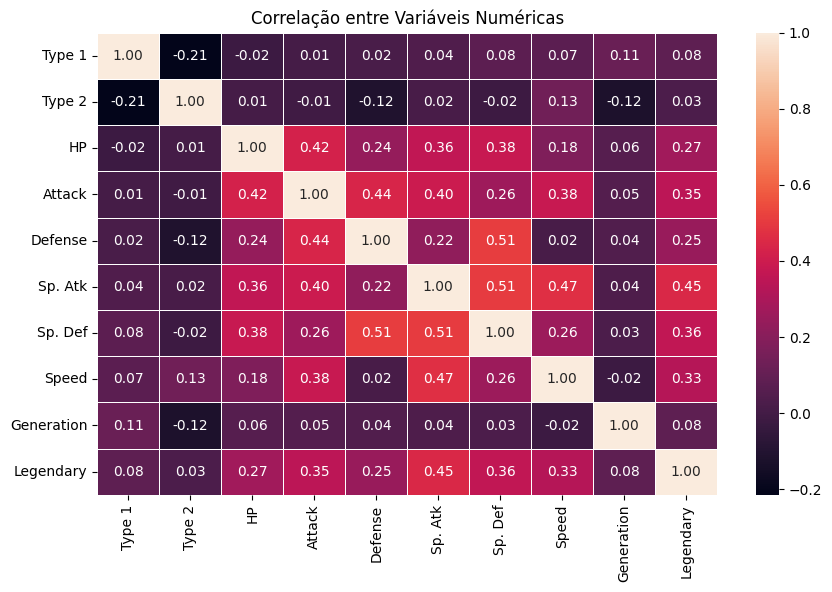

In [169]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.heatmap(df3[['Type 1','Type 2','HP','Attack','Defense','Sp. Atk','Sp. Def','Speed','Generation','Legendary']].corr(), annot=True, fmt=".2f", linewidths=0.5)
plt.title("Correlação entre Variáveis Numéricas")    #Alteração do titulo
plt.show()                                           #Mostrar a imagem

## Analise Exploratoria Attacks

### Distribuição das Caracteristicas

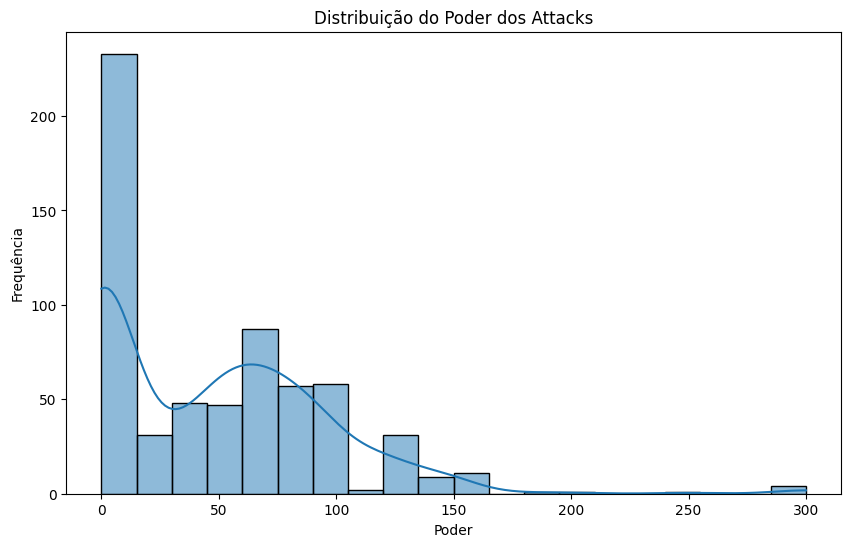

In [170]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df, x='Poder', bins=20, kde=True) #Criação de Histograma
plt.title("Distribuição do Poder dos Attacks")  #Alteração do titulo
plt.xlabel("Poder")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

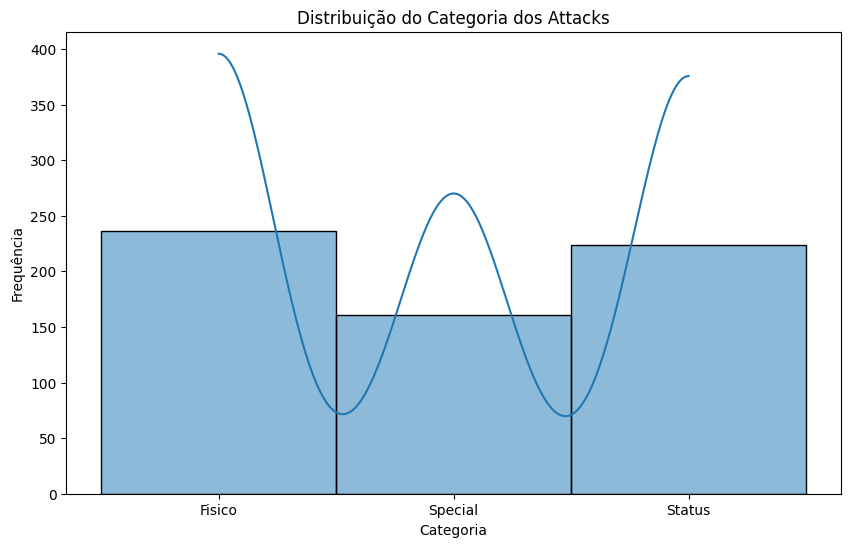

In [171]:
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.histplot(data=df, x='Categoria', bins=20, kde=True) #Criação de Histograma
plt.title("Distribuição do Categoria dos Attacks")  #Alteração do titulo
plt.xlabel("Categoria")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

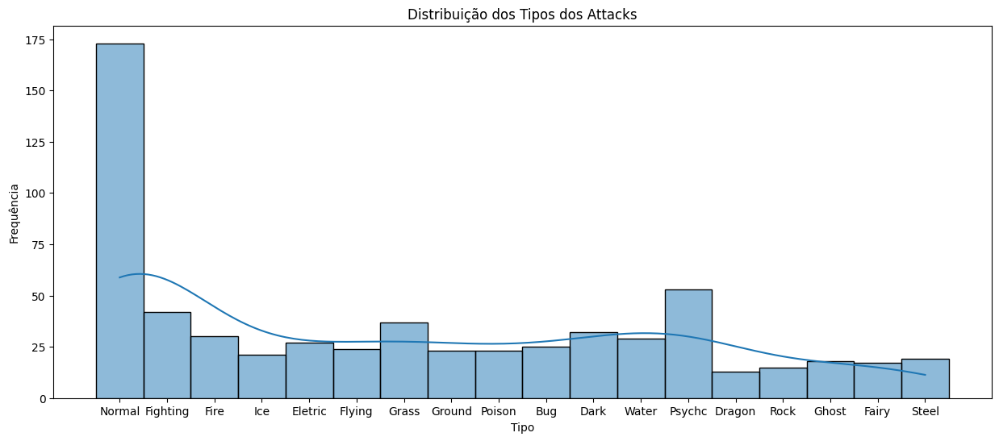

In [172]:
plt.figure(figsize=(15, 6)) #criação do tamanho da figura
sns.histplot(data=df, x='Tipo', bins=20, kde=True) #Criação de Histograma
plt.title("Distribuição dos Tipos dos Attacks")  #Alteração do titulo
plt.xlabel("Tipo")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

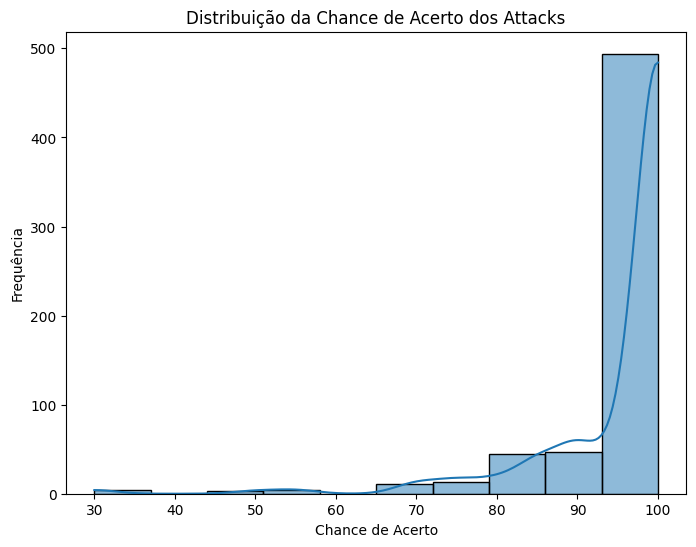

In [173]:
plt.figure(figsize=(8, 6)) #criação do tamanho da figura
sns.histplot(data=df, x='Chance de Acerto', bins=10, kde=True) #Criação de Histograma
plt.title("Distribuição da Chance de Acerto dos Attacks")  #Alteração do titulo
plt.xlabel("Chance de Acerto")                                 #Alteração do indicador do eixo X
plt.ylabel("Frequência")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

### Relação das Características

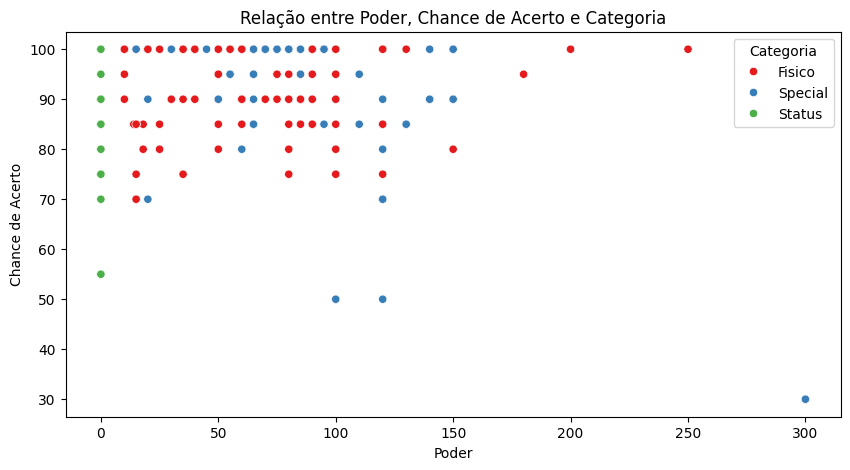

In [174]:
plt.figure(figsize=(10, 5))#criação do tamanho da figura
sns.scatterplot(data=df, x="Poder", y="Chance de Acerto", hue="Categoria", palette="Set1")#Criação da Dispersão
plt.title("Relação entre Poder, Chance de Acerto e Categoria") #Alteração do titulo
plt.xlabel("Poder")                                      #Alteração do indicador do eixo X
plt.ylabel("Chance de Acerto")                                     #Alteração do indicador do eixo Y
plt.legend(title="Categoria")                          #Adicionar titulo à legenda
plt.show()                                               #Mostrar a imagem

Percebe-se que todos os Status tem poder 0 e tem tendencia de ser >=75 a chance de acerto, ja os fisicos tem tendencia de poder >=50 e chance de acerto de >=90, ja os especiais tem tendencia de poder >=50 e chance de acerto de >=95

### Mapa de Calor

Conversão das Categorias para tipagem númerica para inserção no mapa de calor

In [175]:
for i in range(len(df['Categoria'])):
  if df['Categoria'][i] == 'Fisico':
    df['Categoria'][i] = 1
  if df['Categoria'][i] == 'Special':
    df['Categoria'][i] = 2
  if df['Categoria'][i] == 'Status':
    df['Categoria'][i] = 0

<ipython-input-175-e5ae7b602277>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Categoria'][i] = 1
<ipython-input-175-e5ae7b602277>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Categoria'][i] = 1
<ipython-input-175-e5ae7b602277>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Categoria'][i] = 1
<ipython-input-175-e5ae7b602277>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

Conversão dos Tipos dos attacks para tipagem numerica para inserção no mapa de calor

In [176]:
for i in range(len(df['Tipo'])):
  if df['Tipo'][i] == 'Fire':
    df['Tipo'][i] = 1
  if df['Tipo'][i] == 'Water':
    df['Tipo'][i] = 2
  if df['Tipo'][i] == 'Grass':
    df['Tipo'][i] = 3
  if df['Tipo'][i] == 'Ground':
    df['Tipo'][i] = 4
  if df['Tipo'][i] == 'Steel':
    df['Tipo'][i] = 5
  if df['Tipo'][i] == 'Bug':
    df['Tipo'][i] = 6
  if df['Tipo'][i] == 'Fighting':
    df['Tipo'][i] = 7
  if df['Tipo'][i] == 'Fairy':
    df['Tipo'][i] = 8
  if df['Tipo'][i] == 'Dragon':
    df['Tipo'][i] = 9
  if df['Tipo'][i] == 'Normal':
    df['Tipo'][i] = 10
  if df['Tipo'][i] == 'Eletric':
    df['Tipo'][i] = 11
  if df['Tipo'][i] == 'Ice':
    df['Tipo'][i] = 12
  if df['Tipo'][i] == 'Poison':
    df['Tipo'][i] = 13
  if df['Tipo'][i] == 'Flying':
    df['Tipo'][i] = 14
  if df['Tipo'][i] == 'Psychc':
    df['Tipo'][i] = 15
  if df['Tipo'][i] == 'Rock':
    df['Tipo'][i] = 16
  if df['Tipo'][i] == 'Dark':
    df['Tipo'][i] = 17
  if df['Tipo'][i] == 'Ghost':
    df['Tipo'][i] = 18

<ipython-input-176-c5836fe8d7f6>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Tipo'][i] = 10
<ipython-input-176-c5836fe8d7f6>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Tipo'][i] = 7
<ipython-input-176-c5836fe8d7f6>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Tipo'][i] = 10
<ipython-input-176-c5836fe8d7f6>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See t

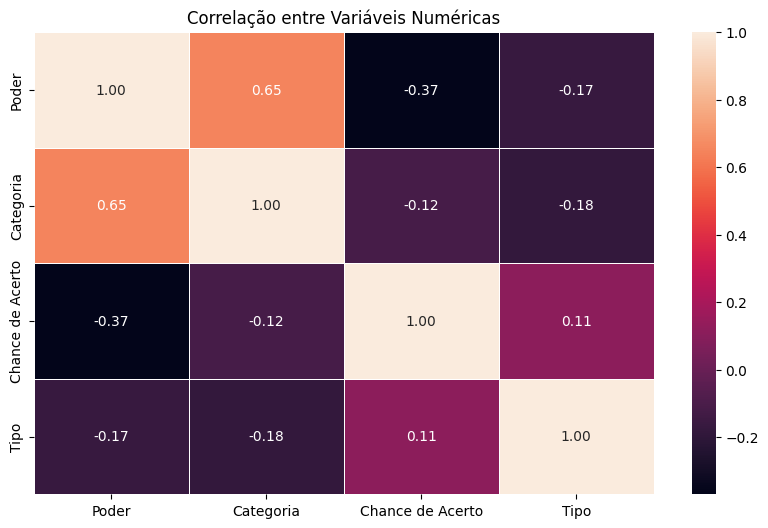

In [177]:
plt.figure(figsize=(10, 6))#criação do tamanho da figura
sns.heatmap(df[['Poder','Categoria','Chance de Acerto','Tipo']].corr(), annot=True, fmt=".2f", linewidths=0.5)
plt.title("Correlação entre Variáveis Numéricas")    #Alteração do titulo
plt.show()

# Parte 2

## Bibliotecas Adicionais

In [178]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

## Tratando o DataFrame dos combates (sendo que tenha dado run a parte 1)

Para melhor aproveitamento foi retirado o Nome dos golpes pois não era necessario

In [179]:
a = df.drop(columns=['Nome Golpe'])
a.head()

,ID,Poder,Categoria,Tipo,Chance de Acerto
0,1,40,1,10,100
1,2,50,1,7,100
2,3,15,1,10,85
3,4,18,1,10,85
4,5,80,1,10,85


Transformação do target que é o "Winner" para modo de classificação em que 0 é o primeiro pokemon como vencedor e 1 o segundo pokemon como vencedor

In [180]:
df2["Winner"]=np.where(df2['First_pokemon']==df2['Winner'],0,1)
df2.head(10)

,ID,First_pokemon,First_attack,Second_attack,Third_attack,Fouth_attack,Second_pokemon,First_attack.1,Second_attack.1,Third_attack.1,Fouth_attack.1,Winner
0,0,266,88,173,259,514,298,447,345,63,91,1
1,1,702,14,345,444,224,701,404,164,63,370,1
2,2,191,164,113,416,416,668,451,211,485,29,1
3,3,237,213,156,36,341,683,401,182,610,422,1
4,4,151,182,362,504,390,231,341,343,230,360,0
5,5,657,451,228,398,527,752,213,421,280,379,0
6,6,192,385,213,445,428,134,93,230,358,214,1
7,7,73,276,358,213,431,545,261,104,506,244,1
8,8,220,402,263,230,216,763,216,430,11,104,1
9,9,302,365,228,253,413,31,572,156,84,486,1


Para melhor aproveitamento foi retirado o Nome e Geração(mesmo sendo valor numérico) dos pokemon pois não era necessario

In [181]:
p = df3.drop(columns=['Name','Generation'])
p = p.fillna(0)
p.head()

,#,Type 1,Type 2,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Legendary
0,1,3,13,45,49,49,65,65,45,False
1,2,3,13,60,62,63,80,80,60,False
2,3,3,13,80,82,83,100,100,80,False
3,4,3,13,80,100,123,122,120,80,False
4,5,1,0,39,52,43,60,50,65,False


### Adicionando os dados dos pokemons

Para que os dados do pokemon forem todos utilizados foi usado a MultiIndexação em que em cada coluna onde existia o ID do pokemon sera usado os dados do pokemon

In [182]:
combats=pd.DataFrame()
combats_list = []
for index, row in df2.iterrows():
    value = row['First_pokemon']
    first_pokemon_features = p[p['#']==value]
    first_pokemon_features.columns= pd.MultiIndex.from_product([['First_pokemon'], first_pokemon_features.columns])
    combats_list.append(first_pokemon_features)
combats = pd.concat(combats_list)
combats.reset_index(drop=True, inplace=True)
combats.head()

First_pokemon                                                         \
              # Type 1 Type 2  HP Attack Defense Sp. Atk Sp. Def Speed   
0           266     16      4  50     64      50      45      50    41   
1           702      3      7  91     90      72      90     129   108   
2           191      8     14  55     40      85      80     105    40   
3           237      1      0  40     40      40      70      40    20   
4           151     16      2  70     60     125     115      70    55   

             
  Legendary  
0     False  
1      True  
2     False  
3     False  
4     False

In [183]:
combats6=pd.DataFrame()
combats6_list = []
for index, row in df2.iterrows():
    value = row['Second_pokemon']
    second_pokemon_features = p[p['#']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['Second_pokemon'], second_pokemon_features.columns])
    combats6_list.append(second_pokemon_features)
combats6 = pd.concat(combats6_list)
combats6.reset_index(drop=True, inplace=True)
combats6.head()

Second_pokemon                                                         \
               # Type 1 Type 2  HP Attack Defense Sp. Atk Sp. Def Speed   
0            298      3     17  70     70      40      60      40    60   
1            701     16      7  91    129      90      72      90   108   
2            668     15      0  75     75      75     125      95    40   
3            683      9      0  77    120      90      60      90    48   
4            231      6     16  20     10     230      10     230     5   

             
  Legendary  
0     False  
1      True  
2     False  
3     False  
4     False

### Adicionando os Dados dos Ataques

Para que os dados do ataques forem todos utilizados foi usado a MultiIndexação em que em cada coluna onde existia o ID do ataques sera usado os dados do ataques

#### 1º pokemon

In [184]:
combats2=pd.DataFrame()
combats2_list = []
for index, row in df2.iterrows():
    value = row['First_attack']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['First_attack'], second_pokemon_features.columns])
    combats2_list.append(second_pokemon_features)
combats2 = pd.concat(combats2_list)
combats2.reset_index(drop=True, inplace=True)
combats2.head()

First_attack                                      
            ID Poder Categoria Tipo Chance de Acerto
0           88    50         1   16              100
1           14     0         0   10              100
2          164     0         0   10              100
3          213     0         0   10              100
4          182     0         0   10              100

In [185]:
combats3=pd.DataFrame()
combats3_list = []
for index, row in df2.iterrows():
    value = row['Second_attack']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['Second_attack'], second_pokemon_features.columns])
    combats3_list.append(second_pokemon_features)
combats3 = pd.concat(combats3_list)
combats3.reset_index(drop=True, inplace=True)
combats3.head()

Second_attack                                      
             ID Poder Categoria Tipo Chance de Acerto
0           173    40         2   10              100
1           345    60         2    3              100
2           113     0         0   15              100
3           156     0         0   15              100
4           362    65         2    2              100

In [186]:
combats4=pd.DataFrame()
combats4_list = []
for index, row in df2.iterrows():
    value = row['Third_attack']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['Third_attack'], second_pokemon_features.columns])
    combats4_list.append(second_pokemon_features)
combats4 = pd.concat(combats4_list)
combats4.reset_index(drop=True, inplace=True)
combats4.head()

Third_attack                                      
            ID Poder Categoria Tipo Chance de Acerto
0          259     0         0   17              100
1          444   100         1   16               80
2          416   150         1   10               90
3           36    90         1   10               85
4          504     0         0   10              100

In [187]:
combats5=pd.DataFrame()
combats5_list = []
for index, row in df2.iterrows():
    value = row['Fouth_attack']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['Fouth_attack'], second_pokemon_features.columns])
    combats5_list.append(second_pokemon_features)
combats5 = pd.concat(combats5_list)
combats5.reset_index(drop=True, inplace=True)
combats5.head()

Fouth_attack                                      
            ID Poder Categoria Tipo Chance de Acerto
0          514    70         1   10              100
1          224   120         1    6               85
2          416   150         1   10               90
3          341    55         2    4               95
4          390     0         0   13              100

#### 2º pokemon

In [188]:
combats7=pd.DataFrame()
combats7_list = []
for index, row in df2.iterrows():
    value = row['First_attack.1']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['First_attack.1'], second_pokemon_features.columns])
    combats7_list.append(second_pokemon_features)
combats7 = pd.concat(combats7_list)
combats7.reset_index(drop=True, inplace=True)
combats7.head()

First_attack.1                                      
              ID Poder Categoria Tipo Chance de Acerto
0            447    50         2    3              100
1            404    80         1    6              100
2            451    50         2   11               90
3            401    90         1    2               90
4            341    55         2    4               95

In [189]:
combats8=pd.DataFrame()
combats8_list = []
for index, row in df2.iterrows():
    value = row['Second_attack.1']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['Second_attack.1'], second_pokemon_features.columns])
    combats8_list.append(second_pokemon_features)
combats8 = pd.concat(combats8_list)
combats8.reset_index(drop=True, inplace=True)
combats8.head()

Second_attack.1                                      
               ID Poder Categoria Tipo Chance de Acerto
0             345    60         2    3              100
1             164     0         0   10              100
2             211    70         1    5               90
3             182     0         0   10              100
4             343    40         1   10              100

In [190]:
combats9=pd.DataFrame()
combats9_list = []
for index, row in df2.iterrows():
    value = row['Third_attack.1']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['Third_attack.1'], second_pokemon_features.columns])
    combats9_list.append(second_pokemon_features)
combats9 = pd.concat(combats9_list)
combats9.reset_index(drop=True, inplace=True)
combats9.head()

Third_attack.1                                      
              ID Poder Categoria Tipo Chance de Acerto
0             63   150         2   10               90
1             63   150         2   10               90
2            485    70         2   15              100
3            610    40         1    7              100
4            230     0         0   10              100

In [191]:
combats10=pd.DataFrame()
combats10_list = []
for index, row in df2.iterrows():
    value = row['Fouth_attack.1']
    second_pokemon_features = a[a['ID']==value]
    second_pokemon_features.columns= pd.MultiIndex.from_product([['Fouth_attack.1'], second_pokemon_features.columns])
    combats10_list.append(second_pokemon_features)
combats10 = pd.concat(combats10_list)
combats10.reset_index(drop=True, inplace=True)
combats10.head()

Fouth_attack.1                                      
              ID Poder Categoria Tipo Chance de Acerto
0             91    80         1    4              100
1            370   120         1    7              100
2             29    70         1   10              100
3            422    65         1   11               95
4            360    50         1    5              100

###Separação


Concatenação do que foi realizado nos blocos anteriores

In [192]:
combined_df = pd.concat([combats, combats2,combats3,combats4,combats5,combats6,combats7,combats8,combats9,combats10], axis=1)
pd.set_option('display.max_columns', None)
combined_df.head()

First_pokemon                                                         \
              # Type 1 Type 2  HP Attack Defense Sp. Atk Sp. Def Speed   
0           266     16      4  50     64      50      45      50    41   
1           702      3      7  91     90      72      90     129   108   
2           191      8     14  55     40      85      80     105    40   
3           237      1      0  40     40      40      70      40    20   
4           151     16      2  70     60     125     115      70    55   

            First_attack                                       Second_attack  \
  Legendary           ID Poder Categoria Tipo Chance de Acerto            ID   
0     False           88    50         1   16              100           173   
1      True           14     0         0   10              100           345   
2     False          164     0         0   10              100           113   
3     False          213     0         0   10              100           156   
4     False          182     0         0   10              100           362   

                                        Third_attack                       \
  Poder Categoria Tipo Chance de Acerto           ID Poder Categoria Tipo   
0    40         2   10              100          259     0         0   17   
1    60         2    3              100          444   100         1   16   
2     0         0   15              100          416   150         1   10   
3     0         0   15              100           36    90         1   10   
4    65         2    2              100          504     0         0   10   

                   Fouth_attack                                        \
  Chance de Acerto           ID Poder Categoria Tipo Chance de Acerto   
0              100          514    70         1   10              100   
1               80          224   120         1    6               85   
2               90          416   150         1   10               90   
3               85          341    55         2    4               95   
4              100          390     0         0   13              100   

  Second_pokemon                                                         \
               # Type 1 Type 2  HP Attack Defense Sp. Atk Sp. Def Speed   
0            298      3     17  70     70      40      60      40    60   
1            701     16      7  91    129      90      72      90   108   
2            668     15      0  75     75      75     125      95    40   
3            683      9      0  77    120      90      60      90    48   
4            231      6     16  20     10     230      10     230     5   

            First_attack.1                                        \
  Legendary             ID Poder Categoria Tipo Chance de Acerto   
0     False            447    50         2    3              100   
1      True            404    80         1    6              100   
2     False            451    50         2   11               90   
3     False            401    90         1    2               90   
4     False            341    55         2    4               95   

  Second_attack.1                                       Third_attack.1        \
               ID Poder Categoria Tipo Chance de Acerto             ID Poder   
0             345    60         2    3              100             63   150   
1             164     0         0   10              100             63   150   
2             211    70         1    5               90            485    70   
3             182     0         0   10              100            610    40   
4             343    40         1   10              100            230     0   

                                  Fouth_attack.1                       \
  Categoria Tipo Chance de Acerto             ID Poder Categoria Tipo   
0         2   10               90             91    80         1    4   
1         2   10               90            370   120         1    7   
2         2   

Separação dos dados sendo o Y o target que é o "Winner" e X as features que vão ser usadas

In [193]:
y=df2["Winner"]
x=combined_df[["First_pokemon",'First_attack','Second_attack','Third_attack','Fouth_attack',"Second_pokemon",'First_attack.1','Second_attack.1','Third_attack.1','Fouth_attack.1']]

## Separação do treino e teste

In [212]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=45,test_size=0.8)

## Random Forest Classifier

In [213]:
accuracy_RFC = []
precision_RFC = []
recall_RFC = []
f1_RFC = []
score = []
i = 1
while i<21:
  forest=RandomForestClassifier(max_depth = i,random_state=45)
  forest.fit(x_train,y_train)
  prediction=forest.predict(x_test)
  accuracy_RFC.append(metrics.accuracy_score(prediction,y_test))
  precision_RFC.append(metrics.precision_score(prediction,y_test))
  recall_RFC.append(metrics.recall_score(prediction,y_test))
  f1_RFC.append(metrics.f1_score(prediction,y_test))
  i+= 1

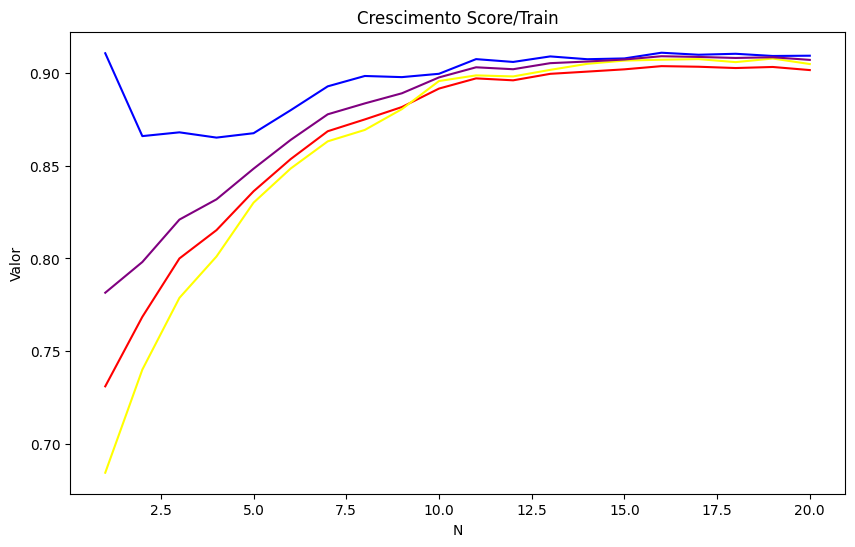

In [214]:
data_l = pd.DataFrame()
data_l['n'] = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
data_l['accuracy'] = accuracy_RFC
data_l['precision'] = precision_RFC
data_l['recall'] = recall_RFC
data_l['F1-score'] = f1_RFC
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.lineplot(data = data_l, x="n", y="accuracy", color = "red")
sns.lineplot(data = data_l, x="n", y="precision", color = "blue")
sns.lineplot(data = data_l, x="n", y="recall", color = "yellow")
sns.lineplot(data = data_l, x="n", y="F1-score", color = "purple")
plt.title("Crescimento Score/Train")  #Alteração do titulo
plt.xlabel("N")                                 #Alteração do indicador do eixo X
plt.ylabel("Valor")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

O grafico nos mostra que com n=10 ja seria bom a predição em que não aumenta significamente com n>10

In [215]:
forest.feature_importances_

array([0.01623665, 0.01151129, 0.01215032, 0.02406711, 0.03518419,
       0.01775411, 0.03028516, 0.02227069, 0.18768541, 0.00643701,
       0.01409812, 0.00763546, 0.00320271, 0.00848941, 0.00362749,
       0.01396513, 0.00773186, 0.00325509, 0.00891424, 0.00366768,
       0.01449759, 0.00755394, 0.00315792, 0.00838263, 0.0036361 ,
       0.0144703 , 0.0077852 , 0.0035087 , 0.00831939, 0.00337232,
       0.01583394, 0.0112105 , 0.0119999 , 0.0194132 , 0.0360461 ,
       0.01659378, 0.02932824, 0.02004219, 0.17254089, 0.00654571,
       0.01455454, 0.00785082, 0.00313576, 0.00858785, 0.00350471,
       0.01428779, 0.00747915, 0.0029816 , 0.00827856, 0.00340276,
       0.01435877, 0.00796396, 0.00312953, 0.00848131, 0.0033979 ,
       0.01359774, 0.00737215, 0.00332783, 0.00868001, 0.00321961])

In [216]:
data_l

,n,accuracy,precision,recall,F1-score
0,1,0.731050,0.910648,0.684476,0.781528
1,2,0.768525,0.865973,0.740061,0.798081
2,3,0.800000,0.868008,0.778745,0.820957
3,4,0.815275,0.865168,0.801060,0.831881
4,5,0.836225,0.867534,0.830096,0.848402
5,6,0.853575,0.879934,0.848492,0.863927
6,7,0.868600,0.892806,0.863150,0.877728
7,8,0.874975,0.898391,0.869304,0.883608
8,9,0.881650,0.897776,0.880524,0.889066
9,10,0.891600,0.899574,0.895674,0.897620


##Decision Tree Classifier

In [217]:
accuracy_DTC = []
precision_DTC = []
recall_DTC = []
f1_DTC = []
i = 1
while i<21:
  mod_dt = DecisionTreeClassifier(max_depth = i, random_state = 1)
  mod_dt.fit(x_train,y_train)
  prediction=mod_dt.predict(x_test)
  accuracy_DTC.append(metrics.accuracy_score(prediction,y_test))
  precision_DTC.append(metrics.precision_score(prediction,y_test))
  recall_DTC.append(metrics.recall_score(prediction,y_test))
  f1_DTC.append(metrics.f1_score(prediction,y_test))
  i+= 1

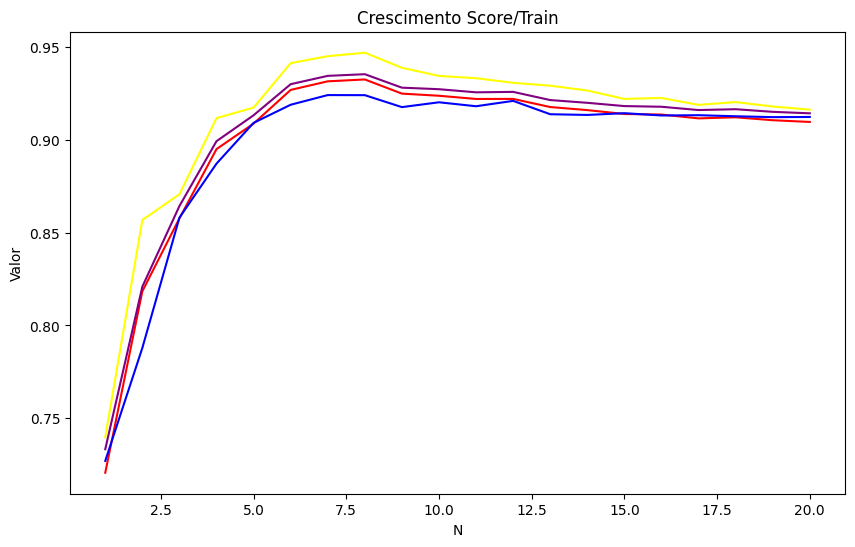

In [218]:
data_l = pd.DataFrame()
data_l['n'] = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
data_l['accuracy'] = accuracy_DTC
data_l['precision'] = precision_DTC
data_l['recall'] = recall_DTC
data_l['F1-score'] = f1_DTC
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.lineplot(data = data_l, x="n", y="accuracy", color = "red")
sns.lineplot(data = data_l, x="n", y="precision", color = "blue")
sns.lineplot(data = data_l, x="n", y="recall", color = "yellow")
sns.lineplot(data = data_l, x="n", y="F1-score", color = "purple")
plt.title("Crescimento Score/Train")  #Alteração do titulo
plt.xlabel("N")                                 #Alteração do indicador do eixo X
plt.ylabel("Valor")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

O grafico nos mostra que com n=7 ja seria bom a predição em que não aumenta significamente com n>7

In [219]:
mod_dt.feature_importances_

array([6.98961761e-03, 4.63100470e-03, 1.66725568e-02, 4.32458054e-03,
       1.99883650e-02, 3.80403198e-03, 3.10765594e-03, 4.38876879e-03,
       3.89121218e-01, 0.00000000e+00, 2.84339476e-03, 4.14984200e-03,
       9.37824913e-04, 3.12344052e-03, 1.84442684e-04, 5.88304370e-03,
       2.05605408e-03, 1.50584176e-03, 1.99133518e-03, 1.50942686e-03,
       5.45137805e-03, 2.53561301e-03, 2.64600600e-03, 2.87100098e-03,
       1.28574474e-03, 2.70365920e-03, 5.65672170e-04, 2.67949975e-04,
       4.73764569e-03, 8.56386940e-04, 4.66583071e-03, 7.18549555e-03,
       1.69316275e-02, 3.40128907e-03, 1.95394828e-02, 4.32845845e-03,
       2.99478361e-03, 1.55462522e-03, 3.96899274e-01, 0.00000000e+00,
       5.96448169e-03, 2.30988347e-03, 4.10368764e-04, 3.97187286e-04,
       9.04774104e-04, 3.96803867e-03, 1.71493759e-03, 1.01820991e-03,
       4.20471637e-03, 7.61117176e-04, 4.56178818e-03, 4.10157893e-03,
       2.00962481e-04, 1.94276027e-03, 1.04823042e-03, 3.15153426e-03,
      

In [220]:
data_l

,n,accuracy,precision,recall,F1-score
0,1,0.720700,0.727071,0.739744,0.733352
1,2,0.818375,0.787885,0.856775,0.820887
2,3,0.857650,0.858022,0.870630,0.864280
3,4,0.894950,0.887127,0.911633,0.899213
4,5,0.908675,0.909087,0.917291,0.913171
5,6,0.926825,0.918836,0.941242,0.929904
6,7,0.931450,0.924042,0.944971,0.934389
7,8,0.932450,0.923994,0.946848,0.935281
8,9,0.924825,0.917558,0.938750,0.928033
9,10,0.923675,0.920161,0.934355,0.927204


## Gaussian NB

In [221]:
mod_gnb_all = GaussianNB()
y_pred = mod_gnb_all.fit(x_train, y_train).predict(x_test)
print('The accuracy of the Guassian Naive Bayes Classifier on test data is',"{:.3f}".format(metrics.accuracy_score(y_pred,y_test)))
print('The precision of the Guassian Naive Bayes Classifier on test data is',"{:.3f}".format(metrics.precision_score(y_pred,y_test)))
print('The recall of the Guassian Naive Bayes Classifier on test data is',"{:.3f}".format(metrics.recall_score(y_pred,y_test)))
print('The F1-score of the Guassian Naive Bayes Classifier on test data is',"{:.3f}".format(metrics.f1_score(y_pred,y_test)))

The accuracy of the Guassian Naive Bayes Classifier on test data is 0.783
The precision of the Guassian Naive Bayes Classifier on test data is 0.794
The recall of the Guassian Naive Bayes Classifier on test data is 0.794
The F1-score of the Guassian Naive Bayes Classifier on test data is 0.794


In [222]:
mod_gnb_all.score(x_train,y_train)

0.7844

<Axes: >

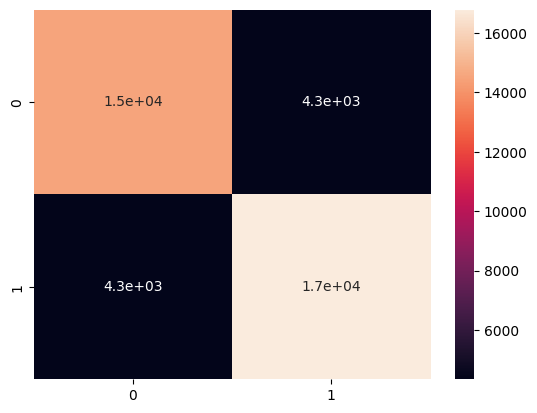

In [223]:
previsoes = mod_gnb_all.predict(x_test)
cm = confusion_matrix(y_test, previsoes)
sns.heatmap(cm, annot=True)

##KNeighborsClassifier

In [224]:
accuracy_KNN = []
precision_KNN = []
recall_KNN = []
f1_KNN = []
i = 1
while i<21:
  mod_5nn=KNeighborsClassifier(n_neighbors=i)
  mod_5nn.fit(x_train,y_train)
  prediction=mod_5nn.predict(x_test)
  accuracy_KNN.append(metrics.accuracy_score(prediction,y_test))
  precision_KNN.append(metrics.precision_score(prediction,y_test))
  recall_KNN.append(metrics.recall_score(prediction,y_test))
  f1_KNN.append(metrics.f1_score(prediction,y_test))
  i+= 1

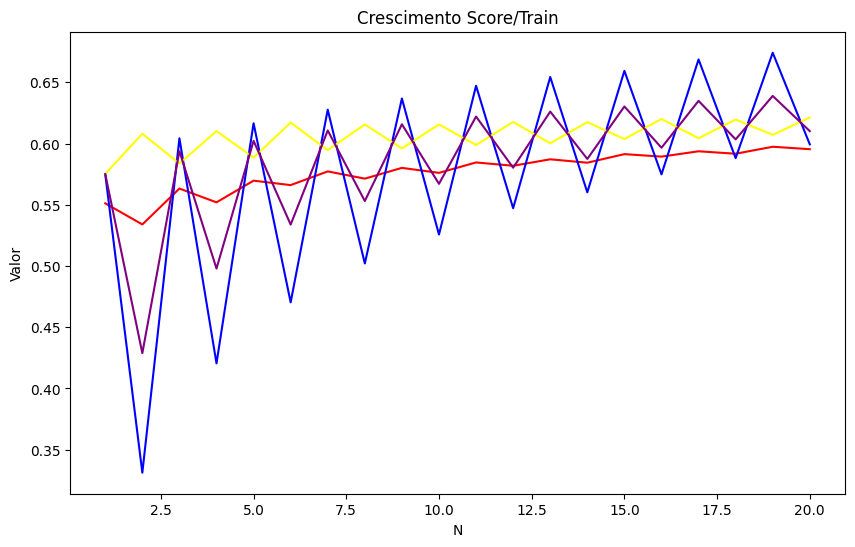

In [225]:
data_l = pd.DataFrame()
data_l['n'] = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
data_l['accuracy'] = accuracy_KNN
data_l['precision'] = precision_KNN
data_l['recall'] = recall_KNN
data_l['F1-score'] = f1_KNN
plt.figure(figsize=(10, 6)) #criação do tamanho da figura
sns.lineplot(data = data_l, x="n", y="accuracy", color = "red")
sns.lineplot(data = data_l, x="n", y="precision", color = "blue")
sns.lineplot(data = data_l, x="n", y="recall", color = "yellow")
sns.lineplot(data = data_l, x="n", y="F1-score", color = "purple")
plt.title("Crescimento Score/Train")  #Alteração do titulo
plt.xlabel("N")                                 #Alteração do indicador do eixo X
plt.ylabel("Valor")                           #Alteração do indicador do eixo Y
plt.show()                                         #Mostrar a imagem

O grafico desse classificador mostra que para esse tipo de predição é uma boa escolha, mostrando muita variancia entre ascenção do metodo e declinio e nao contendo valor proximo de 0.9

In [226]:
data_l

,n,accuracy,precision,recall,F1-score
0,1,0.551175,0.574917,0.575217,0.575067
1,2,0.533925,0.331188,0.608046,0.428812
2,3,0.563250,0.604259,0.583653,0.593778
3,4,0.551975,0.420492,0.610192,0.497885
4,5,0.569700,0.616564,0.588490,0.602200
5,6,0.566050,0.470327,0.617114,0.533813
6,7,0.577250,0.627638,0.594602,0.610674
7,8,0.571325,0.502082,0.615550,0.553056
8,9,0.580125,0.636772,0.596013,0.615719
9,10,0.576050,0.525698,0.615606,0.567111


## LDA Classifier

In [227]:
mod_lda_all = LinearDiscriminantAnalysis()
y_pred = mod_lda_all.fit(x_train, y_train).predict(x_test)
print('The accuracy of the LDA Classifier on test data is',"{:.3f}".format(metrics.accuracy_score(y_pred,y_test)))
print('The precision of the LDA Classifier on test data is',"{:.3f}".format(metrics.precision_score(y_pred,y_test)))
print('The recall of the LDA Classifier on test data is',"{:.3f}".format(metrics.recall_score(y_pred,y_test)))
print('The F1-score of the LDA Classifier on test data is',"{:.3f}".format(metrics.f1_score(y_pred,y_test)))

The accuracy of the LDA Classifier on test data is 0.885
The precision of the LDA Classifier on test data is 0.897
The recall of the LDA Classifier on test data is 0.886
The F1-score of the LDA Classifier on test data is 0.891


In [228]:
mod_lda_all.score(x_train,y_train)

0.8853

<Axes: >

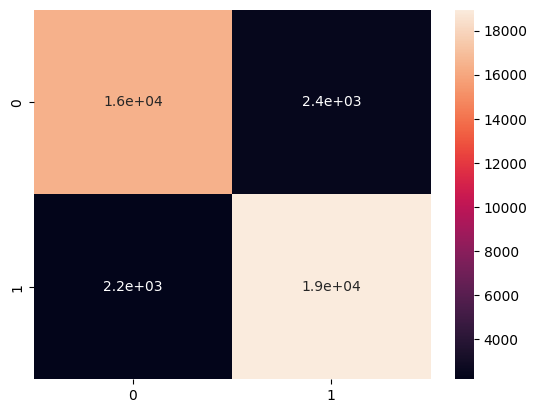

In [229]:
previsoes = mod_lda_all.predict(x_test)
cm = confusion_matrix(y_test, previsoes)
sns.heatmap(cm, annot=True)